In [1]:
import os
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.metrics import f1_score, make_scorer
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from pycaret.classification import *

from scipy.stats import chi2_contingency
from statsmodels.tools.tools import add_constant
from sklearn.preprocessing import LabelEncoder

# Suppress warnings
warnings.filterwarnings('ignore')

In [2]:
ROOT_DIR = "data"
RANDOM_STATE = 110

# Load data
train_data = pd.read_csv(os.path.join(ROOT_DIR, "train.csv"))
test_data = pd.read_csv(os.path.join(ROOT_DIR, "test.csv"))

In [3]:
# X좌표의 "OK"를 NaN으로 변환

columns_to_replace_ok = [
    'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1',
    'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill2'
]

# Train 데이터셋에서 "OK" 값을 NaN으로 변경
for column in columns_to_replace_ok:
    train_data[column] = train_data[column].replace('OK', np.nan).astype(float)

# Test 데이터셋에서 "OK" 값을 NaN으로 변경
for column in columns_to_replace_ok:
    test_data[column] = test_data[column].replace('OK', np.nan).astype(float)

In [4]:
def shift_and_fill(data, start_col, end_col, step):
    
    start_idx = data.columns.get_loc(start_col)
    
    end_idx = data.columns.get_loc(end_col)

    missing_indices = data[data[start_col].isnull()].index
    
    # 결측치가 있는 각 행에 대하여 처리
    for idx in missing_indices:
        current_idx = start_idx
        
        while current_idx <= end_idx - step:
            next_idx = current_idx + step
            data.iloc[idx, current_idx] = data.iloc[idx, next_idx]
            current_idx = next_idx
        
        data.iloc[idx, end_idx] = np.nan



In [5]:
#Dam
shift_and_fill(train_data, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam', 
               'WorkMode Collect Result_Dam', 3)
shift_and_fill(test_data, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam', 
               'WorkMode Collect Result_Dam', 3)
#Fill1
shift_and_fill(train_data, "HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1",
               'WorkMode Collect Result_Fill1', 3)
shift_and_fill(test_data, "HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1",
               'WorkMode Collect Result_Fill1', 3)

#Fill2
shift_and_fill(train_data, "HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill2",
               'WorkMode Collect Result_Fill2', 3)
shift_and_fill(test_data, "HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill2",
               'WorkMode Collect Result_Fill2', 3)


C:\Users\atlsw\AppData\Local\Temp\ipykernel_4436\808052325.py:15: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.012' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  data.iloc[idx, current_idx] = data.iloc[idx, next_idx]
C:\Users\atlsw\AppData\Local\Temp\ipykernel_4436\808052325.py:15: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '-0.054' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  data.iloc[idx, current_idx] = data.iloc[idx, next_idx]
C:\Users\atlsw\AppData\Local\Temp\ipykernel_4436\808052325.py:15: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '114.612' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  data.iloc[idx, current_idx] = data.iloc[idx, ne

In [6]:
# 마지막 열 채워주기

# train_data
train_data['WorkMode Collect Result_Fill1'] = 7
train_data['WorkMode Collect Result_Dam'] = 7
train_data['WorkMode Collect Result_Fill2'] = 0

# test_data
test_data['WorkMode Collect Result_Fill1'] = 7
test_data['WorkMode Collect Result_Dam'] = 7
test_data['WorkMode Collect Result_Fill2'] = 0


In [ ]:
train_data['']

In [148]:
for i in nan_col:
    print(i)

CURE END POSITION X Unit Time_Dam
CURE END POSITION X Judge Value_Dam
CURE END POSITION Z Unit Time_Dam
CURE END POSITION Z Judge Value_Dam
CURE END POSITION Θ Unit Time_Dam
CURE END POSITION Θ Judge Value_Dam
CURE SPEED Unit Time_Dam
CURE SPEED Judge Value_Dam
CURE STANDBY POSITION X Unit Time_Dam
CURE STANDBY POSITION X Judge Value_Dam
CURE STANDBY POSITION Z Unit Time_Dam
CURE STANDBY POSITION Z Judge Value_Dam
CURE STANDBY POSITION Θ Unit Time_Dam
CURE STANDBY POSITION Θ Judge Value_Dam
CURE START POSITION X Unit Time_Dam
CURE START POSITION X Judge Value_Dam
CURE START POSITION Z Unit Time_Dam
CURE START POSITION Z Judge Value_Dam
CURE START POSITION Θ Unit Time_Dam
CURE START POSITION Θ Judge Value_Dam
DISCHARGED SPEED OF RESIN Unit Time_Dam
DISCHARGED SPEED OF RESIN Judge Value_Dam
DISCHARGED TIME OF RESIN(Stage1) Unit Time_Dam
DISCHARGED TIME OF RESIN(Stage1) Judge Value_Dam
DISCHARGED TIME OF RESIN(Stage2) Unit Time_Dam
DISCHARGED TIME OF RESIN(Stage2) Judge Value_Dam
DISCHARG

In [2]:
train_data = pd.read_csv('train_new.csv')
test_data = pd.read_csv('test_new.csv')

nan_col = train_data.columns[train_data.isna().all()]
train_data = train_data.drop(nan_col, axis=1)
test_data = test_data.drop(nan_col, axis=1)

single_value_columns = train_data.columns[train_data.apply(lambda col: col.nunique(dropna=False) == 1)]
single_value_columns

Index(['Wip Line_Dam', 'Process Desc._Dam', 'Insp. Seq No._Dam',
       'Insp Judge Code_Dam', 'CURE STANDBY POSITION X Collect Result_Dam',
       'CURE STANDBY POSITION Z Collect Result_Dam',
       'CURE STANDBY POSITION Θ Collect Result_Dam',
       'CURE START POSITION Z Collect Result_Dam',
       'HEAD Standby Position X Collect Result_Dam',
       'HEAD Standby Position Y Collect Result_Dam',
       'HEAD Standby Position Z Collect Result_Dam',
       'Head Clean Position X Collect Result_Dam',
       'Head Clean Position Y Collect Result_Dam',
       'Head Purge Position X Collect Result_Dam',
       'Head Purge Position Y Collect Result_Dam',
       'Head Zero Position X Collect Result_Dam',
       'WorkMode Collect Result_Dam', 'Wip Line_AutoClave',
       'Process Desc._AutoClave', 'Equipment_AutoClave',
       'Insp. Seq No._AutoClave', 'Insp Judge Code_AutoClave',
       '1st Pressure Judge Value_AutoClave',
       '2nd Pressure Judge Value_AutoClave',
       '3rd Pressur

In [3]:
ID_col = test_data['Set ID']
test_data = test_data.drop(['Set ID', 'target'], axis=1)

# 1. 모두 제거 (public_score = 1.6)

In [52]:
all_del_train = train_data.drop(single_value_columns, axis=1)
all_del_test = test_data.drop(single_value_columns, axis=1)

In [9]:
y = all_del_train['target']
X = all_del_train.drop('target', axis=1)

train_X, test_X, train_y, test_y = train_test_split(
    X, y, test_size=0.2, random_state=42)

# 결과 확인
print(f"Train set: {train_X.shape}, {train_y.value_counts()}", '\n')
print(f"Test set: {test_X.shape}, {test_y.value_counts()}")

Train set: (32404, 123), target
Normal      30512
AbNormal     1892
Name: count, dtype: int64 

Test set: (8102, 123), target
Normal      7644
AbNormal     458
Name: count, dtype: int64


In [10]:
clf = setup(data = train_X, target = train_y, session_id = 42)
models = compare_models(sort = 'F1', n_select = 1)

,Description,Value
0,Session id,42
1,Target,target
2,Target type,Binary
3,Target mapping,"AbNormal: 0, Normal: 1"
4,Original data shape,"(32404, 124)"
5,Transformed data shape,"(32404, 148)"
6,Transformed train set shape,"(22682, 148)"
7,Transformed test set shape,"(9722, 148)"
8,Numeric features,106
9,Categorical features,17


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
catboost,CatBoost Classifier,0.9453,0.0000,0.9453,0.9392,0.9236,0.1371,0.2451,3.7740
rf,Random Forest Classifier,0.9434,0.0000,0.9434,0.9270,0.9215,0.1170,0.1975,0.5890
xgboost,Extreme Gradient Boosting,0.9430,0.0000,0.9430,0.9246,0.9214,0.1182,0.1915,0.3470
qda,Quadratic Discriminant Analysis,0.9403,0.0000,0.9403,0.9190,0.9208,0.1258,0.1801,0.3620
lightgbm,Light Gradient Boosting Machine,0.9440,0.0000,0.9440,0.9337,0.9207,0.1008,0.1973,0.4130
et,Extra Trees Classifier,0.9393,0.0000,0.9393,0.9141,0.9204,0.1253,0.1653,0.5890
lda,Linear Discriminant Analysis,0.9378,0.0000,0.9378,0.9133,0.9203,0.1347,0.1683,0.3800
ridge,Ridge Classifier,0.9436,0.0000,0.9436,0.9337,0.9194,0.0830,0.1801,0.2110
gbc,Gradient Boosting Classifier,0.9436,0.0000,0.9436,0.9359,0.9192,0.0789,0.1753,1.3050
ada,Ada Boost Classifier,0.9432,0.0000,0.9432,0.9367,0.9183,0.0678,0.1654,0.5310


In [12]:
from sklearn.metrics import f1_score
pred = predict_model(models, data = test_X)
thresholds = np.arange(0.50, 1.00, 0.01)

f1_scores = []

for threshold in thresholds:
    # 임계값을 기준으로 라벨 생성
    y_pred = ['Normal' if score >= threshold else 'AbNormal' for score in pred['prediction_score']]
    
    # F1 스코어 계산
    f1 = f1_score(test_y, y_pred, pos_label='AbNormal')
    f1_scores.append((threshold, f1))

# 결과 출력
for threshold, f1 in f1_scores:
    print(f"Threshold: {threshold:.2f}, F1 Score: {f1:.4f}")

Threshold: 0.50, F1 Score: 0.0000
Threshold: 0.51, F1 Score: 0.0043
Threshold: 0.52, F1 Score: 0.0086
Threshold: 0.53, F1 Score: 0.0172
Threshold: 0.54, F1 Score: 0.0214
Threshold: 0.55, F1 Score: 0.0255
Threshold: 0.56, F1 Score: 0.0255
Threshold: 0.57, F1 Score: 0.0294
Threshold: 0.58, F1 Score: 0.0335
Threshold: 0.59, F1 Score: 0.0333
Threshold: 0.60, F1 Score: 0.0371
Threshold: 0.61, F1 Score: 0.0449
Threshold: 0.62, F1 Score: 0.0486
Threshold: 0.63, F1 Score: 0.0482
Threshold: 0.64, F1 Score: 0.0521
Threshold: 0.65, F1 Score: 0.0519
Threshold: 0.66, F1 Score: 0.0553
Threshold: 0.67, F1 Score: 0.0665
Threshold: 0.68, F1 Score: 0.0768
Threshold: 0.69, F1 Score: 0.0789
Threshold: 0.70, F1 Score: 0.0860
Threshold: 0.71, F1 Score: 0.0909
Threshold: 0.72, F1 Score: 0.1075
Threshold: 0.73, F1 Score: 0.1183
Threshold: 0.74, F1 Score: 0.1162
Threshold: 0.75, F1 Score: 0.1240
Threshold: 0.76, F1 Score: 0.1250
Threshold: 0.77, F1 Score: 0.1254
Threshold: 0.78, F1 Score: 0.1269
Threshold: 0.7

In [53]:
pred = predict_model(models, data =all_del_test)
y_pred = ['Normal' if score >= 0.86 else 'AbNormal' for score in pred['prediction_score']]

In [55]:
sub_data = pd.read_csv("submission.csv")
sub_data['target'] = y_pred

sub_data.to_csv('submission.csv', index=False)

# 2. 완전 상관 제거 (score = 1.65)

In [82]:
all_del_train = train_data.drop(single_value_columns, axis=1)
all_del_test = test_data.drop(single_value_columns, axis=1)

In [83]:
train_num = all_del_train.select_dtypes(include=[np.number])

print('제거 전 데이터 프레임 형태:', train_num.shape)
print('\n')
# 상관 행렬 계산
corr_matrix = train_num.corr().abs()

# 상관계수의 절댓값이 0.90를 넘는 변수 쌍을 선택
upper_triangle = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# 절댓값이 0.9를 넘는 변수 중 하나를 제거
to_drop = [column for column in upper_triangle.columns if any(upper_triangle[column] > 0.9)]

# 제거할 변수 리스트 출력
print("제거할 변수들 :", to_drop)
print('\n')

# 변수 제거
train_reduced = all_del_train.drop(to_drop, axis=1)
test_reduced = all_del_test.drop(to_drop, axis=1)

# 최종 데이터프레임 확인
print("최종 데이터프레임 형태 :", train_reduced.shape)
print("test :", test_reduced.shape)

제거 전 데이터 프레임 형태: (40506, 106)


제거할 변수들 : ['CURE END POSITION Z Collect Result_Dam', 'CURE END POSITION Θ Collect Result_Dam', 'CURE START POSITION X Collect Result_Dam', 'CURE START POSITION Θ Collect Result_Dam', 'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam', 'Dispense Volume(Stage3) Collect Result_Dam', 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam', 'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam', 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam', 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam', 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam', 'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Dam', 'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Dam', 'Head Clean Position Z Collect Result_Dam', 'Stage1 Circle1 Distance Speed Collect Result_Dam', 'Stage1 Circle2 Distance Speed Collect Result_Dam', 'Stage1 Circle3 Distance Speed Collect Result_Dam', 'Stage1 Circle4 Distance Speed Collect Result_Dam', 'Stage1 Line

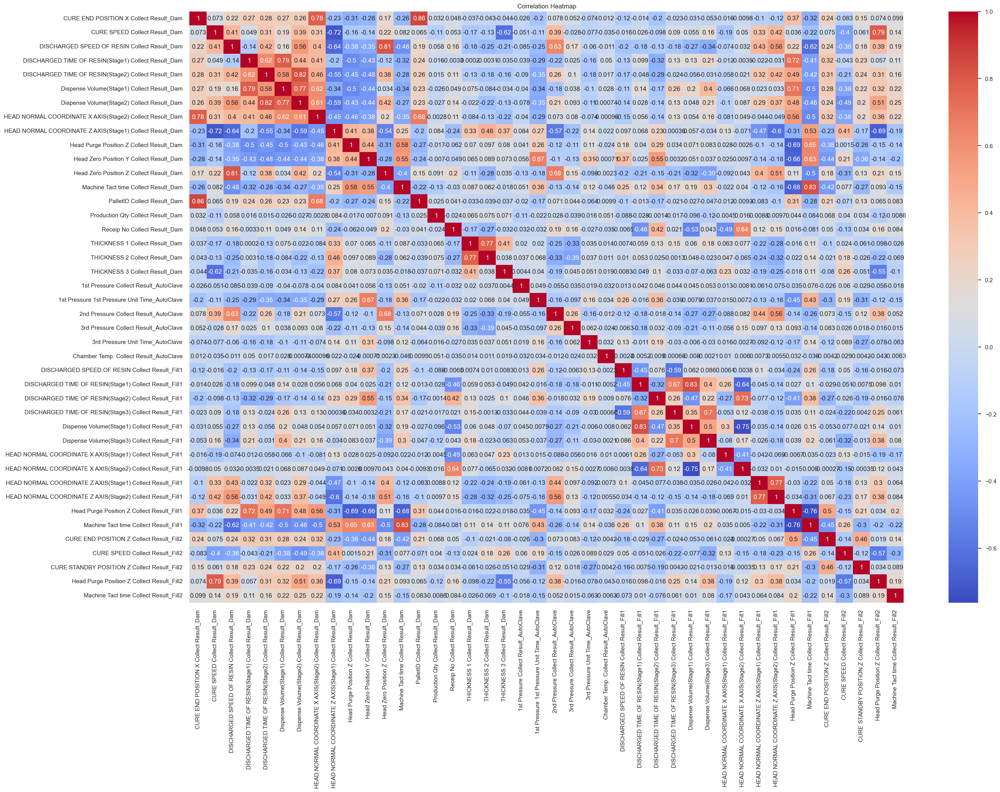

In [70]:
train_num = train_reduced.select_dtypes(include=[np.number])
sns.set(font_scale=1)
plt.figure(figsize=(30, 20))
sns.heatmap(train_num.corr(method='pearson'), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [154]:
def calculate_cramers_v(DA_data):
    categorical_columns = DA_data.select_dtypes(include=['category', 'object']).columns
    categorical_df = DA_data[categorical_columns]

    for col in categorical_df.columns:
        categorical_df[col] = categorical_df[col].apply(lambda x: str(x) if isinstance(x, tuple) else x)

    label = preprocessing.LabelEncoder()
    data_encoded = pd.DataFrame() 

    for i in categorical_df.columns:
        data_encoded[i] = label.fit_transform(categorical_df[i])

    def cramers_V(var1, var2):
        crosstab = np.array(pd.crosstab(var1, var2, rownames=None, colnames=None))  # Cross table building
        stat = chi2_contingency(crosstab)[0]  # Chi2 test statistic
        obs = np.sum(crosstab)  # Number of observations
        phi2 = stat / obs
        r, k = crosstab.shape
        phi2corr = max(0, phi2 - (((k-1)*(r-1)) / (obs - 1)))
        rcorr = r - ((r-1)**2) / (obs - 1)
        kcorr = k - ((k-1)**2) / (obs - 1)
        return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))

    rows = []

    for var1 in data_encoded:
        col = []
        for var2 in data_encoded:
            cramers = cramers_V(data_encoded[var1], data_encoded[var2])  # Cramer's V test
            col.append(round(cramers, 2))  # Rounded Cramer's V value
        rows.append(col)
  
    cramers_results = np.array(rows)
    cv = pd.DataFrame(cramers_results, columns=data_encoded.columns, index=data_encoded.columns)
    
    return cv

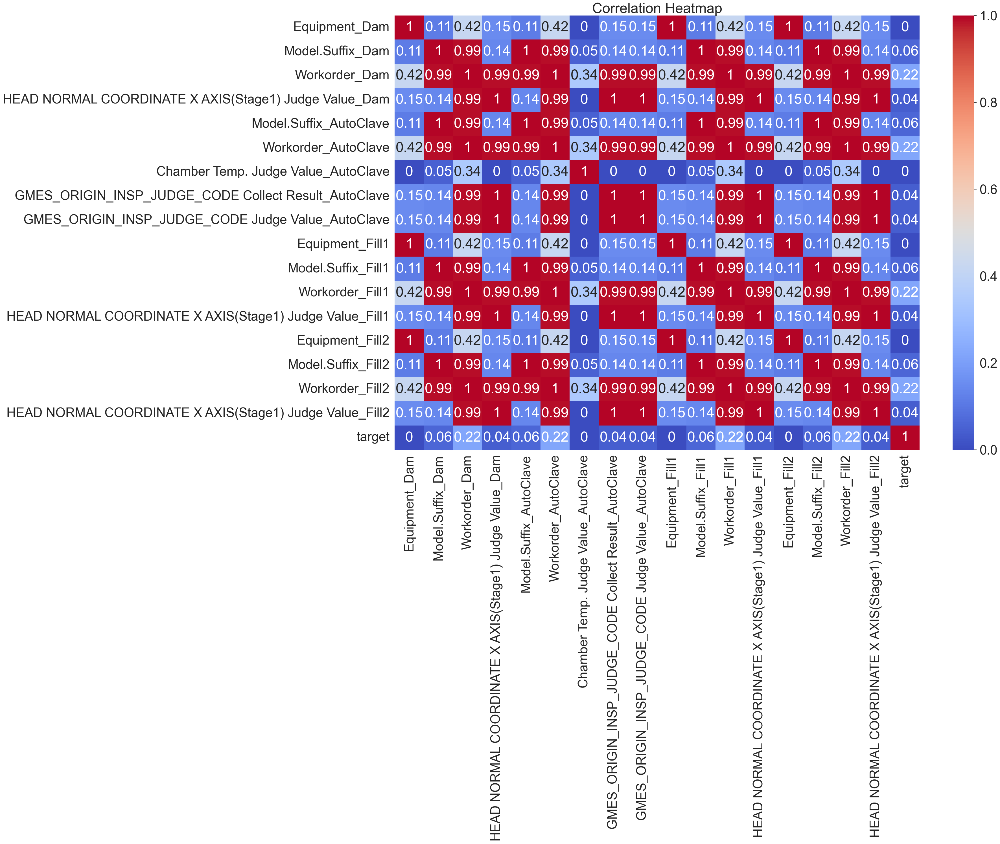

In [76]:
cv_matrix = calculate_cramers_v(train_reduced)
sns.set(font_scale=3)
plt.figure(figsize=(30, 20))
sns.heatmap(cv_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [155]:
def find_matching_high_corr_pairs(cv_matrix, dataframe, threshold=0.9, near_one_tol=1e-5):
    matching_pairs = []

    # 상관 관계가 높은 변수 쌍 찾기
    for i in range(len(cv_matrix)):
        for j in range(i + 1, len(cv_matrix)):
            var1 = cv_matrix.index[i]
            var2 = cv_matrix.columns[j]
            corr_value = cv_matrix.iloc[i, j]

            if corr_value > threshold or np.isclose(corr_value, 1.0, atol=near_one_tol):
                # 각 변수의 고유 값 개수 계산
                unique_var1 = dataframe[var1].nunique()
                unique_var2 = dataframe[var2].nunique()

                # 고유 값 개수가 동일한 경우만 선택
                if unique_var1 == unique_var2:
                    matching_pairs.append((var1, var2, corr_value, unique_var1, unique_var2))
    
    # 결과 출력
    if matching_pairs:
        for pair_info in matching_pairs:
            print(f"\n변수 쌍: {pair_info[0]} - {pair_info[1]}, Cramér's V 값: {pair_info[2]}")
            print(f"{pair_info[0]} 고유 값 개수: {pair_info[3]}")
            print(f"{pair_info[1]} 고유 값 개수: {pair_info[4]}")
    else:
        print("고유 값 개수가 같은 높은 상관관계 쌍이 없습니다.")

In [78]:
find_matching_high_corr_pairs(cv_matrix, train_reduced)


변수 쌍: Equipment_Dam - Equipment_Fill1, Cramér's V 값: 1.0
Equipment_Dam 고유 값 개수: 2
Equipment_Fill1 고유 값 개수: 2

변수 쌍: Equipment_Dam - Equipment_Fill2, Cramér's V 값: 1.0
Equipment_Dam 고유 값 개수: 2
Equipment_Fill2 고유 값 개수: 2

변수 쌍: Model.Suffix_Dam - Model.Suffix_AutoClave, Cramér's V 값: 1.0
Model.Suffix_Dam 고유 값 개수: 7
Model.Suffix_AutoClave 고유 값 개수: 7

변수 쌍: Model.Suffix_Dam - Model.Suffix_Fill1, Cramér's V 값: 1.0
Model.Suffix_Dam 고유 값 개수: 7
Model.Suffix_Fill1 고유 값 개수: 7

변수 쌍: Model.Suffix_Dam - Model.Suffix_Fill2, Cramér's V 값: 1.0
Model.Suffix_Dam 고유 값 개수: 7
Model.Suffix_Fill2 고유 값 개수: 7

변수 쌍: Workorder_Dam - Workorder_AutoClave, Cramér's V 값: 1.0
Workorder_Dam 고유 값 개수: 663
Workorder_AutoClave 고유 값 개수: 663

변수 쌍: Workorder_Dam - Workorder_Fill1, Cramér's V 값: 1.0
Workorder_Dam 고유 값 개수: 663
Workorder_Fill1 고유 값 개수: 663

변수 쌍: Workorder_Dam - Workorder_Fill2, Cramér's V 값: 1.0
Workorder_Dam 고유 값 개수: 663
Workorder_Fill2 고유 값 개수: 663

변수 쌍: HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value

In [84]:
train_reduced = train_reduced.drop(['Equipment_Fill1', 'Equipment_Fill2', 'Model.Suffix_AutoClave',
                                   'Model.Suffix_Fill1', 'Model.Suffix_Fill2', 'Workorder_AutoClave',
                                   'Workorder_Fill1', 'Workorder_Fill2',
                                    
                                    'GMES_ORIGIN_INSP_JUDGE_CODE Collect Result_AutoClave',
                                   'GMES_ORIGIN_INSP_JUDGE_CODE Judge Value_AutoClave',
                                   'HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Fill1',
                                   'HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Fill2',], axis=1)
test_reduced = test_reduced.drop(['Equipment_Fill1', 'Equipment_Fill2', 'Model.Suffix_AutoClave',
                                   'Model.Suffix_Fill1', 'Model.Suffix_Fill2', 'Workorder_AutoClave',
                                   'Workorder_Fill1', 'Workorder_Fill2',
                                    
                                    'GMES_ORIGIN_INSP_JUDGE_CODE Collect Result_AutoClave',
                                   'GMES_ORIGIN_INSP_JUDGE_CODE Judge Value_AutoClave',
                                   'HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Fill1',
                                   'HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Fill2',], axis=1)

In [86]:
y = train_reduced['target']
X = train_reduced.drop('target', axis=1)

train_X, test_X, train_y, test_y = train_test_split(
    X, y, test_size=0.2, random_state=42)

# 결과 확인
print(f"Train set: {train_X.shape}, {train_y.value_counts()}", '\n')
print(f"Test set: {test_X.shape}, {test_y.value_counts()}")

Train set: (32404, 47), target
Normal      30512
AbNormal     1892
Name: count, dtype: int64 

Test set: (8102, 47), target
Normal      7644
AbNormal     458
Name: count, dtype: int64


In [88]:
clf = setup(data = train_X, target = train_y, session_id = 42)
models = compare_models(sort = 'F1', n_select = 3)

,Description,Value
0,Session id,42
1,Target,target
2,Target type,Binary
3,Target mapping,"AbNormal: 0, Normal: 1"
4,Original data shape,"(32404, 48)"
5,Transformed data shape,"(32404, 54)"
6,Transformed train set shape,"(22682, 54)"
7,Transformed test set shape,"(9722, 54)"
8,Numeric features,42
9,Categorical features,5


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.9436,0.0000,0.9436,0.9283,0.9214,0.1132,0.1974,0.3670
xgboost,Extreme Gradient Boosting,0.9422,0.0000,0.9422,0.9208,0.9213,0.1214,0.1832,0.1320
catboost,CatBoost Classifier,0.9438,0.0000,0.9438,0.9315,0.9207,0.1024,0.1940,2.9340
et,Extra Trees Classifier,0.9398,0.0000,0.9398,0.9157,0.9204,0.1228,0.1688,0.3050
lightgbm,Light Gradient Boosting Machine,0.9438,0.0000,0.9438,0.9345,0.9204,0.0970,0.1946,0.1890
gbc,Gradient Boosting Classifier,0.9435,0.0000,0.9435,0.9334,0.9191,0.0786,0.1709,0.5930
ada,Ada Boost Classifier,0.9429,0.0000,0.9429,0.9317,0.9174,0.0562,0.1440,0.2290
lda,Linear Discriminant Analysis,0.9335,0.0000,0.9335,0.9066,0.9166,0.1042,0.1247,0.1090
knn,K Neighbors Classifier,0.9408,0.0000,0.9408,0.9119,0.9163,0.0507,0.0998,0.1130
ridge,Ridge Classifier,0.9422,0.0000,0.9422,0.9249,0.9159,0.0372,0.1077,0.0790


In [89]:
cat = create_model('catboost', fold = 10)
xgb = create_model('xgboost', fold = 10)
rf = create_model('rf', fold = 10)

m1 = tune_model(cat, fold = 10, n_iter = 10, optimize = 'F1')
m2 = tune_model(xgb, fold = 10, n_iter = 10, optimize = 'F1')
m3 = tune_model(rf, fold = 10, n_iter = 10, optimize = 'F1')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9449,0.0000,0.9449,0.9365,0.9234,0.1401,0.2439
1,0.9445,0.0000,0.9445,0.9322,0.9237,0.1487,0.2394
2,0.9427,0.0000,0.9427,0.9231,0.9210,0.1104,0.1816
3,0.9427,0.0000,0.9427,0.9273,0.9173,0.0532,0.1339
4,0.9436,0.0000,0.9436,0.9304,0.9201,0.0911,0.1824
5,0.9427,0.0000,0.9427,0.9273,0.9173,0.0532,0.1339
6,0.9440,0.0000,0.9440,0.9350,0.9204,0.0925,0.1940
7,0.9471,0.0000,0.9471,0.9434,0.9271,0.1789,0.2941
8,0.9427,0.0000,0.9427,0.9300,0.9177,0.0660,0.1553


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9440,0.0000,0.9440,0.9288,0.9247,0.1668,0.2434
1,0.9431,0.0000,0.9431,0.9257,0.9247,0.1728,0.2376
2,0.9422,0.0000,0.9422,0.9216,0.9220,0.1299,0.1923
3,0.9409,0.0000,0.9409,0.9130,0.9171,0.0603,0.1117
4,0.9400,0.0000,0.9400,0.9148,0.9200,0.1123,0.1583
5,0.9440,0.0000,0.9440,0.9288,0.9231,0.1362,0.2186
6,0.9409,0.0000,0.9409,0.9165,0.9199,0.1047,0.1578
7,0.9453,0.0000,0.9453,0.9315,0.9276,0.1999,0.2740
8,0.9414,0.0000,0.9414,0.9173,0.9170,0.0622,0.1250


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9454,0.0000,0.9454,0.9401,0.9236,0.1417,0.2545
1,0.9440,0.0000,0.9440,0.9307,0.9228,0.1368,0.2256
2,0.9440,0.0000,0.9440,0.9283,0.9238,0.1464,0.2251
3,0.9427,0.0000,0.9427,0.9236,0.9196,0.0884,0.1636
4,0.9427,0.0000,0.9427,0.9236,0.9196,0.0884,0.1636
5,0.9422,0.0000,0.9422,0.9210,0.9186,0.0756,0.1453
6,0.9436,0.0000,0.9436,0.9272,0.9222,0.1241,0.2041
7,0.9475,0.0000,0.9475,0.9442,0.9280,0.1906,0.3059
8,0.9422,0.0000,0.9422,0.9236,0.9182,0.0763,0.1533


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9436,0.0000,0.9436,0.9345,0.9198,0.0918,0.1932
1,0.9462,0.0000,0.9462,0.9450,0.9249,0.1556,0.2794
2,0.9422,0.0000,0.9422,0.9210,0.9200,0.0981,0.1656
3,0.9422,0.0000,0.9422,0.9230,0.9163,0.0397,0.1088
4,0.9418,0.0000,0.9418,0.9179,0.9176,0.0627,0.1256
5,0.9414,0.0000,0.9414,0.9110,0.9150,0.0251,0.0686
6,0.9444,0.0000,0.9444,0.9406,0.9206,0.0940,0.2076
7,0.9458,0.0000,0.9458,0.9382,0.9249,0.1532,0.2585
8,0.9405,0.0000,0.9405,0.9110,0.9157,0.0481,0.0967


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9440,0.0000,0.9440,0.9472,0.9193,0.0817,0.2064
1,0.9445,0.0000,0.9445,0.9376,0.9217,0.1171,0.2257
2,0.9453,0.0000,0.9453,0.9429,0.9226,0.1195,0.2393
3,0.9431,0.0000,0.9431,0.9351,0.9176,0.0544,0.1489
4,0.9431,0.0000,0.9431,0.9351,0.9176,0.0544,0.1489
5,0.9431,0.0000,0.9431,0.9464,0.9168,0.0420,0.1464
6,0.9440,0.0000,0.9440,0.9392,0.9196,0.0809,0.1899
7,0.9458,0.0000,0.9458,0.9438,0.9236,0.1321,0.2537
8,0.9422,0.0000,0.9422,0.9313,0.9159,0.0405,0.1237


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9445,0.0000,0.9445,0.9476,0.9203,0.0947,0.2229
1,0.9436,0.0000,0.9436,0.9468,0.9182,0.0685,0.1883
2,0.9436,0.0000,0.9436,0.9329,0.9194,0.0796,0.1758
3,0.9422,0.0000,0.9422,0.9456,0.9147,0.0142,0.0845
4,0.9427,0.0000,0.9427,0.9318,0.9165,0.0408,0.1242
5,0.9418,0.0000,0.9418,0.9165,0.9144,0.0132,0.0561
6,0.9440,0.0000,0.9440,0.9471,0.9189,0.0690,0.1891
7,0.9444,0.0000,0.9444,0.9406,0.9206,0.0940,0.2076
8,0.9427,0.0000,0.9427,0.9460,0.9161,0.0416,0.1458


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [90]:
blended = blend_models(estimator_list = [m1, m2, m3],
                       fold = 10,
                       method = 'soft',
                       optimize='F1'
                       )

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9462,0.0000,0.9462,0.9421,0.9255,0.1658,0.2806
1,0.9458,0.0000,0.9458,0.9411,0.9246,0.1538,0.2678
2,0.9453,0.0000,0.9453,0.9353,0.9246,0.1515,0.2491
3,0.9431,0.0000,0.9431,0.9351,0.9176,0.0544,0.1489
4,0.9422,0.0000,0.9422,0.9210,0.9200,0.0981,0.1656
5,0.9436,0.0000,0.9436,0.9374,0.9186,0.0677,0.1705
6,0.9444,0.0000,0.9444,0.9366,0.9214,0.1053,0.2109
7,0.9475,0.0000,0.9475,0.9442,0.9280,0.1906,0.3059
8,0.9436,0.0000,0.9436,0.9387,0.9190,0.0803,0.1891


In [91]:
from sklearn.metrics import f1_score
pred = predict_model(blended, data = test_X)
thresholds = np.arange(0.50, 1.00, 0.01)

f1_scores = []

for threshold in thresholds:
    # 임계값을 기준으로 라벨 생성
    y_pred = ['Normal' if score >= threshold else 'AbNormal' for score in pred['prediction_score']]
    
    # F1 스코어 계산
    f1 = f1_score(test_y, y_pred, pos_label='AbNormal')
    f1_scores.append((threshold, f1))

# 결과 출력
for threshold, f1 in f1_scores:
    print(f"Threshold: {threshold:.2f}, F1 Score: {f1:.4f}")

Threshold: 0.50, F1 Score: 0.0000
Threshold: 0.51, F1 Score: 0.0043
Threshold: 0.52, F1 Score: 0.0086
Threshold: 0.53, F1 Score: 0.0086
Threshold: 0.54, F1 Score: 0.0171
Threshold: 0.55, F1 Score: 0.0170
Threshold: 0.56, F1 Score: 0.0253
Threshold: 0.57, F1 Score: 0.0333
Threshold: 0.58, F1 Score: 0.0333
Threshold: 0.59, F1 Score: 0.0330
Threshold: 0.60, F1 Score: 0.0369
Threshold: 0.61, F1 Score: 0.0447
Threshold: 0.62, F1 Score: 0.0483
Threshold: 0.63, F1 Score: 0.0518
Threshold: 0.64, F1 Score: 0.0542
Threshold: 0.65, F1 Score: 0.0648
Threshold: 0.66, F1 Score: 0.0752
Threshold: 0.67, F1 Score: 0.0779
Threshold: 0.68, F1 Score: 0.0844
Threshold: 0.69, F1 Score: 0.0978
Threshold: 0.70, F1 Score: 0.0998
Threshold: 0.71, F1 Score: 0.1103
Threshold: 0.72, F1 Score: 0.1149
Threshold: 0.73, F1 Score: 0.1236
Threshold: 0.74, F1 Score: 0.1283
Threshold: 0.75, F1 Score: 0.1390
Threshold: 0.76, F1 Score: 0.1412
Threshold: 0.77, F1 Score: 0.1425
Threshold: 0.78, F1 Score: 0.1475
Threshold: 0.7

In [93]:
pred = predict_model(blended, data =test_reduced)
y_pred = ['Normal' if score >= 0.88 else 'AbNormal' for score in pred['prediction_score']]

sub_data = pd.read_csv("submission.csv")
sub_data['target'] = y_pred

sub_data.to_csv('submission.csv', index=False)

# 3. 파생변수 + 완전 상관 제거

## 3.1 WorkOrder 파생변수

In [4]:
# 값 분리 및 변환 함수
def split_and_separate(row):
    # '-'를 기준으로 문자열 분리
    parts = row.split('-')
    if len(parts) == 2:
        # 대시 이전 부분을 문자 단위로 분리
        before_dash = [char for char in parts[0]]
        # 대시 이후 부분은 전체를 하나의 값으로 처리
        after_dash = [parts[1]]
        return before_dash + after_dash
    else:
        # 분리된 부분이 예상과 다르면 오류 처리
        return [None] * (len(parts[0]) + 1)

# 적용 및 DataFrame 변환
max_length = train_data['Workorder_Dam'].apply(lambda x: len(x.split('-')[0]) + 1).max()
column_names = [f'char_{i+1}_Dam' for i in range(max_length - 1)] + ['after_dash_Dam']
df_transformed = pd.DataFrame(train_data['Workorder_Dam'].apply(split_and_separate).tolist(), columns=column_names)
train_data = pd.concat([train_data, df_transformed], axis=1)

max_length = test_data['Workorder_Dam'].apply(lambda x: len(x.split('-')[0]) + 1).max()
column_names = [f'char_{i+1}_Dam' for i in range(max_length - 1)] + ['after_dash_Dam']
df_transformed = pd.DataFrame(test_data['Workorder_Dam'].apply(split_and_separate).tolist(), columns=column_names)
test_data = pd.concat([test_data, df_transformed], axis=1)

## 3.2 변수들 간의 관계 파생변수 생성

1) CURE START/STANDBY/END : 각 좌표 변화, 벡터 크기 [Dam, Fill2]

In [5]:
def create_derived_features(data, stages):
    # 파생변수를 담을 데이터프레임
    derived_features = pd.DataFrame()

    # 벡터 크기 계산 함수
    def calculate_vector_magnitude(data, start_x, start_z, end_x, end_z):
        return np.sqrt(
            (data[end_x] - data[start_x])**2 +
            (data[end_z] - data[start_z])**2
        )


    # 좌표 차이값 계산 함수
    def calculate_coordinate_difference(data, start_coord, end_coord):
        return data[end_coord] - data[start_coord]

    # 주어진 단계에 대해 반복 수행
    for stage in stages:
        # 벡터 크기 계산
        derived_features[f'START_END_VECTOR_{stage}'] = calculate_vector_magnitude(
            data,
            f'CURE START POSITION X Collect Result_{stage}',
            f'CURE START POSITION Z Collect Result_{stage}',
            f'CURE END POSITION X Collect Result_{stage}',
            f'CURE END POSITION Z Collect Result_{stage}'
        )
        
        derived_features[f'START_STANDBY_VECTOR_{stage}'] = calculate_vector_magnitude(
            data,
            f'CURE START POSITION X Collect Result_{stage}',
            f'CURE START POSITION Z Collect Result_{stage}',
            f'CURE STANDBY POSITION X Collect Result_{stage}',
            f'CURE STANDBY POSITION Z Collect Result_{stage}'
        )
        
        derived_features[f'STANDBY_END_VECTOR_{stage}'] = calculate_vector_magnitude(
            data,
            f'CURE STANDBY POSITION X Collect Result_{stage}',
            f'CURE STANDBY POSITION Z Collect Result_{stage}',
            f'CURE END POSITION X Collect Result_{stage}',
            f'CURE END POSITION Z Collect Result_{stage}'
        )

        
        # 좌표 차이값 계산
        for pos1, pos2 in [('START', 'STANDBY'), ('STANDBY', 'END'), ('START', 'END')]:
            derived_features[f'{pos1}_{pos2}_X_DIFF_{stage}'] = calculate_coordinate_difference(
                data,
                f'CURE {pos1} POSITION X Collect Result_{stage}',
                f'CURE {pos2} POSITION X Collect Result_{stage}'
            )
            derived_features[f'{pos1}_{pos2}_Z_DIFF_{stage}'] = calculate_coordinate_difference(
                data,
                f'CURE {pos1} POSITION Z Collect Result_{stage}',
                f'CURE {pos2} POSITION Z Collect Result_{stage}'
            )

    return derived_features

# train_data와 test_data에 대해 함수 적용
stages = ['Dam', 'Fill2']
train_features = create_derived_features(train_data, stages)
test_features = create_derived_features(test_data, stages)

# 결과 확인
print(train_features.head())
print(test_features.head())


   START_END_VECTOR_Dam  START_STANDBY_VECTOR_Dam  STANDBY_END_VECTOR_Dam  \
0            790.607994                     120.0              910.527869   
1            790.607994                     120.0              910.527869   
2            720.306185                     870.0              151.462867   
3            720.306185                     870.0              151.462867   
4            790.607994                     120.0              910.527869   

   START_STANDBY_X_DIFF_Dam  START_STANDBY_Z_DIFF_Dam  STANDBY_END_X_DIFF_Dam  \
0                       120                       0.0                  -910.0   
1                       120                       0.0                  -910.0   
2                       870                       0.0                  -150.0   
3                       870                       0.0                  -150.0   
4                       120                       0.0                  -910.0   

   STANDBY_END_Z_DIFF_Dam  START_END_X_DIFF_Dam  S

In [6]:
for i in train_features.columns:
    print(train_features[i].value_counts())

START_END_VECTOR_Dam
790.607994    25030
720.306185    15476
Name: count, dtype: int64
START_STANDBY_VECTOR_Dam
120.0    25030
870.0    15476
Name: count, dtype: int64
STANDBY_END_VECTOR_Dam
910.527869    25030
151.462867    15476
Name: count, dtype: int64
START_STANDBY_X_DIFF_Dam
120    25030
870    15476
Name: count, dtype: int64
START_STANDBY_Z_DIFF_Dam
0.0    40506
Name: count, dtype: int64
STANDBY_END_X_DIFF_Dam
-910.0    25030
-150.0    15476
Name: count, dtype: int64
STANDBY_END_Z_DIFF_Dam
-31.0    25030
-21.0    15476
Name: count, dtype: int64
START_END_X_DIFF_Dam
-790.0    25030
 720.0    15476
Name: count, dtype: int64
START_END_Z_DIFF_Dam
-31.0    25030
-21.0    15476
Name: count, dtype: int64
START_END_VECTOR_Fill2
780.000000    35915
780.000641     4012
780.064100      578
780.077560        1
Name: count, dtype: int64
START_STANDBY_VECTOR_Fill2
0.0      40374
780.0      132
Name: count, dtype: int64
STANDBY_END_VECTOR_Fill2
780.000000    35783
780.000641     4012
780.06410

In [7]:
train_data = pd.concat([train_data, train_features], axis=1)
test_data = pd.concat([test_data, test_features], axis=1)

Dam의 경우 장비에 따라 달라지는 것으로 보임. 후에 상관 확인후 삭제 하면됨.

2. DICHARGED SPEED/TIME, Dispense : 총 배출량, volume/time, speed x time [Dam, Fill1, Fill2]

Fill2는 0값이라 적용 X

In [8]:
def create_resin_features(data, stages):
    derived_features = pd.DataFrame()
    
    for stage in stages:
        # 총 배출량 계산 (Stage1, Stage2, Stage3의 Volume 합)
        derived_features[f'Total_Dispensed_Volume_{stage}'] = (data[f'Dispense Volume(Stage1) Collect Result_{stage}'] +
                                                   data[f'Dispense Volume(Stage2) Collect Result_{stage}'] +
                                                   data[f'Dispense Volume(Stage3) Collect Result_{stage}'])
        
        # 각 스테이지에서 Volume/Time을 통해 레진 분출률 계산
        derived_features[f'Resin_Flow_Rate_Stage1_{stage}'] = data[f'Dispense Volume(Stage1) Collect Result_{stage}'] / data[f'DISCHARGED TIME OF RESIN(Stage1) Collect Result_{stage}']
        derived_features[f'Resin_Flow_Rate_Stage2_{stage}'] = data[f'Dispense Volume(Stage2) Collect Result_{stage}'] / data[f'DISCHARGED TIME OF RESIN(Stage2) Collect Result_{stage}']
        derived_features[f'Resin_Flow_Rate_Stage3_{stage}'] = data[f'Dispense Volume(Stage3) Collect Result_{stage}'] / data[f'DISCHARGED TIME OF RESIN(Stage3) Collect Result_{stage}']
        
        # 각 스테이지에서 Speed와 Time을 곱하여 Discharged 분출량 계산
        derived_features[f'Discharged_Amount_Stage1_{stage}'] = data[f'DISCHARGED SPEED OF RESIN Collect Result_{stage}'] * data[f'DISCHARGED TIME OF RESIN(Stage1) Collect Result_{stage}']
        derived_features[f'Discharged_Amount_Stage2_{stage}'] = data[f'DISCHARGED SPEED OF RESIN Collect Result_{stage}'] * data[f'DISCHARGED TIME OF RESIN(Stage2) Collect Result_{stage}']
        derived_features[f'Discharged_Amount_Stage3_{stage}'] = data[f'DISCHARGED SPEED OF RESIN Collect Result_{stage}'] * data[f'DISCHARGED TIME OF RESIN(Stage3) Collect Result_{stage}']
    
    return derived_features

# 함수를 적용하여 train_data와 test_data에 파생변수 생성
stages = ['Dam', 'Fill1', 'Fill2']
train_features = create_resin_features(train_data, stages)
test_features = create_resin_features(test_data, stages)

# 결과 확인
print(train_features.head())
print(test_features.head())

   Total_Dispensed_Volume_Dam  Resin_Flow_Rate_Stage1_Dam  \
0                        2.64                    0.069799   
1                        3.32                    0.069953   
2                        4.15                    0.109524   
3                        3.56                    0.069953   
4                        1.68                    0.069072   

   Resin_Flow_Rate_Stage2_Dam  Resin_Flow_Rate_Stage3_Dam  \
0                    0.069048                    0.069388   
1                    0.069388                    0.069953   
2                    0.109412                    0.109524   
3                    0.069048                    0.069953   
4                    0.069388                    0.069792   

   Discharged_Amount_Stage1_Dam  Discharged_Amount_Stage2_Dam  \
0                         238.4                         134.4   
1                         213.0                          49.0   
2                         235.2                         136.0   
3     

In [9]:
train_data = pd.concat([train_data, train_features], axis=1)
test_data = pd.concat([test_data, test_features], axis=1)

3. HEAD NORMAL COORD X,Y,Z STAGE 1,2,3 : 각 좌표 변화, 벡터 크기 [Dam, Fill1, Fill2]

In [10]:
def create_coordinate_features(data, stages):
    # 파생변수를 담을 데이터프레임
    derived_features = pd.DataFrame()

    # 벡터 크기 계산 함수 (L2 노름)
    def calculate_vector_magnitude(x1, y1, z1, x2, y2, z2):
        return np.sqrt((x2 - x1)**2 + (y2 - y1)**2 + (z2 - z1)**2)

    # 좌표 차이값 계산 함수
    def calculate_coordinate_difference(coord1, coord2):
        return coord2 - coord1

    # 주어진 단계에 대해 반복 수행
    for stage in stages:
        # 벡터 크기 계산
        derived_features[f'S1_S2_VECTOR_{stage}'] = calculate_vector_magnitude(
            data[f'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_{stage}']
        )

        derived_features[f'S2_S3_VECTOR_{stage}'] = calculate_vector_magnitude(
            data[f'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_{stage}']
        )

        # 좌표 차이값 계산
        derived_features[f'S1_S2_X_DIFF_{stage}'] = calculate_coordinate_difference(
            data[f'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_{stage}']
        )
        derived_features[f'S1_S2_Y_DIFF_{stage}'] = calculate_coordinate_difference(
            data[f'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_{stage}']
        )
        derived_features[f'S1_S2_Z_DIFF_{stage}'] = calculate_coordinate_difference(
            data[f'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_{stage}']
        )

        derived_features[f'S2_S3_X_DIFF_{stage}'] = calculate_coordinate_difference(
            data[f'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_{stage}']
        )
        derived_features[f'S2_S3_Y_DIFF_{stage}'] = calculate_coordinate_difference(
            data[f'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_{stage}']
        )
        derived_features[f'S2_S3_Z_DIFF_{stage}'] = calculate_coordinate_difference(
            data[f'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_{stage}'],
            data[f'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_{stage}']
        )

    return derived_features

# train_data와 test_data에 대해 함수 적용
stages = ['Dam', 'Fill1', 'Fill2']
train_features = create_coordinate_features(train_data, stages)
test_features = create_coordinate_features(test_data, stages)

# 결과 확인
print(train_features.head())
print(test_features.head())


   S1_S2_VECTOR_Dam  S2_S3_VECTOR_Dam  S1_S2_X_DIFF_Dam  S1_S2_Y_DIFF_Dam  \
0         86.204698        302.901337             -86.2              -0.9   
1         86.500000        303.000000             -86.5               0.0   
2        323.071834        141.471198             303.0             112.1   
3        303.101996         86.506994             303.1              -1.1   
4         86.501445        303.000413             -86.5              -0.5   

   S1_S2_Z_DIFF_Dam  S2_S3_X_DIFF_Dam  S2_S3_Y_DIFF_Dam  S2_S3_Z_DIFF_Dam  \
0               0.0            -302.9               0.9               0.0   
1               0.0            -303.0               0.0               0.0   
2               0.0              86.3            -112.1               0.0   
3               0.0              86.5               1.1               0.0   
4               0.0            -303.0               0.5               0.0   

   S1_S2_VECTOR_Fill1  S2_S3_VECTOR_Fill1  ...  S2_S3_Y_DIFF_Fill1  \
0   

In [11]:
train_data = pd.concat([train_data, train_features], axis=1)
test_data = pd.concat([test_data, test_features], axis=1)

4. HEAD STANDBY/CLEAN/PURGE/ZERO : Zero postion을 기점으로 Standby와의 벡터 크기, 좌표 변화, 나머지 관계도 확인

In [12]:
def create_position_features(data, stages):
    # 파생변수를 담을 데이터프레임
    derived_features = pd.DataFrame()

    # 벡터 크기 계산 함수 (L2 노름)
    def calculate_vector_magnitude(x1, y1, z1, x2, y2, z2):
        return np.sqrt((x2 - x1)**2 + (y2 - y1)**2 + (z2 - z1)**2)

    # 좌표 차이값 계산 함수
    def calculate_coordinate_difference(coord1, coord2):
        return coord2 - coord1

    for stage in stages:
        if stage == 'Dam':
            # Zero를 기준으로 Standby와의 좌표 차이값 및 벡터 크기 계산
            derived_features[f'Zero_Standby_VECTOR_{stage}'] = calculate_vector_magnitude(
                data[f'Head Zero Position X Collect Result_{stage}'],
                data[f'Head Zero Position Y Collect Result_{stage}'],
                data[f'Head Zero Position Z Collect Result_{stage}'],
                data[f'HEAD Standby Position X Collect Result_{stage}'],
                data[f'HEAD Standby Position Y Collect Result_{stage}'],
                data[f'HEAD Standby Position Z Collect Result_{stage}']
            )

            derived_features[f'Zero_Standby_X_DIFF_{stage}'] = calculate_coordinate_difference(
                data[f'Head Zero Position X Collect Result_{stage}'],
                data[f'HEAD Standby Position X Collect Result_{stage}']
            )
            derived_features[f'Zero_Standby_Y_DIFF_{stage}'] = calculate_coordinate_difference(
                data[f'Head Zero Position Y Collect Result_{stage}'],
                data[f'HEAD Standby Position Y Collect Result_{stage}']
            )
            derived_features[f'Zero_Standby_Z_DIFF_{stage}'] = calculate_coordinate_difference(
                data[f'Head Zero Position Z Collect Result_{stage}'],
                data[f'HEAD Standby Position Z Collect Result_{stage}']
            )

        # Standby와 Clean의 좌표 차이값 및 벡터 크기 계산
        derived_features[f'Standby_Clean_VECTOR_{stage}'] = calculate_vector_magnitude(
            data[f'HEAD Standby Position X Collect Result_{stage}'],
            data[f'HEAD Standby Position Y Collect Result_{stage}'],
            data[f'HEAD Standby Position Z Collect Result_{stage}'],
            data[f'Head Clean Position X Collect Result_{stage}'],
            data[f'Head Clean Position Y Collect Result_{stage}'],
            data[f'Head Clean Position Z Collect Result_{stage}']
        )

        derived_features[f'Standby_Clean_X_DIFF_{stage}'] = calculate_coordinate_difference(
            data[f'HEAD Standby Position X Collect Result_{stage}'],
            data[f'Head Clean Position X Collect Result_{stage}']
        )
        derived_features[f'Standby_Clean_Y_DIFF_{stage}'] = calculate_coordinate_difference(
            data[f'HEAD Standby Position Y Collect Result_{stage}'],
            data[f'Head Clean Position Y Collect Result_{stage}']
        )
        derived_features[f'Standby_Clean_Z_DIFF_{stage}'] = calculate_coordinate_difference(
            data[f'HEAD Standby Position Z Collect Result_{stage}'],
            data[f'Head Clean Position Z Collect Result_{stage}']
        )

        # Standby와 Purge의 좌표 차이값 및 벡터 크기 계산
        derived_features[f'Standby_Purge_VECTOR_{stage}'] = calculate_vector_magnitude(
            data[f'HEAD Standby Position X Collect Result_{stage}'],
            data[f'HEAD Standby Position Y Collect Result_{stage}'],
            data[f'HEAD Standby Position Z Collect Result_{stage}'],
            data[f'Head Purge Position X Collect Result_{stage}'],
            data[f'Head Purge Position Y Collect Result_{stage}'],
            data[f'Head Purge Position Z Collect Result_{stage}']
        )

        derived_features[f'Standby_Purge_X_DIFF_{stage}'] = calculate_coordinate_difference(
            data[f'HEAD Standby Position X Collect Result_{stage}'],
            data[f'Head Purge Position X Collect Result_{stage}']
        )
        derived_features[f'Standby_Purge_Y_DIFF_{stage}'] = calculate_coordinate_difference(
            data[f'HEAD Standby Position Y Collect Result_{stage}'],
            data[f'Head Purge Position Y Collect Result_{stage}']
        )
        derived_features[f'Standby_Purge_Z_DIFF_{stage}'] = calculate_coordinate_difference(
            data[f'HEAD Standby Position Z Collect Result_{stage}'],
            data[f'Head Purge Position Z Collect Result_{stage}']
        )

        # Clean과 Purge의 좌표 차이값 및 벡터 크기 계산
        derived_features[f'Clean_Purge_VECTOR_{stage}'] = calculate_vector_magnitude(
            data[f'Head Clean Position X Collect Result_{stage}'],
            data[f'Head Clean Position Y Collect Result_{stage}'],
            data[f'Head Clean Position Z Collect Result_{stage}'],
            data[f'Head Purge Position X Collect Result_{stage}'],
            data[f'Head Purge Position Y Collect Result_{stage}'],
            data[f'Head Purge Position Z Collect Result_{stage}']
        )

        derived_features[f'Clean_Purge_X_DIFF_{stage}'] = calculate_coordinate_difference(
            data[f'Head Clean Position X Collect Result_{stage}'],
            data[f'Head Purge Position X Collect Result_{stage}']
        )
        derived_features[f'Clean_Purge_Y_DIFF_{stage}'] = calculate_coordinate_difference(
            data[f'Head Clean Position Y Collect Result_{stage}'],
            data[f'Head Purge Position Y Collect Result_{stage}']
        )
        derived_features[f'Clean_Purge_Z_DIFF_{stage}'] = calculate_coordinate_difference(
            data[f'Head Clean Position Z Collect Result_{stage}'],
            data[f'Head Purge Position Z Collect Result_{stage}']
        )

    return derived_features

# train_data와 test_data에 대해 함수 적용
stages = ['Dam', 'Fill1', 'Fill2']
train_features = create_position_features(train_data, stages)
test_features = create_position_features(test_data, stages)

# 결과 확인
print(train_features.head())
print(test_features.head())

   Zero_Standby_VECTOR_Dam  Zero_Standby_X_DIFF_Dam  Zero_Standby_Y_DIFF_Dam  \
0               431.839090                   -248.0                   -234.0   
1               431.839090                   -248.0                   -234.0   
2               431.851364                   -248.0                   -234.0   
3               431.839090                   -248.0                   -234.0   
4               431.839090                   -248.0                   -234.0   

   Zero_Standby_Z_DIFF_Dam  Standby_Clean_VECTOR_Dam  \
0                  -265.00                179.293753   
1                  -265.00                184.097725   
2                  -265.02                179.293753   
3                  -265.00                184.097725   
4                  -265.00                185.990591   

   Standby_Clean_X_DIFF_Dam  Standby_Clean_Y_DIFF_Dam  \
0                    -129.5                       0.0   
1                    -129.5                       0.0   
2          

In [13]:
train_data = pd.concat([train_data, train_features], axis=1)
test_data = pd.concat([test_data, test_features], axis=1)

5. THICKNESS 합치기

In [14]:
train_data['Sum_Thickness'] = train_data['THICKNESS 1 Collect Result_Dam'] + train_data['THICKNESS 2 Collect Result_Dam'] + train_data['THICKNESS 3 Collect Result_Dam']
test_data['Sum_Thickness'] = test_data['THICKNESS 1 Collect Result_Dam'] + test_data['THICKNESS 2 Collect Result_Dam'] + test_data['THICKNESS 3 Collect Result_Dam']

NaN or unique = 1 인 값 확인

In [15]:
nan_col = train_data.columns[train_data.isna().all()]
nan_col

Index(['Resin_Flow_Rate_Stage1_Fill2', 'Resin_Flow_Rate_Stage2_Fill2',
       'Resin_Flow_Rate_Stage3_Fill2'],
      dtype='object')

In [16]:
single_value_columns = train_data.columns[train_data.apply(lambda col: col.nunique(dropna=False) == 1)]
single_value_columns

Index(['Wip Line_Dam', 'Process Desc._Dam', 'Insp. Seq No._Dam',
       'Insp Judge Code_Dam', 'CURE STANDBY POSITION X Collect Result_Dam',
       'CURE STANDBY POSITION Z Collect Result_Dam',
       'CURE STANDBY POSITION Θ Collect Result_Dam',
       'CURE START POSITION Z Collect Result_Dam',
       'HEAD Standby Position X Collect Result_Dam',
       'HEAD Standby Position Y Collect Result_Dam',
       'HEAD Standby Position Z Collect Result_Dam',
       'Head Clean Position X Collect Result_Dam',
       'Head Clean Position Y Collect Result_Dam',
       'Head Purge Position X Collect Result_Dam',
       'Head Purge Position Y Collect Result_Dam',
       'Head Zero Position X Collect Result_Dam',
       'WorkMode Collect Result_Dam', 'Wip Line_AutoClave',
       'Process Desc._AutoClave', 'Equipment_AutoClave',
       'Insp. Seq No._AutoClave', 'Insp Judge Code_AutoClave',
       '1st Pressure Judge Value_AutoClave',
       '2nd Pressure Judge Value_AutoClave',
       '3rd Pressur

In [17]:
all_del_train = train_data.drop(single_value_columns, axis=1)
all_del_test = test_data.drop(single_value_columns, axis=1)

In [18]:
import numpy as np

def find_matching_value_counts_pairs(dataframe):
    matching_pairs = []

    # 데이터 프레임의 열 이름을 순회
    for i, col1 in enumerate(dataframe.columns):
        for col2 in dataframe.columns[i+1:]:
            # 두 변수의 고유값과 각 고유값의 빈도수를 계산
            unique_counts_col1 = dataframe[col1].value_counts().sort_index()
            unique_counts_col2 = dataframe[col2].value_counts().sort_index()

            # 고유값의 길이와 빈도수가 모두 같은지 확인
            if (len(unique_counts_col1) == len(unique_counts_col2) and 
                all(unique_counts_col1.values == unique_counts_col2.values)):
                matching_pairs.append((col1, col2))

    return matching_pairs

def find_related_groups(pairs):
    groups = []
    
    for pair in pairs:
        added = False
        for group in groups:
            if any(var in group for var in pair):
                group.update(pair)
                added = True
                break
        if not added:
            groups.append(set(pair))
    
    return groups

# 사용 예시
matching_pairs = find_matching_value_counts_pairs(all_del_train)
unique_groups = find_related_groups(matching_pairs)

# 최종 결과 출력
if unique_groups:
    print("고유한 변수 조합쌍:")
    for i, group in enumerate(unique_groups):
        print(f"조합쌍 {i+1}: {list(group)}", '\n')
else:
    print("고유한 변수 조합쌍이 없습니다.")


고유한 변수 조합쌍:
조합쌍 1: ['STANDBY_END_X_DIFF_Dam', 'CURE END POSITION Z Collect Result_Dam', 'CURE END POSITION X Collect Result_Dam', 'Equipment_Dam', 'START_END_X_DIFF_Dam', 'START_STANDBY_VECTOR_Dam', 'CURE END POSITION Θ Collect Result_Dam', 'START_END_Z_DIFF_Dam', 'STANDBY_END_Z_DIFF_Dam', 'START_STANDBY_X_DIFF_Dam', 'CURE START POSITION Θ Collect Result_Dam'] 

조합쌍 2: ['Model.Suffix_Fill2', 'Model.Suffix_Dam', 'Model.Suffix_AutoClave', 'Model.Suffix_Fill1'] 

조합쌍 3: ['Workorder_AutoClave', 'Workorder_Fill1', 'Workorder_Fill2', 'Workorder_Dam'] 

조합쌍 4: ['START_END_VECTOR_Dam', 'STANDBY_END_VECTOR_Dam', 'CURE START POSITION X Collect Result_Dam'] 

조합쌍 5: ['GMES_ORIGIN_INSP_JUDGE_CODE Collect Result_AutoClave', 'HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Dam', 'HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Fill1', 'HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Fill2', 'GMES_ORIGIN_INSP_JUDGE_CODE Judge Value_AutoClave'] 

조합쌍 6: ['HEAD NORMAL COORDINATE Z AXIS(Stage2) Co

In [19]:
del_col = ['START_STANDBY_VECTOR_Dam', 'CURE END POSITION Θ Collect Result_Dam', 'STANDBY_END_Z_DIFF_Dam', 'STANDBY_END_X_DIFF_Dam', 'CURE END POSITION Z Collect Result_Dam', 'Equipment_Dam', 'CURE START POSITION Θ Collect Result_Dam', 'START_END_X_DIFF_Dam', 'START_STANDBY_X_DIFF_Dam', 'START_END_Z_DIFF_Dam',
          'Model.Suffix_Fill2', 'Model.Suffix_Fill1', 'Model.Suffix_AutoClave',
          'Workorder_Dam', 'Workorder_Fill1', 'Workorder_Fill2',
          'START_END_VECTOR_Dam', 'STANDBY_END_VECTOR_Dam',
          'GMES_ORIGIN_INSP_JUDGE_CODE Collect Result_AutoClave', 'GMES_ORIGIN_INSP_JUDGE_CODE Judge Value_AutoClave', 'HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Fill2', 'HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Fill1',
          'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam', 'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Dam',
          'Standby_Clean_Z_DIFF_Dam', 'Standby_Clean_VECTOR_Dam',
          'Standby_Purge_VECTOR_Dam', 'Head Purge Position Z Collect Result_Dam',
          'Stage1 Line4 Distance Speed Collect Result_Dam', 'Stage1 Circle1 Distance Speed Collect Result_Dam', 'Stage1 Line2 Distance Speed Collect Result_Dam', 'Stage1 Circle4 Distance Speed Collect Result_Dam', 'Stage1 Circle2 Distance Speed Collect Result_Dam',
          'Stage2 Circle2 Distance Speed Collect Result_Dam', 'Stage2 Circle3 Distance Speed Collect Result_Dam', 'Stage2 Circle1 Distance Speed Collect Result_Dam',
          'Stage2 Line4 Distance Speed Collect Result_Dam',
          'Stage3 Circle4 Distance Speed Collect Result_Dam', 'Stage3 Line4 Distance Speed Collect Result_Dam', 'Stage3 Line2 Distance Speed Collect Result_Dam', 'Stage3 Circle3 Distance Speed Collect Result_Dam', 'Stage3 Circle1 Distance Speed Collect Result_Dam',
          'Standby_Purge_VECTOR_Fill1', 'Clean_Purge_VECTOR_Fill1', 'Clean_Purge_Z_DIFF_Fill1', 'Standby_Purge_Z_DIFF_Fill1',
          'Equipment_Fill2', 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill2', 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill2', 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill2', 'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Fill2',
          'START_STANDBY_VECTOR_Fill2', 'START_END_X_DIFF_Fill2', 'CURE END POSITION X Collect Result_Fill2', 'STANDBY_END_X_DIFF_Fill2',
          'CURE START POSITION Z Collect Result_Fill2',
          'S2_S3_VECTOR_Fill2', 'S2_S3_X_DIFF_Fill2', 'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Fill2', 'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Fill2', 'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Fill2',
          'Standby_Purge_VECTOR_Fill2', 'Clean_Purge_VECTOR_Fill2', 'Standby_Purge_Z_DIFF_Fill2', 'Head Purge Position Z Collect Result_Fill2',
          'STANDBY_END_Z_DIFF_Fill2', 'Clean_Purge_VECTOR_Dam']

train_data_v1 = all_del_train.drop(del_col, axis = 1)
test_data_v1 = all_del_test.drop(del_col, axis=1)

In [20]:
train_data_v1.columns

Index(['Model.Suffix_Dam', 'CURE END POSITION X Collect Result_Dam',
       'CURE SPEED Collect Result_Dam',
       'CURE START POSITION X Collect Result_Dam',
       'DISCHARGED SPEED OF RESIN Collect Result_Dam',
       'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam',
       'DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam',
       'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam',
       'Dispense Volume(Stage1) Collect Result_Dam',
       'Dispense Volume(Stage2) Collect Result_Dam',
       ...
       'S1_S2_X_DIFF_Fill2', 'S1_S2_Y_DIFF_Fill2', 'S2_S3_Y_DIFF_Fill2',
       'Zero_Standby_VECTOR_Dam', 'Zero_Standby_Y_DIFF_Dam',
       'Zero_Standby_Z_DIFF_Dam', 'Standby_Purge_Z_DIFF_Dam',
       'Clean_Purge_Z_DIFF_Dam', 'Clean_Purge_Z_DIFF_Fill2', 'Sum_Thickness'],
      dtype='object', length=134)

## v1 : 이대로 해보기 (score = 1.55)

In [138]:
y = train_data_v1['target']
X = train_data_v1.drop('target', axis=1)

train_X, test_X, train_y, test_y = train_test_split(
    X, y, test_size=0.2, random_state=42)

# 결과 확인
print(f"Train set: {train_X.shape}, {train_y.value_counts()}", '\n')
print(f"Test set: {test_X.shape}, {test_y.value_counts()}")

Train set: (32404, 133), target
Normal      30512
AbNormal     1892
Name: count, dtype: int64 

Test set: (8102, 133), target
Normal      7644
AbNormal     458
Name: count, dtype: int64


In [139]:
clf = setup(data = train_X, target = train_y, session_id = 42)
models = compare_models(sort = 'F1', n_select = 3)

,Description,Value
0,Session id,42
1,Target,target
2,Target type,Binary
3,Target mapping,"AbNormal: 0, Normal: 1"
4,Original data shape,"(32404, 134)"
5,Transformed data shape,"(32404, 203)"
6,Transformed train set shape,"(22682, 203)"
7,Transformed test set shape,"(9722, 203)"
8,Numeric features,119
9,Categorical features,14


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
catboost,CatBoost Classifier,0.9452,0.0000,0.9452,0.9398,0.9232,0.1316,0.2416,23.3980
xgboost,Extreme Gradient Boosting,0.9430,0.0000,0.9430,0.9250,0.9220,0.1269,0.2001,2.7450
lightgbm,Light Gradient Boosting Machine,0.9444,0.0000,0.9444,0.9366,0.9212,0.1067,0.2099,2.1300
rf,Random Forest Classifier,0.9435,0.0000,0.9435,0.9288,0.9206,0.1017,0.1875,5.4950
lda,Linear Discriminant Analysis,0.9370,0.0000,0.9370,0.9123,0.9198,0.1330,0.1636,1.7470
ridge,Ridge Classifier,0.9437,0.0000,0.9437,0.9335,0.9197,0.0865,0.1828,1.1320
et,Extra Trees Classifier,0.9362,0.0000,0.9362,0.9106,0.9190,0.1240,0.1520,5.5560
gbc,Gradient Boosting Classifier,0.9435,0.0000,0.9435,0.9370,0.9188,0.0732,0.1706,14.5950
ada,Ada Boost Classifier,0.9433,0.0000,0.9433,0.9371,0.9182,0.0656,0.1640,4.4100
knn,K Neighbors Classifier,0.9409,0.0000,0.9409,0.9149,0.9174,0.0684,0.1233,1.9300


In [141]:
cat = create_model('catboost', fold = 5)
xgb = create_model('xgboost', fold = 5)
lgb = create_model('lightgbm', fold = 5)

m1 = tune_model(cat, fold = 5, n_iter = 10, optimize = 'F1')
m2 = tune_model(xgb, fold = 5, n_iter = 10, optimize = 'F1')
m3 = tune_model(lgb, fold = 5, n_iter = 10, optimize = 'F1')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9456,0.0000,0.9456,0.9390,0.9243,0.1475,0.2564
1,0.9442,0.0000,0.9442,0.9339,0.9218,0.1160,0.2151
2,0.9433,0.0000,0.9433,0.9278,0.9203,0.0961,0.1811
3,0.9464,0.0000,0.9464,0.9393,0.9267,0.1812,0.2849
4,0.9436,0.0000,0.9436,0.9295,0.9210,0.1083,0.1973
Mean,0.9446,0.0000,0.9446,0.9339,0.9228,0.1298,0.2270
Std,0.0012,0.0000,0.0012,0.0047,0.0024,0.0308,0.0383


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9440,0.0000,0.9440,0.9291,0.9236,0.1467,0.2282
1,0.9418,0.0000,0.9418,0.9197,0.9196,0.0971,0.1619
2,0.9416,0.0000,0.9416,0.9186,0.9203,0.1068,0.1659
3,0.9438,0.0000,0.9438,0.9286,0.9228,0.1357,0.2181
4,0.9409,0.0000,0.9409,0.9147,0.9176,0.0722,0.1274
Mean,0.9424,0.0000,0.9424,0.9221,0.9208,0.1117,0.1803
Std,0.0012,0.0000,0.0012,0.0057,0.0022,0.0268,0.0376


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9442,0.0000,0.9442,0.9329,0.9221,0.1214,0.2177
1,0.9423,0.0000,0.9423,0.9218,0.9195,0.0929,0.1640
2,0.9422,0.0000,0.9422,0.9214,0.9175,0.0580,0.1282
3,0.9449,0.0000,0.9449,0.9372,0.9228,0.1292,0.2354
4,0.9429,0.0000,0.9429,0.9278,0.9188,0.0780,0.1637
Mean,0.9433,0.0000,0.9433,0.9282,0.9201,0.0959,0.1818
Std,0.0011,0.0000,0.0011,0.0062,0.0020,0.0265,0.0392


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9449,0.0000,0.9449,0.9361,0.9232,0.1345,0.2373
1,0.9420,0.0000,0.9420,0.9207,0.9190,0.0867,0.1554
2,0.9427,0.0000,0.9427,0.9232,0.9203,0.0995,0.1728
3,0.9447,0.0000,0.9447,0.9379,0.9220,0.1175,0.2261
4,0.9438,0.0000,0.9438,0.9312,0.9211,0.1090,0.2021
Mean,0.9436,0.0000,0.9436,0.9298,0.9211,0.1094,0.1988
Std,0.0011,0.0000,0.0011,0.0068,0.0014,0.0162,0.0310


Fitting 5 folds for each of 10 candidates, totalling 50 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9451,0.0000,0.9451,0.9451,0.9219,0.1136,0.2384
1,0.9427,0.0000,0.9427,0.9287,0.9175,0.0596,0.1449
2,0.9420,0.0000,0.9420,0.9196,0.9166,0.0453,0.1100
3,0.9444,0.0000,0.9444,0.9389,0.9212,0.1057,0.2167
4,0.9429,0.0000,0.9429,0.9349,0.9173,0.0542,0.1486
Mean,0.9434,0.0000,0.9434,0.9334,0.9189,0.0757,0.1717
Std,0.0012,0.0000,0.0012,0.0087,0.0022,0.0282,0.0480


Fitting 5 folds for each of 10 candidates, totalling 50 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9447,0.0000,0.9447,0.9324,0.9240,0.1492,0.2399
1,0.9418,0.0000,0.9418,0.9194,0.9185,0.0804,0.1465
2,0.9422,0.0000,0.9422,0.9214,0.9175,0.0580,0.1282
3,0.9447,0.0000,0.9447,0.9336,0.9234,0.1389,0.2348
4,0.9422,0.0000,0.9422,0.9220,0.9188,0.0817,0.1543
Mean,0.9431,0.0000,0.9431,0.9258,0.9204,0.1017,0.1807
Std,0.0013,0.0000,0.0013,0.0060,0.0027,0.0358,0.0470


Fitting 5 folds for each of 10 candidates, totalling 50 fits


In [142]:
blended = blend_models(estimator_list = [m1, m2, m3],
                       fold = 10,
                       method = 'soft',
                       optimize='F1'
                       )

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9462,0.0000,0.9462,0.9491,0.9242,0.1451,0.2797
1,0.9462,0.0000,0.9462,0.9421,0.9255,0.1658,0.2806
2,0.9462,0.0000,0.9462,0.9415,0.9252,0.1550,0.2689
3,0.9418,0.0000,0.9418,0.9176,0.9168,0.0508,0.1123
4,0.9427,0.0000,0.9427,0.9231,0.9210,0.1104,0.1816
5,0.9431,0.0000,0.9431,0.9305,0.9184,0.0665,0.1559
6,0.9458,0.0000,0.9458,0.9487,0.9229,0.1211,0.2539
7,0.9475,0.0000,0.9475,0.9422,0.9286,0.2002,0.3078
8,0.9436,0.0000,0.9436,0.9345,0.9197,0.0918,0.1932


In [143]:
from sklearn.metrics import f1_score
pred = predict_model(blended, data = test_X)
thresholds = np.arange(0.50, 1.00, 0.01)

f1_scores = []

for threshold in thresholds:
    # 임계값을 기준으로 라벨 생성
    y_pred = ['Normal' if score >= threshold else 'AbNormal' for score in pred['prediction_score']]
    
    # F1 스코어 계산
    f1 = f1_score(test_y, y_pred, pos_label='AbNormal')
    f1_scores.append((threshold, f1))

# 결과 출력
for threshold, f1 in f1_scores:
    print(f"Threshold: {threshold:.2f}, F1 Score: {f1:.4f}")

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
Threshold: 0.50, F1 Score: 0.0000
Threshold: 0.51, F1 Score: 0.0087
Threshold: 0.52, F1 Score: 0.0129
Threshold: 0.53, F1 Score: 0.0171
Threshold: 0.54, F1 Score: 0.0212
Threshold: 0.55, F1 Score: 0.0254
Threshold: 0.56, F1 Score: 0.0336
Threshold: 0.57, F1 Score: 0.0416
Threshold: 0.58, F1 Score: 0.0

In [145]:
pred = predict_model(blended, data =test_data_v1)
y_pred = ['Normal' if score >= 0.85 else 'AbNormal' for score in pred['prediction_score']]

sub_data = pd.read_csv("submission.csv")
sub_data['target'] = y_pred

sub_data.to_csv('submission.csv', index=False)

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


## v2. 상관 높은 변수 제거 (예측력에 영향을 주진 않음)

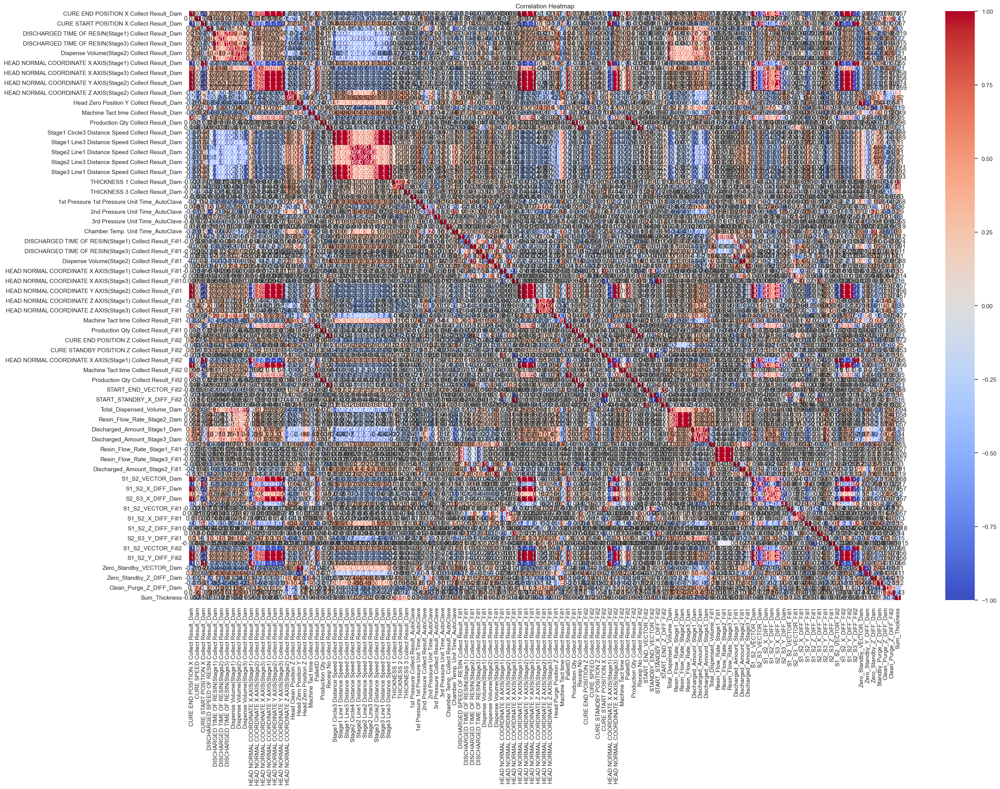

In [147]:
train_num = train_data_v1.select_dtypes(include=[np.number])
plt.figure(figsize=(30, 20))
sns.heatmap(train_num.corr(method='pearson'), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [149]:
# 상관 0.9이상 확인
def find_related_groups(pairs):
    groups = []
    for pair in pairs:
        added = False
        for group in groups:
            if any(var in group for var in pair):
                group.update(pair)
                added = True
                break
        if not added:
            groups.append(set(pair))
    return groups

# 수치형 변수만 선택
train_num = train_data_v1.select_dtypes(include=[np.number])

# 상관 행렬 계산
corr_matrix = train_num.corr().abs()

# 상관계수의 절댓값이 0.9를 넘는 변수 쌍을 선택
high_corr_pairs = []
upper_triangle = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
for column in upper_triangle.columns:
    high_corr = upper_triangle[column][upper_triangle[column] > 0.9].index.tolist()
    if high_corr:
        for pair in high_corr:
            high_corr_pairs.append((column, pair))

# 상관계수 0.9를 넘는 변수 조합 그룹화
high_corr_pairs_groups = find_related_groups(high_corr_pairs)

# 결과 출력
print("상관계수 0.9를 넘는 변수 조합들:")
[list(group) for group in high_corr_pairs_groups]


상관계수 0.9를 넘는 변수 조합들:


[['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill2',
  'S1_S2_Y_DIFF_Fill2',
  'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1',
  'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam',
  'S2_S3_Y_DIFF_Fill2',
  'S1_S2_VECTOR_Dam',
  'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Fill2',
  'S1_S2_X_DIFF_Dam',
  'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam',
  'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam',
  'S2_S3_X_DIFF_Dam',
  'S1_S2_VECTOR_Fill2',
  'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam',
  'S1_S2_X_DIFF_Fill2',
  'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1',
  'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam',
  'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1',
  'CURE END POSITION X Collect Result_Dam',
  'CURE START POSITION X Collect Result_Dam',
  'S2_S3_VECTOR_Dam'],
 ['Stage3 Circle2 Distance Speed Collect Result_Dam',
  'DISCHARGED TIME OF RESIN(Stage1) Colle

In [152]:
del_col = ['S1_S2_Y_DIFF_Fill2',
  'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1',
  'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam',
  'S2_S3_Y_DIFF_Fill2',
  'S1_S2_VECTOR_Dam',
  'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Fill2',
  'S1_S2_X_DIFF_Dam',
  'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam',
  'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam',
  'S2_S3_X_DIFF_Dam',
  'S1_S2_VECTOR_Fill2',
  'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam',
  'S1_S2_X_DIFF_Fill2',
  'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1',
  'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam',
  'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1',
  'CURE END POSITION X Collect Result_Dam',
  'CURE START POSITION X Collect Result_Dam',
  'S2_S3_VECTOR_Dam',
           'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam',
  'Stage1 Circle3 Distance Speed Collect Result_Dam',
  'Stage3 Line1 Distance Speed Collect Result_Dam',
  'Stage1 Line3 Distance Speed Collect Result_Dam',
  'Stage1 Line1 Distance Speed Collect Result_Dam',
  'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam',
  'Stage3 Line3 Distance Speed Collect Result_Dam',
           'Dispense Volume(Stage1) Collect Result_Dam',
  'Dispense Volume(Stage3) Collect Result_Dam',
           'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Dam',
  'Clean_Purge_Z_DIFF_Dam',
           'Stage2 Line3 Distance Speed Collect Result_Dam',
  'Stage2 Line2 Distance Speed Collect Result_Dam',
  'Stage2 Line1 Distance Speed Collect Result_Dam',
  'DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam',
           'Chamber Temp. Unit Time_AutoClave',
  '2nd Pressure Unit Time_AutoClave',
           'Discharged_Amount_Stage2_Fill1',
  'DISCHARGED TIME OF RESIN(Stage2) Collect Result_Fill1',
           'S2_S3_X_DIFF_Fill1',
  'START_STANDBY_X_DIFF_Fill2',
  'CURE START POSITION X Collect Result_Fill2',
  'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Fill1',
  'STANDBY_END_VECTOR_Fill2',
  'S1_S2_X_DIFF_Fill1',
  'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1',
           'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Fill1',
           'PalletID Collect Result_Fill2',
  'PalletID Collect Result_Dam',
           'Production Qty Collect Result_Fill1',
  'Production Qty Collect Result_Fill2',
           'Receip No Collect Result_Dam',
  'Receip No Collect Result_Fill1',
           'START_END_Z_DIFF_Fill2',
           'Resin_Flow_Rate_Stage1_Dam',
  'Resin_Flow_Rate_Stage3_Dam',
           'Discharged_Amount_Stage1_Dam',
           'Dispense Volume(Stage1) Collect Result_Fill1',
           'Resin_Flow_Rate_Stage3_Fill1',
  'Resin_Flow_Rate_Stage2_Fill1',
  'DISCHARGED SPEED OF RESIN Collect Result_Fill1',
           'Dispense Volume(Stage1) Collect Result_Fill1',
           'Discharged_Amount_Stage3_Fill1',
  'Dispense Volume(Stage3) Collect Result_Fill1',
           'S2_S3_Y_DIFF_Dam',
           'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Fill1',
           'S2_S3_Z_DIFF_Fill1',
           'Head Zero Position Y Collect Result_Dam',
  'Zero_Standby_VECTOR_Dam',
           'Head Zero Position Z Collect Result_Dam'
          ]

train_data_v2 = train_data_v1.drop(del_col, axis=1)
test_data_v2 = test_data_v1.drop(del_col, axis=1)

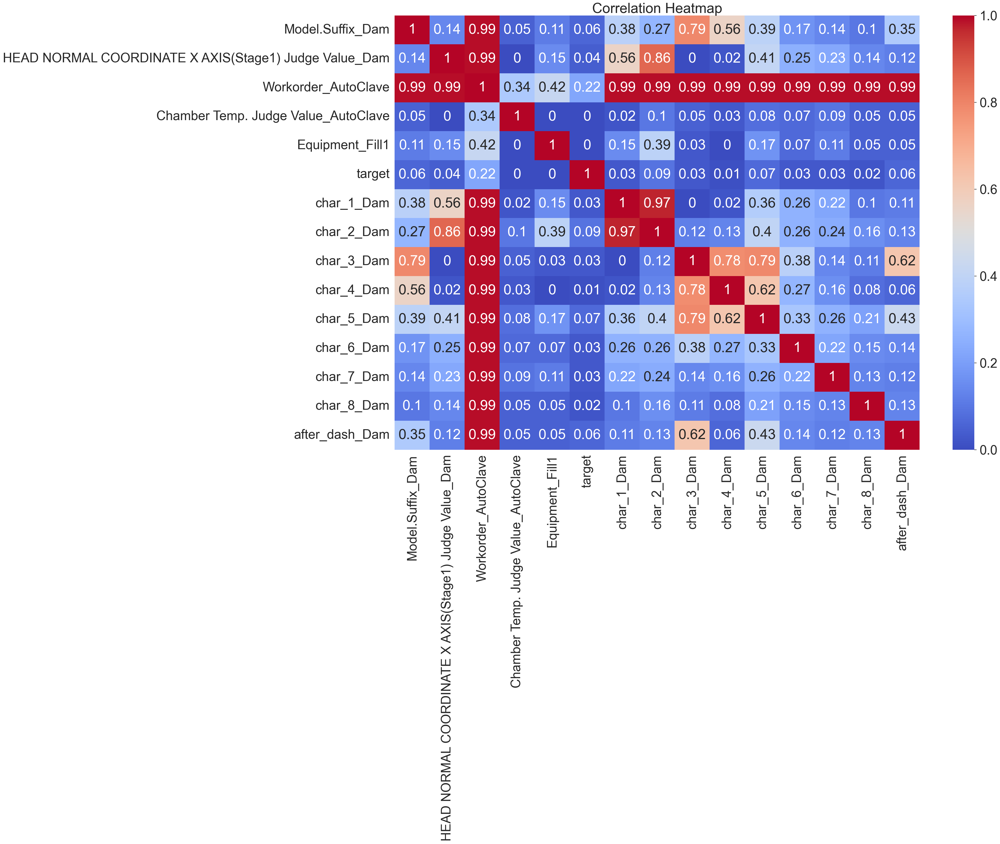

In [157]:
cv_matrix = calculate_cramers_v(train_data_v2)
sns.set(font_scale=3)
plt.figure(figsize=(30, 20))
sns.heatmap(cv_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [160]:
del_col = ['Workorder_AutoClave']

train_data_v2 = train_data_v2.drop(del_col, axis=1)
test_data_v2 = test_data_v2.drop(del_col, axis=1)

In [161]:
train_data_v2

,Model.Suffix_Dam,CURE SPEED Collect Result_Dam,DISCHARGED SPEED OF RESIN Collect Result_Dam,Dispense Volume(Stage2) Collect Result_Dam,HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Dam,HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam,Head Clean Position Z Collect Result_Dam,Machine Tact time Collect Result_Dam,Production Qty Collect Result_Dam,Stage2 Circle4 Distance Speed Collect Result_Dam,...,S1_S2_VECTOR_Fill1,S2_S3_VECTOR_Fill1,S1_S2_Y_DIFF_Fill1,S1_S2_Z_DIFF_Fill1,S2_S3_Y_DIFF_Fill1,Zero_Standby_Y_DIFF_Dam,Zero_Standby_Z_DIFF_Dam,Standby_Purge_Z_DIFF_Dam,Clean_Purge_Z_DIFF_Fill2,Sum_Thickness
0,AJX75334505,100,16,0.58,NaN,464.3,124.00,58.5,127,5300,...,379.700053,301.700414,-0.2,0.0,0.5,-234.0,-265.00,130.85,22.812,0.000
1,AJX75334505,70,10,0.34,NaN,463.8,130.85,65.1,185,9000,...,379.900000,301.500149,0.0,0.0,0.3,-234.0,-265.00,130.85,-6.800,0.000
2,AJX75334501,85,16,0.93,OK,465.4,124.00,76.9,73,5300,...,379.801316,302.000596,-1.0,0.0,0.6,-234.0,-265.02,130.85,22.812,-0.007
3,AJX75334501,70,10,0.58,NaN,465.5,130.85,70.5,268,5000,...,378.900647,301.800149,-0.7,0.0,0.3,-234.0,-265.00,130.85,-6.800,0.000
4,AJX75334501,70,10,0.34,NaN,462.5,133.50,88.3,121,9000,...,379.900118,301.500000,0.3,0.0,0.0,-234.0,-265.00,133.50,-6.800,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40501,AJX75334501,70,10,0.35,NaN,463.8,130.85,56.7,318,9000,...,379.900000,301.500149,0.0,0.0,0.3,-234.0,-265.00,130.85,-6.800,0.000
40502,AJX75334501,100,16,0.59,NaN,466.2,124.00,78.5,197,5300,...,379.401318,302.600149,-1.0,0.0,0.3,-234.0,-265.00,130.85,22.812,-0.158
40503,AJX75334501,100,16,0.57,OK,463.9,124.00,69.5,27,5500,...,380.000118,301.400597,-0.3,0.0,0.6,-234.0,-265.02,130.85,-6.800,0.000
40504,AJX75334501,70,10,0.34,NaN,465.1,130.85,57.7,117,9000,...,378.900053,301.800066,-0.2,0.0,-0.2,-234.0,-265.00,130.85,-6.800,0.000


In [162]:
y = train_data_v2['target']
X = train_data_v2.drop('target', axis=1)

train_X, test_X, train_y, test_y = train_test_split(
    X, y, test_size=0.2, random_state=42)

# 결과 확인
print(f"Train set: {train_X.shape}, {train_y.value_counts()}", '\n')
print(f"Test set: {test_X.shape}, {test_y.value_counts()}")

clf = setup(data = train_X, target = train_y, session_id = 42)
models = compare_models(sort = 'F1', n_select = 3)

Train set: (32404, 64), target
Normal      30512
AbNormal     1892
Name: count, dtype: int64 

Test set: (8102, 64), target
Normal      7644
AbNormal     458
Name: count, dtype: int64


,Description,Value
0,Session id,42
1,Target,target
2,Target type,Binary
3,Target mapping,"AbNormal: 0, Normal: 1"
4,Original data shape,"(32404, 65)"
5,Transformed data shape,"(32404, 134)"
6,Transformed train set shape,"(22682, 134)"
7,Transformed test set shape,"(9722, 134)"
8,Numeric features,51
9,Categorical features,13


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
xgboost,Extreme Gradient Boosting,0.9432,0.0000,0.9432,0.9267,0.9205,0.1022,0.1842,1.7750
catboost,CatBoost Classifier,0.9443,0.0000,0.9443,0.9414,0.9203,0.0922,0.2056,16.0900
rf,Random Forest Classifier,0.9433,0.0000,0.9433,0.9278,0.9202,0.0968,0.1812,4.1090
lightgbm,Light Gradient Boosting Machine,0.9441,0.0000,0.9441,0.9402,0.9200,0.0893,0.1996,1.4230
gbc,Gradient Boosting Classifier,0.9433,0.0000,0.9433,0.9340,0.9186,0.0717,0.1668,8.0160
et,Extra Trees Classifier,0.9354,0.0000,0.9354,0.9087,0.9180,0.1137,0.1389,4.5190
ada,Ada Boost Classifier,0.9427,0.0000,0.9427,0.9308,0.9170,0.0508,0.1346,2.8070
lda,Linear Discriminant Analysis,0.9408,0.0000,0.9408,0.9128,0.9170,0.0612,0.1119,1.2660
knn,K Neighbors Classifier,0.9403,0.0000,0.9403,0.9113,0.9166,0.0598,0.1067,1.4640
svm,SVM - Linear Kernel,0.9404,0.0000,0.9404,0.9019,0.9138,0.0149,0.0361,1.8310


In [163]:
cat = create_model('catboost', fold = 5)
xgb = create_model('xgboost', fold = 5)
rf = create_model('rf', fold = 5)

m1 = tune_model(cat, fold = 5, n_iter = 10, optimize = 'F1')
m2 = tune_model(xgb, fold = 5, n_iter = 10, optimize = 'F1')
m3 = tune_model(rf, fold = 5, n_iter = 10, optimize = 'F1')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9451,0.0000,0.9451,0.9451,0.9219,0.1136,0.2384
1,0.9434,0.0000,0.9434,0.9327,0.9191,0.0793,0.1754
2,0.9422,0.0000,0.9422,0.9217,0.9171,0.0520,0.1220
3,0.9453,0.0000,0.9453,0.9454,0.9224,0.1199,0.2458
4,0.9431,0.0000,0.9431,0.9401,0.9174,0.0548,0.1579
Mean,0.9438,0.0000,0.9438,0.9370,0.9196,0.0839,0.1879
Std,0.0012,0.0000,0.0012,0.0089,0.0022,0.0285,0.0476


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9431,0.0000,0.9431,0.9260,0.9214,0.1176,0.1961
1,0.9423,0.0000,0.9423,0.9220,0.9188,0.0817,0.1543
2,0.9422,0.0000,0.9422,0.9209,0.9193,0.0870,0.1558
3,0.9440,0.0000,0.9440,0.9313,0.9219,0.1206,0.2129
4,0.9420,0.0000,0.9420,0.9208,0.9179,0.0696,0.1395
Mean,0.9427,0.0000,0.9427,0.9242,0.9199,0.0953,0.1717
Std,0.0007,0.0000,0.0007,0.0040,0.0016,0.0203,0.0279


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9438,0.0000,0.9438,0.9299,0.9218,0.1199,0.2084
1,0.9427,0.0000,0.9427,0.9248,0.9194,0.0887,0.1675
2,0.9414,0.0000,0.9414,0.9153,0.9174,0.0615,0.1182
3,0.9442,0.0000,0.9442,0.9315,0.9228,0.1321,0.2232
4,0.9425,0.0000,0.9425,0.9243,0.9182,0.0708,0.1487
Mean,0.9429,0.0000,0.9429,0.9251,0.9199,0.0946,0.1732
Std,0.0010,0.0000,0.0010,0.0057,0.0021,0.0273,0.0385


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9440,0.0000,0.9440,0.9356,0.9206,0.0986,0.2022
1,0.9420,0.0000,0.9420,0.9208,0.9179,0.0696,0.1395
2,0.9427,0.0000,0.9427,0.9291,0.9169,0.0470,0.1289
3,0.9447,0.0000,0.9447,0.9379,0.9220,0.1175,0.2261
4,0.9422,0.0000,0.9422,0.9240,0.9169,0.0524,0.1273
Mean,0.9431,0.0000,0.9431,0.9295,0.9189,0.0770,0.1648
Std,0.0010,0.0000,0.0010,0.0065,0.0021,0.0271,0.0412


Fitting 5 folds for each of 10 candidates, totalling 50 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9438,0.0000,0.9438,0.9423,0.9189,0.0747,0.1885
1,0.9438,0.0000,0.9438,0.9390,0.9193,0.0806,0.1895
2,0.9420,0.0000,0.9420,0.9210,0.9154,0.0266,0.0862
3,0.9440,0.0000,0.9440,0.9374,0.9202,0.0929,0.2001
4,0.9418,0.0000,0.9418,0.9200,0.9155,0.0328,0.0945
Mean,0.9431,0.0000,0.9431,0.9319,0.9179,0.0615,0.1517
Std,0.0010,0.0000,0.0010,0.0095,0.0020,0.0267,0.0504


Fitting 5 folds for each of 10 candidates, totalling 50 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9434,0.0000,0.9434,0.9466,0.9175,0.0554,0.1687
1,0.9425,0.0000,0.9425,0.9362,0.9158,0.0344,0.1202
2,0.9416,0.0000,0.9416,0.9136,0.9151,0.0256,0.0736
3,0.9429,0.0000,0.9429,0.9390,0.9169,0.0480,0.1463
4,0.9425,0.0000,0.9425,0.9362,0.9158,0.0344,0.1202
Mean,0.9426,0.0000,0.9426,0.9343,0.9162,0.0396,0.1258
Std,0.0006,0.0000,0.0006,0.0110,0.0008,0.0107,0.0318


Fitting 5 folds for each of 10 candidates, totalling 50 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [164]:
blended = blend_models(estimator_list = [m1, m2, m3],
                       fold = 10,
                       method = 'soft',
                       optimize='F1'
                       )

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9449,0.0000,0.9449,0.9425,0.9220,0.1186,0.2383
1,0.9458,0.0000,0.9458,0.9487,0.9232,0.1328,0.2666
2,0.9444,0.0000,0.9444,0.9324,0.9227,0.1272,0.2209
3,0.9436,0.0000,0.9436,0.9374,0.9186,0.0677,0.1705
4,0.9431,0.0000,0.9431,0.9305,0.9184,0.0665,0.1559
5,0.9422,0.0000,0.9422,0.9230,0.9163,0.0397,0.1088
6,0.9453,0.0000,0.9453,0.9483,0.9219,0.1084,0.2393
7,0.9458,0.0000,0.9458,0.9405,0.9242,0.1428,0.2555
8,0.9431,0.0000,0.9431,0.9370,0.9180,0.0672,0.1698


In [165]:
from sklearn.metrics import f1_score
pred = predict_model(blended, data = test_X)
thresholds = np.arange(0.50, 1.00, 0.01)

f1_scores = []

for threshold in thresholds:
    # 임계값을 기준으로 라벨 생성
    y_pred = ['Normal' if score >= threshold else 'AbNormal' for score in pred['prediction_score']]
    
    # F1 스코어 계산
    f1 = f1_score(test_y, y_pred, pos_label='AbNormal')
    f1_scores.append((threshold, f1))

# 결과 출력
for threshold, f1 in f1_scores:
    print(f"Threshold: {threshold:.2f}, F1 Score: {f1:.4f}")

Threshold: 0.50, F1 Score: 0.0000
Threshold: 0.51, F1 Score: 0.0043
Threshold: 0.52, F1 Score: 0.0043
Threshold: 0.53, F1 Score: 0.0043
Threshold: 0.54, F1 Score: 0.0087
Threshold: 0.55, F1 Score: 0.0172
Threshold: 0.56, F1 Score: 0.0172
Threshold: 0.57, F1 Score: 0.0256
Threshold: 0.58, F1 Score: 0.0340
Threshold: 0.59, F1 Score: 0.0381
Threshold: 0.60, F1 Score: 0.0379
Threshold: 0.61, F1 Score: 0.0378
Threshold: 0.62, F1 Score: 0.0376
Threshold: 0.63, F1 Score: 0.0413
Threshold: 0.64, F1 Score: 0.0530
Threshold: 0.65, F1 Score: 0.0525
Threshold: 0.66, F1 Score: 0.0520
Threshold: 0.67, F1 Score: 0.0551
Threshold: 0.68, F1 Score: 0.0661
Threshold: 0.69, F1 Score: 0.0731
Threshold: 0.70, F1 Score: 0.0725
Threshold: 0.71, F1 Score: 0.0720
Threshold: 0.72, F1 Score: 0.0850
Threshold: 0.73, F1 Score: 0.0904
Threshold: 0.74, F1 Score: 0.0991
Threshold: 0.75, F1 Score: 0.1071
Threshold: 0.76, F1 Score: 0.1200
Threshold: 0.77, F1 Score: 0.1338
Threshold: 0.78, F1 Score: 0.1453
Threshold: 0.7

In [181]:
# NaN 채워보기

# 데이터프레임에서 각 열별 NaN 개수 계산
nan_counts = train_data_v2.isna().sum()

# 결과 출력
print("Number of NaNs in each column:")
for column_name, count in nan_counts.items():
    if count != 0:
        print(f"{column_name}: {count}")

Number of NaNs in each column:
HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Dam: 29213
Resin_Flow_Rate_Stage1_Fill1: 1


In [177]:
train_data_v3 = train_data_v2.dropna(subset = ['Resin_Flow_Rate_Stage1_Fill1'])
test_data_v3 = test_data_v2.dropna(subset = ['Resin_Flow_Rate_Stage1_Fill1'])

In [182]:
train_data_v3 = train_data_v3.fillna('NG')
test_data_v3 = test_data_v3.fillna('NG')

## v3 : Catboost feature selection(v1 기준)

In [21]:
# NaN 채워보기

# 데이터프레임에서 각 열별 NaN 개수 계산
nan_counts = train_data_v1.isna().sum()

# 결과 출력
print("Number of NaNs in each column:")
for column_name, count in nan_counts.items():
    if count != 0:
        print(f"{column_name}: {count}")

Number of NaNs in each column:
HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Dam: 29213
Resin_Flow_Rate_Stage1_Fill1: 1
Resin_Flow_Rate_Stage2_Fill1: 1
Resin_Flow_Rate_Stage3_Fill1: 1


In [25]:
import os

available_cores = os.cpu_count()
print(f"Available CPU cores: {available_cores}")


Available CPU cores: 4


In [22]:
train_data_v3 = train_data_v1.dropna(subset = ['Resin_Flow_Rate_Stage1_Fill1',
                                              'Resin_Flow_Rate_Stage2_Fill1',
                                              'Resin_Flow_Rate_Stage3_Fill1'])
test_data_v3 = test_data_v1.dropna(subset = ['Resin_Flow_Rate_Stage1_Fill1',
                                            'Resin_Flow_Rate_Stage2_Fill1',
                                            'Resin_Flow_Rate_Stage3_Fill1'])

In [23]:
train_data_v3 = train_data_v3.fillna('NG')
test_data_v3 = test_data_v3.fillna('NG')

In [24]:
y = train_data_v3['target']
X = train_data_v3.drop('target', axis=1)

train_X, test_X, train_y, test_y = train_test_split(
    X, y, test_size=0.2, random_state=42)

# 결과 확인
print(f"Train set: {train_X.shape}, {train_y.value_counts()}", '\n')
print(f"Test set: {test_X.shape}, {test_y.value_counts()}")

Train set: (32404, 133), target
Normal      30518
AbNormal     1886
Name: count, dtype: int64 

Test set: (8101, 133), target
Normal      7638
AbNormal     463
Name: count, dtype: int64


In [28]:
import optuna
from catboost import CatBoostClassifier
from sklearn.model_selection import StratifiedKFold, train_test_split, cross_val_score
from sklearn.metrics import f1_score, make_scorer

# cat_features 자동 선택
cat_features = [col for col in train_X.columns if train_X[col].dtype == 'object' or train_X[col].dtype.name == 'category']

# StratifiedKFold 설정
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# F1 스코어를 위한 스코러 정의
f1_scorer = make_scorer(f1_score, average='macro')

# 학습 데이터와 검증 데이터로 분리
train_X_split, eval_X_split, train_y_split, eval_y_split = train_test_split(train_X, train_y, test_size=0.2, random_state=42, stratify=train_y)

# Objective 함수 정의
def objective(trial):
    # 하이퍼파라미터 공간 정의
    param = {
        'objective': 'Logloss',
        'eval_metric': 'F1',
        'iterations': trial.suggest_int('iterations', 100, 2000),
        'depth': trial.suggest_int('depth', 4, 10),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.005, 0.2),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1, 10),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.5, 1.0),
        'random_state': 42,
        'verbose': 0,
        'use_best_model': True,
        'auto_class_weights': 'Balanced',
        'cat_features': cat_features  # 자동으로 선택된 범주형 변수들
    }

    # CatBoostClassifier 모델 생성
    model = CatBoostClassifier(**param)

    # 모델 학습 및 검증
    model.fit(train_X_split, train_y_split, eval_set=(eval_X_split, eval_y_split), early_stopping_rounds=100)

    # 검증 세트에 대한 예측
    pred_y = model.predict(eval_X_split)
    score = f1_score(eval_y_split, pred_y, average='macro')
    
    return score

# Optuna Study 생성 및 최적화
study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(),
                            pruner=optuna.pruners.HyperbandPruner())
study.optimize(objective, n_trials=100)

# 최적의 파라미터 출력
print("최적의 파라미터:", study.best_params)

# 최적의 파라미터로 모델 생성
best_params = study.best_params
best_model = CatBoostClassifier(**best_params, cat_features=cat_features)

# 최종 모델 학습
best_model.fit(train_X, train_y)


[I 2024-08-21 10:40:35,636] A new study created in memory with name: no-name-ae867082-b3bd-4622-8a21-e39773cb8b49
[I 2024-08-21 10:40:49,581] Trial 0 finished with value: 0.5190247366167686 and parameters: {'iterations': 1000, 'depth': 7, 'learning_rate': 0.023402708944450443, 'l2_leaf_reg': 3.1353431324604655, 'subsample': 0.8280509882390279, 'colsample_bylevel': 0.6095216071322265}. Best is trial 0 with value: 0.5190247366167686.
[I 2024-08-21 10:41:07,580] Trial 1 finished with value: 0.545724991652831 and parameters: {'iterations': 1961, 'depth': 9, 'learning_rate': 0.0721042309752374, 'l2_leaf_reg': 3.4983802176641214, 'subsample': 0.6308878258769064, 'colsample_bylevel': 0.7057473627819304}. Best is trial 1 with value: 0.545724991652831.
[I 2024-08-21 10:41:16,320] Trial 2 finished with value: 0.5098725813593644 and parameters: {'iterations': 1856, 'depth': 5, 'learning_rate': 0.03422259536415196, 'l2_leaf_reg': 4.561738986065496, 'subsample': 0.8102926341384498, 'colsample_bylev

최적의 파라미터: {'iterations': 895, 'depth': 10, 'learning_rate': 0.1302494444815123, 'l2_leaf_reg': 4.813705981758024, 'subsample': 0.7943044989253363, 'colsample_bylevel': 0.6276951827897198}
0:	learn: 0.5476124	total: 45.2ms	remaining: 40.4s
1:	learn: 0.4452873	total: 129ms	remaining: 57.8s
2:	learn: 0.3749534	total: 213ms	remaining: 1m 3s
3:	learn: 0.3268935	total: 300ms	remaining: 1m 6s
4:	learn: 0.2925085	total: 379ms	remaining: 1m 7s
5:	learn: 0.2693735	total: 466ms	remaining: 1m 9s
6:	learn: 0.2533826	total: 545ms	remaining: 1m 9s
7:	learn: 0.2418035	total: 634ms	remaining: 1m 10s
8:	learn: 0.2342362	total: 667ms	remaining: 1m 5s
9:	learn: 0.2285477	total: 713ms	remaining: 1m 3s
10:	learn: 0.2229045	total: 817ms	remaining: 1m 5s
11:	learn: 0.2190471	total: 914ms	remaining: 1m 7s
12:	learn: 0.2161500	total: 1.01s	remaining: 1m 8s
13:	learn: 0.2141507	total: 1.08s	remaining: 1m 7s
14:	learn: 0.2126586	total: 1.13s	remaining: 1m 6s
15:	learn: 0.2117634	total: 1.16s	remaining: 1m 3s
16:	

In [30]:
from catboost import Pool

shap_values = best_model.get_feature_importance(Pool(train_X, label=train_y, cat_features=cat_features), type="ShapValues")

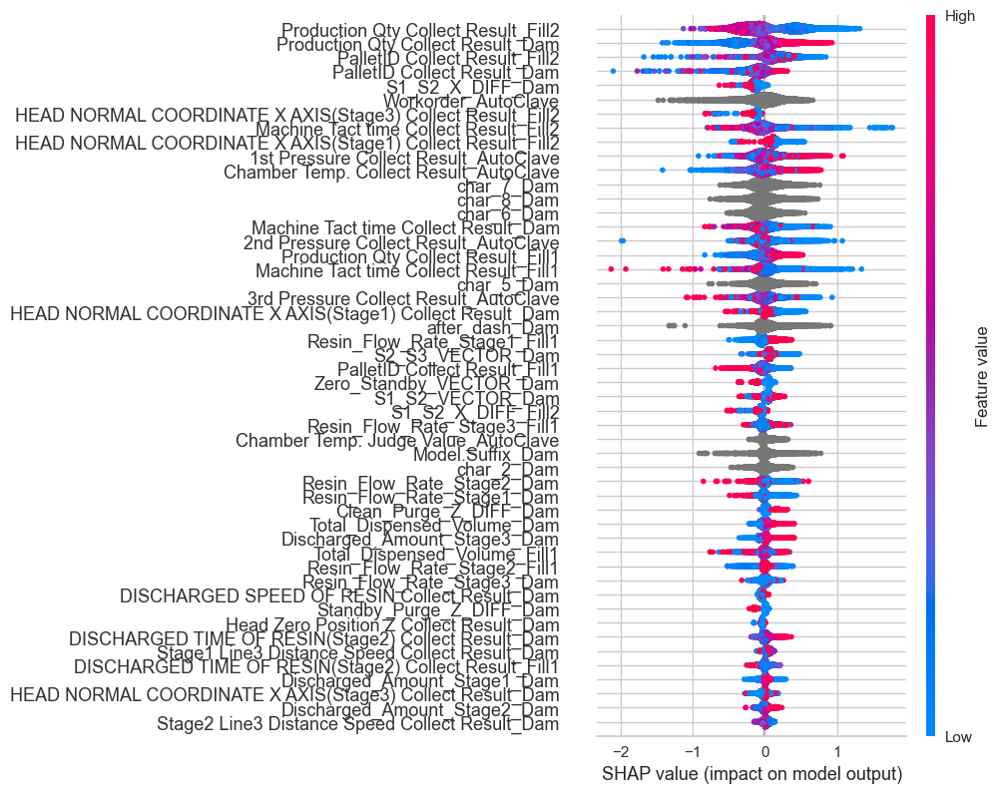

In [42]:
from catboost import Poolimport shap

# SHAP 값의 마지막 열을 제외한 값으로 summary plot 생성
plt.rc('font', size=8)
shap.summary_plot(shap_values_no_bias, train_X, max_display=50, plot_size=(10,8)) 

In [49]:
import pandas as pd
import numpy as np

# SHAP 값을 DataFrame으로 변환 (bias 열 제외)
shap_values_df = pd.DataFrame(shap_values_no_bias, columns=train_X.columns)

# 변수 중요도 계산 (평균 절대값)
shap_importance = shap_values_df.abs().mean().sort_values(ascending=False)

# 상위 중요 변수와 그 SHAP 값 출력
for feature, importance in shap_importance.items():
    print(f'변수: {feature}, 중요도: {importance:.4f}')

변수: Production Qty Collect Result_Fill2, 중요도: 0.2938
변수: Production Qty Collect Result_Dam, 중요도: 0.2231
변수: PalletID Collect Result_Fill2, 중요도: 0.1706
변수: PalletID Collect Result_Dam, 중요도: 0.1393
변수: S1_S2_X_DIFF_Dam, 중요도: 0.1314
변수: Workorder_AutoClave, 중요도: 0.1287
변수: HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Fill2, 중요도: 0.1252
변수: Machine Tact time Collect Result_Fill2, 중요도: 0.1240
변수: HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill2, 중요도: 0.1186
변수: 1st Pressure Collect Result_AutoClave, 중요도: 0.1179
변수: Chamber Temp. Collect Result_AutoClave, 중요도: 0.1138
변수: char_7_Dam, 중요도: 0.1114
변수: char_8_Dam, 중요도: 0.1094
변수: char_6_Dam, 중요도: 0.1069
변수: Machine Tact time Collect Result_Dam, 중요도: 0.1065
변수: 2nd Pressure Collect Result_AutoClave, 중요도: 0.1048
변수: Production Qty Collect Result_Fill1, 중요도: 0.1021
변수: Machine Tact time Collect Result_Fill1, 중요도: 0.0975
변수: char_5_Dam, 중요도: 0.0898
변수: 3rd Pressure Collect Result_AutoClave, 중요도: 0.0853
변수: HEAD NORMAL COORDINATE X 

In [54]:
# 중요도 0.05 이상인 변수 선택
important_features = shap_importance[shap_importance >= 0.05].index

# 새로운 데이터프레임 생성 (중요한 변수만 포함)
train_data_v4 = train_data_v3[important_features]
test_data_v4 = test_data_v3[important_features]

In [55]:
train_data_v4

,Production Qty Collect Result_Fill2,Production Qty Collect Result_Dam,PalletID Collect Result_Fill2,PalletID Collect Result_Dam,S1_S2_X_DIFF_Dam,Workorder_AutoClave,HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Fill2,Machine Tact time Collect Result_Fill2,HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill2,1st Pressure Collect Result_AutoClave,...,after_dash_Dam,Resin_Flow_Rate_Stage1_Fill1,S2_S3_VECTOR_Dam,PalletID Collect Result_Fill1,Zero_Standby_VECTOR_Dam,S1_S2_VECTOR_Dam,S1_S2_X_DIFF_Fill2,Resin_Flow_Rate_Stage3_Fill1,Chamber Temp. Judge Value_AutoClave,Model.Suffix_Dam
0,127,127,7.0,7.0,-86.2,4F1XA938-1,156.0,19.9,835.5,0.312,...,1,0.949606,302.901337,7.0,431.839090,86.204698,-377.5,0.950000,OK,AJX75334505
1,185,185,7.0,7.0,-86.5,3KPM0016-2,156.0,19.6,835.5,0.311,...,2,0.949630,303.000000,7.0,431.839090,86.500000,-377.5,0.949630,OK,AJX75334505
2,73,73,10.0,10.0,303.0,4E1X9167-1,694.0,19.8,305.0,0.315,...,1,0.949630,141.471198,10.0,431.851364,323.071834,194.8,0.950000,OK,AJX75334501
3,268,268,12.0,12.0,303.1,3K1X0057-1,694.0,19.9,305.0,0.299,...,1,0.949630,86.506994,12.0,431.839090,303.101996,194.8,0.949630,OK,AJX75334501
4,121,121,8.0,8.0,-86.5,3HPM0007-1,156.0,19.7,835.5,0.302,...,1,0.949630,303.000413,8.0,431.839090,86.501445,-377.5,0.949630,NG,AJX75334501
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40501,318,318,1.0,1.0,-86.5,3J1XF434-2,156.0,19.2,835.5,0.300,...,2,0.949630,303.000000,1.0,431.839090,86.500000,-377.5,0.949630,OK,AJX75334501
40502,197,197,14.0,14.0,302.7,4E1XC796-1,692.8,20.5,304.8,0.305,...,1,0.949630,141.996127,14.0,431.839090,322.929621,195.0,0.949630,NG,AJX75334501
40503,27,27,1.0,1.0,-86.7,4C1XD438-1,156.0,19.7,835.5,0.309,...,1,0.949612,302.401339,1.0,431.851364,86.701442,-377.5,0.949612,NG,AJX75334501
40504,117,117,13.0,13.0,302.7,3I1XA258-1,694.0,20.1,305.0,0.302,...,1,0.949630,86.202088,13.0,431.839090,302.700595,194.8,0.950000,OK,AJX75334501


In [57]:
train_data_v3['target']

0          Normal
1          Normal
2          Normal
3          Normal
4          Normal
           ...   
40501      Normal
40502      Normal
40503      Normal
40504      Normal
40505    AbNormal
Name: target, Length: 40505, dtype: object

In [95]:
import optuna
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.model_selection import StratifiedKFold, train_test_split, cross_val_score
from sklearn.metrics import f1_score, make_scorer
from sklearn.ensemble import VotingClassifier
from lightgbm import early_stopping


y = train_data_v3['target']
y = y.map({'AbNormal': 1, 'Normal': 0})
X = train_data_v4

X = train_data_v4.apply(lambda x: x.astype('category') if x.dtype == 'object' else x)
test_data_v4 = train_data_v4.apply(lambda x: x.astype('category') if x.dtype == 'object' else x)

train_X, test_X, train_y, test_y = train_test_split(
    X, y, test_size=0.2, random_state=42)

cat_features = [col for col in train_X.columns if train_X[col].dtype == 'object' or train_X[col].dtype.name == 'category']

# F1 스코어를 위한 스코러 정의
f1_scorer = make_scorer(f1_score, average='macro')

# 학습 데이터와 검증 데이터로 분리
train_X_split, eval_X_split, train_y_split, eval_y_split = train_test_split(train_X, train_y, test_size=0.2, random_state=42, stratify=train_y)



# CatBoost 파라미터 최적화와 모델 학습
def catboost_objective(trial):
    param = {
        'objective': 'Logloss',
        'eval_metric': 'F1',
        'iterations': trial.suggest_int('iterations', 100, 2000),
        'depth': trial.suggest_int('depth', 4, 16),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.005, 0.2),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1, 10),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.5, 1.0),
        'random_state': 42,
        'verbose': 0,
        'use_best_model': True,
        'auto_class_weights': 'Balanced',
        'cat_features': cat_features  # 자동으로 선택된 범주형 변수들
    }
    model = CatBoostClassifier(**param)
    model.fit(train_X_split, train_y_split, eval_set=(eval_X_split, eval_y_split), early_stopping_rounds=100)
    pred_y = model.predict(eval_X_split)
    score = f1_score(eval_y_split, pred_y, average='macro')
    return score

catboost_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(),
                                     pruner=optuna.pruners.HyperbandPruner())
catboost_study.optimize(catboost_objective, n_trials=50)
catboost_best_params = catboost_study.best_params
catboost_model = CatBoostClassifier(**catboost_best_params, cat_features=cat_features)
catboost_model.fit(train_X, train_y)


# XGBoost 파라미터 최적화와 모델 학습
def xgb_objective(trial):
    param = {
        'objective': 'binary:logistic',
        'eval_metric': 'logloss',
        'n_estimators': trial.suggest_int('n_estimators', 100, 2000),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'gamma': trial.suggest_float('gamma', 0, 5),
        'lambda': trial.suggest_float('lambda', 1e-8, 1.0, log=True),
        'alpha': trial.suggest_float('alpha', 1e-8, 1.0, log=True),
        'random_state': 42,
        'enable_categorical': True  # 범주형 변수 지원
    }
    model = XGBClassifier(**param)
    model.fit(train_X_split, train_y_split, eval_set=[(eval_X_split, eval_y_split)], early_stopping_rounds=10)
    pred_y = model.predict(eval_X_split)
    score = f1_score(eval_y_split, pred_y, average='macro')
    return score

xgb_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(),
                                pruner=optuna.pruners.HyperbandPruner())
xgb_study.optimize(xgb_objective, n_trials=50)
xgb_best_params = xgb_study.best_params
xgb_model = XGBClassifier(**xgb_best_params, enable_categorical=True)
xgb_model.fit(train_X, train_y)

# LightGBM 파라미터 최적화와 모델 학습
def lgb_objective(trial):
    param = {
        'objective': 'binary',
        'metric': 'binary_logloss',
        'n_estimators': trial.suggest_int('n_estimators', 100, 2000),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'num_leaves': trial.suggest_int('num_leaves', 2, 2000),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.2),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-8, 1.0, log=True),  # lambda_l1을 reg_alpha로 변경
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-8, 1.0, log=True),  # lambda_l2를 reg_lambda로 변경
        'random_state': 42
    }
    model = LGBMClassifier(**param)
    cat_features_idx = [train_X.columns.get_loc(col) for col in cat_features]
    early_stopping_cb = early_stopping(stopping_rounds=100, verbose=False)
    model.fit(train_X_split, train_y_split, eval_set=[(eval_X_split, eval_y_split)], 
              callbacks=[early_stopping_cb], eval_metric='binary_logloss', categorical_feature=cat_features_idx)
    pred_y = model.predict(eval_X_split)
    score = f1_score(eval_y_split, pred_y, average='macro')
    return score

lgb_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(),
                                pruner=optuna.pruners.HyperbandPruner())
lgb_study.optimize(lgb_objective, n_trials=50)
lgb_best_params = lgb_study.best_params
lgb_model = LGBMClassifier(**lgb_best_params)
lgb_model.fit(train_X, train_y)

# 세 모델의 소프트 보팅 앙상블
voting_clf = VotingClassifier(
    estimators=[('catboost', catboost_model), ('xgboost', xgb_model), ('lightgbm', lgb_model)],
    voting='soft'
)
voting_clf.fit(train_X, train_y)

# 예측
pred_y = voting_clf.predict(test_X)
pred_proba = voting_clf.predict_proba(test_X)


[I 2024-08-21 14:36:43,908] A new study created in memory with name: no-name-492ed5f8-eec9-4ab7-a7de-6d5acb01a1ce
[I 2024-08-21 14:36:59,589] Trial 0 finished with value: 0.508948799837832 and parameters: {'iterations': 862, 'depth': 10, 'learning_rate': 0.17115237103703965, 'l2_leaf_reg': 3.497991891939455, 'subsample': 0.6952773609540488, 'colsample_bylevel': 0.9270531260940374}. Best is trial 0 with value: 0.508948799837832.
[I 2024-08-21 14:37:05,727] Trial 1 finished with value: 0.43936767340661204 and parameters: {'iterations': 1335, 'depth': 6, 'learning_rate': 0.10551571819138474, 'l2_leaf_reg': 5.803977262183082, 'subsample': 0.9958453880807786, 'colsample_bylevel': 0.5888328841994392}. Best is trial 0 with value: 0.508948799837832.
[I 2024-08-21 14:40:40,079] Trial 2 finished with value: 0.5053088953556051 and parameters: {'iterations': 1871, 'depth': 16, 'learning_rate': 0.014275497339757096, 'l2_leaf_reg': 8.353585683647356, 'subsample': 0.6460270199810824, 'colsample_bylev

0:	learn: 0.6513008	total: 41.6ms	remaining: 21s
1:	learn: 0.6131748	total: 79.8ms	remaining: 20.1s
2:	learn: 0.5773141	total: 243ms	remaining: 40.8s
3:	learn: 0.5457872	total: 278ms	remaining: 34.9s
4:	learn: 0.5160393	total: 1.21s	remaining: 2m
5:	learn: 0.4885257	total: 2.13s	remaining: 2m 57s
6:	learn: 0.4643174	total: 2.3s	remaining: 2m 44s
7:	learn: 0.4419148	total: 3.21s	remaining: 3m 19s
8:	learn: 0.4219629	total: 4.04s	remaining: 3m 43s
9:	learn: 0.4042740	total: 4.13s	remaining: 3m 24s
10:	learn: 0.3866682	total: 4.91s	remaining: 3m 40s
11:	learn: 0.3722207	total: 4.94s	remaining: 3m 23s
12:	learn: 0.3590118	total: 5.02s	remaining: 3m 10s
13:	learn: 0.3470085	total: 5.06s	remaining: 2m 57s
14:	learn: 0.3360312	total: 5.11s	remaining: 2m 47s
15:	learn: 0.3257703	total: 5.17s	remaining: 2m 38s
16:	learn: 0.3166233	total: 5.23s	remaining: 2m 30s
17:	learn: 0.3083470	total: 5.29s	remaining: 2m 23s
18:	learn: 0.3008123	total: 5.34s	remaining: 2m 16s
19:	learn: 0.2939898	total: 5.4

[I 2024-08-21 15:22:51,670] A new study created in memory with name: no-name-18d684db-a1be-4273-bc4f-1bbf628e3c88


[0]	validation_0-logloss:0.25875
[1]	validation_0-logloss:0.25721
[2]	validation_0-logloss:0.25563
[3]	validation_0-logloss:0.25414
[4]	validation_0-logloss:0.25268
[5]	validation_0-logloss:0.25103
[6]	validation_0-logloss:0.24975
[7]	validation_0-logloss:0.24853
[8]	validation_0-logloss:0.24708
[9]	validation_0-logloss:0.24572
[10]	validation_0-logloss:0.24454
[11]	validation_0-logloss:0.24331
[12]	validation_0-logloss:0.24203
[13]	validation_0-logloss:0.24081
[14]	validation_0-logloss:0.23964
[15]	validation_0-logloss:0.23862
[16]	validation_0-logloss:0.23752
[17]	validation_0-logloss:0.23659
[18]	validation_0-logloss:0.23559
[19]	validation_0-logloss:0.23457
[20]	validation_0-logloss:0.23361
[21]	validation_0-logloss:0.23265
[22]	validation_0-logloss:0.23177
[23]	validation_0-logloss:0.23094
[24]	validation_0-logloss:0.23010
[25]	validation_0-logloss:0.22926
[26]	validation_0-logloss:0.22846
[27]	validation_0-logloss:0.22770
[28]	validation_0-logloss:0.22696
[29]	validation_0-loglos

[I 2024-08-21 15:22:52,411] Trial 0 finished with value: 0.5209722056176834 and parameters: {'n_estimators': 1648, 'max_depth': 10, 'learning_rate': 0.02070004258802803, 'subsample': 0.6270904425180281, 'colsample_bytree': 0.7826691973056384, 'gamma': 4.472887187633937, 'lambda': 2.8774673467736633e-06, 'alpha': 1.2710842129111977e-06}. Best is trial 0 with value: 0.5209722056176834.


[0]	validation_0-logloss:0.25791
[1]	validation_0-logloss:0.25575
[2]	validation_0-logloss:0.25345
[3]	validation_0-logloss:0.25144
[4]	validation_0-logloss:0.24956
[5]	validation_0-logloss:0.24752
[6]	validation_0-logloss:0.24580
[7]	validation_0-logloss:0.24395
[8]	validation_0-logloss:0.24222
[9]	validation_0-logloss:0.24060
[10]	validation_0-logloss:0.23917
[11]	validation_0-logloss:0.23759
[12]	validation_0-logloss:0.23612
[13]	validation_0-logloss:0.23470
[14]	validation_0-logloss:0.23334
[15]	validation_0-logloss:0.23230
[16]	validation_0-logloss:0.23110
[17]	validation_0-logloss:0.23005
[18]	validation_0-logloss:0.22885
[19]	validation_0-logloss:0.22774
[20]	validation_0-logloss:0.22671
[21]	validation_0-logloss:0.22567
[22]	validation_0-logloss:0.22474
[23]	validation_0-logloss:0.22392
[24]	validation_0-logloss:0.22306
[25]	validation_0-logloss:0.22229
[26]	validation_0-logloss:0.22155
[27]	validation_0-logloss:0.22080
[28]	validation_0-logloss:0.22011
[29]	validation_0-loglos

[I 2024-08-21 15:22:52,861] Trial 1 finished with value: 0.515974217849431 and parameters: {'n_estimators': 259, 'max_depth': 4, 'learning_rate': 0.032371713718549334, 'subsample': 0.7433079573250165, 'colsample_bytree': 0.823571693549738, 'gamma': 2.0921909779081176, 'lambda': 0.02110095878144059, 'alpha': 0.2772320842841246}. Best is trial 0 with value: 0.5209722056176834.


[0]	validation_0-logloss:0.25926
[1]	validation_0-logloss:0.25813
[2]	validation_0-logloss:0.25682
[3]	validation_0-logloss:0.25570
[4]	validation_0-logloss:0.25458
[5]	validation_0-logloss:0.25347
[6]	validation_0-logloss:0.25248
[7]	validation_0-logloss:0.25148
[8]	validation_0-logloss:0.25037
[9]	validation_0-logloss:0.24932
[10]	validation_0-logloss:0.24839
[11]	validation_0-logloss:0.24739
[12]	validation_0-logloss:0.24634
[13]	validation_0-logloss:0.24534
[14]	validation_0-logloss:0.24440
[15]	validation_0-logloss:0.24358
[16]	validation_0-logloss:0.24267
[17]	validation_0-logloss:0.24196
[18]	validation_0-logloss:0.24105
[19]	validation_0-logloss:0.24020
[20]	validation_0-logloss:0.23938
[21]	validation_0-logloss:0.23852
[22]	validation_0-logloss:0.23773
[23]	validation_0-logloss:0.23699
[24]	validation_0-logloss:0.23625
[25]	validation_0-logloss:0.23548
[26]	validation_0-logloss:0.23479
[27]	validation_0-logloss:0.23409
[28]	validation_0-logloss:0.23338
[29]	validation_0-loglos

[I 2024-08-21 15:22:53,841] Trial 2 finished with value: 0.523452522328421 and parameters: {'n_estimators': 549, 'max_depth': 8, 'learning_rate': 0.015300991252642228, 'subsample': 0.6451399569784579, 'colsample_bytree': 0.7466740268963138, 'gamma': 4.207337923363763, 'lambda': 0.0011810622314626297, 'alpha': 0.005637710695308269}. Best is trial 2 with value: 0.523452522328421.


[0]	validation_0-logloss:0.25232
[1]	validation_0-logloss:0.24593
[2]	validation_0-logloss:0.23951
[3]	validation_0-logloss:0.23507
[4]	validation_0-logloss:0.23115
[5]	validation_0-logloss:0.22792
[6]	validation_0-logloss:0.22513
[7]	validation_0-logloss:0.22275
[8]	validation_0-logloss:0.21970
[9]	validation_0-logloss:0.21735
[10]	validation_0-logloss:0.21590
[11]	validation_0-logloss:0.21467
[12]	validation_0-logloss:0.21326
[13]	validation_0-logloss:0.21186
[14]	validation_0-logloss:0.21102
[15]	validation_0-logloss:0.21036
[16]	validation_0-logloss:0.20971
[17]	validation_0-logloss:0.20899
[18]	validation_0-logloss:0.20838
[19]	validation_0-logloss:0.20802
[20]	validation_0-logloss:0.20765
[21]	validation_0-logloss:0.20720
[22]	validation_0-logloss:0.20715
[23]	validation_0-logloss:0.20699
[24]	validation_0-logloss:0.20686
[25]	validation_0-logloss:0.20685
[26]	validation_0-logloss:0.20718
[27]	validation_0-logloss:0.20709
[28]	validation_0-logloss:0.20724
[29]	validation_0-loglos

[I 2024-08-21 15:22:54,051] Trial 3 finished with value: 0.5259205134264819 and parameters: {'n_estimators': 423, 'max_depth': 5, 'learning_rate': 0.11123461367681621, 'subsample': 0.7430678963243085, 'colsample_bytree': 0.6581464671668059, 'gamma': 1.927478492366355, 'lambda': 0.01995787680785476, 'alpha': 9.394759338484068e-08}. Best is trial 3 with value: 0.5259205134264819.


[0]	validation_0-logloss:0.25560
[1]	validation_0-logloss:0.25130
[2]	validation_0-logloss:0.24708
[3]	validation_0-logloss:0.24347
[4]	validation_0-logloss:0.24038
[5]	validation_0-logloss:0.23715
[6]	validation_0-logloss:0.23467
[7]	validation_0-logloss:0.23238
[8]	validation_0-logloss:0.22993
[9]	validation_0-logloss:0.22782
[10]	validation_0-logloss:0.22591
[11]	validation_0-logloss:0.22415
[12]	validation_0-logloss:0.22241
[13]	validation_0-logloss:0.22086
[14]	validation_0-logloss:0.21944
[15]	validation_0-logloss:0.21830
[16]	validation_0-logloss:0.21716
[17]	validation_0-logloss:0.21642
[18]	validation_0-logloss:0.21550
[19]	validation_0-logloss:0.21464
[20]	validation_0-logloss:0.21397
[21]	validation_0-logloss:0.21329
[22]	validation_0-logloss:0.21275
[23]	validation_0-logloss:0.21211
[24]	validation_0-logloss:0.21163
[25]	validation_0-logloss:0.21121
[26]	validation_0-logloss:0.21098
[27]	validation_0-logloss:0.21068
[28]	validation_0-logloss:0.21031
[29]	validation_0-loglos

[I 2024-08-21 15:22:54,319] Trial 4 finished with value: 0.5110326387981591 and parameters: {'n_estimators': 1201, 'max_depth': 4, 'learning_rate': 0.06662329469989119, 'subsample': 0.6540257170305217, 'colsample_bytree': 0.7911110212018788, 'gamma': 0.3239030157877498, 'lambda': 4.787849845096706e-07, 'alpha': 0.263008887428291}. Best is trial 3 with value: 0.5259205134264819.


[0]	validation_0-logloss:0.25910
[1]	validation_0-logloss:0.25784
[2]	validation_0-logloss:0.25645
[3]	validation_0-logloss:0.25522
[4]	validation_0-logloss:0.25409
[5]	validation_0-logloss:0.25297
[6]	validation_0-logloss:0.25184
[7]	validation_0-logloss:0.25073
[8]	validation_0-logloss:0.24955
[9]	validation_0-logloss:0.24835
[10]	validation_0-logloss:0.24735
[11]	validation_0-logloss:0.24639
[12]	validation_0-logloss:0.24523
[13]	validation_0-logloss:0.24407
[14]	validation_0-logloss:0.24318
[15]	validation_0-logloss:0.24231
[16]	validation_0-logloss:0.24130
[17]	validation_0-logloss:0.24048
[18]	validation_0-logloss:0.23947
[19]	validation_0-logloss:0.23852
[20]	validation_0-logloss:0.23760
[21]	validation_0-logloss:0.23667
[22]	validation_0-logloss:0.23580
[23]	validation_0-logloss:0.23506
[24]	validation_0-logloss:0.23439
[25]	validation_0-logloss:0.23361
[26]	validation_0-logloss:0.23280
[27]	validation_0-logloss:0.23204
[28]	validation_0-logloss:0.23131
[29]	validation_0-loglos

[I 2024-08-21 15:22:55,364] Trial 5 finished with value: 0.5283762721004429 and parameters: {'n_estimators': 441, 'max_depth': 8, 'learning_rate': 0.016640789574751846, 'subsample': 0.9190183343064443, 'colsample_bytree': 0.6042706271148999, 'gamma': 2.886509418453514, 'lambda': 0.0010058204938170252, 'alpha': 2.8406264263944255e-07}. Best is trial 5 with value: 0.5283762721004429.


[0]	validation_0-logloss:0.25840
[1]	validation_0-logloss:0.25649
[2]	validation_0-logloss:0.25453
[3]	validation_0-logloss:0.25275
[4]	validation_0-logloss:0.25117
[5]	validation_0-logloss:0.24953
[6]	validation_0-logloss:0.24794
[7]	validation_0-logloss:0.24645
[8]	validation_0-logloss:0.24481
[9]	validation_0-logloss:0.24324
[10]	validation_0-logloss:0.24188
[11]	validation_0-logloss:0.24056
[12]	validation_0-logloss:0.23911
[13]	validation_0-logloss:0.23771
[14]	validation_0-logloss:0.23643
[15]	validation_0-logloss:0.23527
[16]	validation_0-logloss:0.23412
[17]	validation_0-logloss:0.23314
[18]	validation_0-logloss:0.23204
[19]	validation_0-logloss:0.23091
[20]	validation_0-logloss:0.22993
[21]	validation_0-logloss:0.22880
[22]	validation_0-logloss:0.22785
[23]	validation_0-logloss:0.22702
[24]	validation_0-logloss:0.22626
[25]	validation_0-logloss:0.22534
[26]	validation_0-logloss:0.22447
[27]	validation_0-logloss:0.22374
[28]	validation_0-logloss:0.22290
[29]	validation_0-loglos

[I 2024-08-21 15:22:56,107] Trial 6 finished with value: 0.5283762721004429 and parameters: {'n_estimators': 653, 'max_depth': 10, 'learning_rate': 0.025679157253994146, 'subsample': 0.7764436324125339, 'colsample_bytree': 0.5386060237138349, 'gamma': 2.937065823197689, 'lambda': 0.000553569375831802, 'alpha': 0.21947098650149172}. Best is trial 5 with value: 0.5283762721004429.


[0]	validation_0-logloss:0.25831
[1]	validation_0-logloss:0.25625
[2]	validation_0-logloss:0.25427
[3]	validation_0-logloss:0.25248
[4]	validation_0-logloss:0.25053
[5]	validation_0-logloss:0.24868
[6]	validation_0-logloss:0.24710
[7]	validation_0-logloss:0.24537
[8]	validation_0-logloss:0.24372
[9]	validation_0-logloss:0.24217
[10]	validation_0-logloss:0.24080
[11]	validation_0-logloss:0.23933
[12]	validation_0-logloss:0.23788
[13]	validation_0-logloss:0.23657
[14]	validation_0-logloss:0.23523
[15]	validation_0-logloss:0.23397
[16]	validation_0-logloss:0.23287
[17]	validation_0-logloss:0.23174
[18]	validation_0-logloss:0.23067
[19]	validation_0-logloss:0.22959
[20]	validation_0-logloss:0.22864
[21]	validation_0-logloss:0.22763
[22]	validation_0-logloss:0.22672
[23]	validation_0-logloss:0.22591
[24]	validation_0-logloss:0.22506
[25]	validation_0-logloss:0.22415
[26]	validation_0-logloss:0.22337
[27]	validation_0-logloss:0.22258
[28]	validation_0-logloss:0.22179
[29]	validation_0-loglos

[I 2024-08-21 15:22:56,862] Trial 7 finished with value: 0.5305118611686037 and parameters: {'n_estimators': 1525, 'max_depth': 9, 'learning_rate': 0.02558836472804895, 'subsample': 0.8076848238208567, 'colsample_bytree': 0.8864130395523092, 'gamma': 2.104989706603458, 'lambda': 0.26578026830979945, 'alpha': 7.411818041814297e-07}. Best is trial 7 with value: 0.5305118611686037.


[0]	validation_0-logloss:0.25000
[1]	validation_0-logloss:0.24165
[2]	validation_0-logloss:0.23508
[3]	validation_0-logloss:0.22973
[4]	validation_0-logloss:0.22530
[5]	validation_0-logloss:0.22162
[6]	validation_0-logloss:0.21887
[7]	validation_0-logloss:0.21660
[8]	validation_0-logloss:0.21461
[9]	validation_0-logloss:0.21278
[10]	validation_0-logloss:0.21174
[11]	validation_0-logloss:0.21052
[12]	validation_0-logloss:0.20989
[13]	validation_0-logloss:0.20908
[14]	validation_0-logloss:0.20876
[15]	validation_0-logloss:0.20845
[16]	validation_0-logloss:0.20824
[17]	validation_0-logloss:0.20822
[18]	validation_0-logloss:0.20784
[19]	validation_0-logloss:0.20790
[20]	validation_0-logloss:0.20791
[21]	validation_0-logloss:0.20784
[22]	validation_0-logloss:0.20786
[23]	validation_0-logloss:0.20777
[24]	validation_0-logloss:0.20818
[25]	validation_0-logloss:0.20816
[26]	validation_0-logloss:0.20839
[27]	validation_0-logloss:0.20882
[28]	validation_0-logloss:0.20894
[29]	validation_0-loglos

[I 2024-08-21 15:22:57,078] Trial 8 finished with value: 0.532932059628812 and parameters: {'n_estimators': 656, 'max_depth': 6, 'learning_rate': 0.13058657344744382, 'subsample': 0.8775014185978887, 'colsample_bytree': 0.9307813543906296, 'gamma': 2.402400780055107, 'lambda': 4.495439571731845e-06, 'alpha': 4.034075713590821e-06}. Best is trial 8 with value: 0.532932059628812.


[0]	validation_0-logloss:0.25348
[1]	validation_0-logloss:0.24779
[2]	validation_0-logloss:0.24195
[3]	validation_0-logloss:0.23776
[4]	validation_0-logloss:0.23392
[5]	validation_0-logloss:0.23081
[6]	validation_0-logloss:0.22810
[7]	validation_0-logloss:0.22568
[8]	validation_0-logloss:0.22293
[9]	validation_0-logloss:0.22055
[10]	validation_0-logloss:0.21871
[11]	validation_0-logloss:0.21708
[12]	validation_0-logloss:0.21537
[13]	validation_0-logloss:0.21372
[14]	validation_0-logloss:0.21277
[15]	validation_0-logloss:0.21182
[16]	validation_0-logloss:0.21073
[17]	validation_0-logloss:0.21006
[18]	validation_0-logloss:0.20917
[19]	validation_0-logloss:0.20857
[20]	validation_0-logloss:0.20812
[21]	validation_0-logloss:0.20776
[22]	validation_0-logloss:0.20748
[23]	validation_0-logloss:0.20714
[24]	validation_0-logloss:0.20702
[25]	validation_0-logloss:0.20691
[26]	validation_0-logloss:0.20684
[27]	validation_0-logloss:0.20684
[28]	validation_0-logloss:0.20690
[29]	validation_0-loglos

[I 2024-08-21 15:22:57,313] Trial 9 finished with value: 0.5262074820590202 and parameters: {'n_estimators': 831, 'max_depth': 6, 'learning_rate': 0.08839363697983134, 'subsample': 0.9959530378847394, 'colsample_bytree': 0.6317880322584963, 'gamma': 3.0051583672738986, 'lambda': 0.0017275025204351493, 'alpha': 2.779823851453393e-06}. Best is trial 8 with value: 0.532932059628812.


[0]	validation_0-logloss:0.24731
[1]	validation_0-logloss:0.23707
[2]	validation_0-logloss:0.22996
[3]	validation_0-logloss:0.22437
[4]	validation_0-logloss:0.22058
[5]	validation_0-logloss:0.21729
[6]	validation_0-logloss:0.21542
[7]	validation_0-logloss:0.21431
[8]	validation_0-logloss:0.21361
[9]	validation_0-logloss:0.21308
[10]	validation_0-logloss:0.21233
[11]	validation_0-logloss:0.21197
[12]	validation_0-logloss:0.21193
[13]	validation_0-logloss:0.21167
[14]	validation_0-logloss:0.21153
[15]	validation_0-logloss:0.21216
[16]	validation_0-logloss:0.21135
[17]	validation_0-logloss:0.21174
[18]	validation_0-logloss:0.21224
[19]	validation_0-logloss:0.21207
[20]	validation_0-logloss:0.21241
[21]	validation_0-logloss:0.21266
[22]	validation_0-logloss:0.21265
[23]	validation_0-logloss:0.21290
[24]	validation_0-logloss:0.21283
[25]	validation_0-logloss:0.21285


[I 2024-08-21 15:22:57,494] Trial 10 finished with value: 0.5080824931404543 and parameters: {'n_estimators': 1151, 'max_depth': 3, 'learning_rate': 0.1952559832132181, 'subsample': 0.5105025402694876, 'colsample_bytree': 0.9986921747381551, 'gamma': 0.6850236063764599, 'lambda': 1.029223286226503e-08, 'alpha': 0.00012673271889532535}. Best is trial 8 with value: 0.532932059628812.


[0]	validation_0-logloss:0.25668
[1]	validation_0-logloss:0.25314
[2]	validation_0-logloss:0.24977
[3]	validation_0-logloss:0.24663
[4]	validation_0-logloss:0.24379
[5]	validation_0-logloss:0.24108
[6]	validation_0-logloss:0.23872
[7]	validation_0-logloss:0.23640
[8]	validation_0-logloss:0.23416
[9]	validation_0-logloss:0.23213
[10]	validation_0-logloss:0.23034
[11]	validation_0-logloss:0.22853
[12]	validation_0-logloss:0.22685
[13]	validation_0-logloss:0.22517
[14]	validation_0-logloss:0.22376
[15]	validation_0-logloss:0.22231
[16]	validation_0-logloss:0.22112
[17]	validation_0-logloss:0.21999
[18]	validation_0-logloss:0.21895
[19]	validation_0-logloss:0.21804
[20]	validation_0-logloss:0.21714
[21]	validation_0-logloss:0.21627
[22]	validation_0-logloss:0.21545
[23]	validation_0-logloss:0.21471
[24]	validation_0-logloss:0.21402
[25]	validation_0-logloss:0.21346
[26]	validation_0-logloss:0.21291
[27]	validation_0-logloss:0.21237
[28]	validation_0-logloss:0.21197
[29]	validation_0-loglos

[I 2024-08-21 15:22:57,987] Trial 11 finished with value: 0.5279322560101894 and parameters: {'n_estimators': 1943, 'max_depth': 7, 'learning_rate': 0.047219707988695764, 'subsample': 0.873457611516766, 'colsample_bytree': 0.9451214004489529, 'gamma': 1.2754973878552502, 'lambda': 0.8727798643068676, 'alpha': 3.206385937347038e-05}. Best is trial 8 with value: 0.532932059628812.


[0]	validation_0-logloss:0.24678
[1]	validation_0-logloss:0.23625
[2]	validation_0-logloss:0.22833
[3]	validation_0-logloss:0.22274
[4]	validation_0-logloss:0.21821
[5]	validation_0-logloss:0.21469
[6]	validation_0-logloss:0.21223
[7]	validation_0-logloss:0.21075
[8]	validation_0-logloss:0.21003
[9]	validation_0-logloss:0.20890
[10]	validation_0-logloss:0.20837
[11]	validation_0-logloss:0.20819
[12]	validation_0-logloss:0.20767
[13]	validation_0-logloss:0.20768
[14]	validation_0-logloss:0.20747
[15]	validation_0-logloss:0.20771
[16]	validation_0-logloss:0.20790
[17]	validation_0-logloss:0.20840
[18]	validation_0-logloss:0.20906
[19]	validation_0-logloss:0.20875
[20]	validation_0-logloss:0.20908
[21]	validation_0-logloss:0.20932
[22]	validation_0-logloss:0.20929
[23]	validation_0-logloss:0.20929


[I 2024-08-21 15:22:58,215] Trial 12 finished with value: 0.5327732357321672 and parameters: {'n_estimators': 1497, 'max_depth': 8, 'learning_rate': 0.17907283004163346, 'subsample': 0.8512539421877865, 'colsample_bytree': 0.894094526264849, 'gamma': 3.600260711912974, 'lambda': 1.3860043640874381e-05, 'alpha': 2.6323400140269545e-08}. Best is trial 8 with value: 0.532932059628812.


[0]	validation_0-logloss:0.24774
[1]	validation_0-logloss:0.23821
[2]	validation_0-logloss:0.23097
[3]	validation_0-logloss:0.22551
[4]	validation_0-logloss:0.22088
[5]	validation_0-logloss:0.21717
[6]	validation_0-logloss:0.21458
[7]	validation_0-logloss:0.21218
[8]	validation_0-logloss:0.21112
[9]	validation_0-logloss:0.21007
[10]	validation_0-logloss:0.20946
[11]	validation_0-logloss:0.20862
[12]	validation_0-logloss:0.20832
[13]	validation_0-logloss:0.20793
[14]	validation_0-logloss:0.20806
[15]	validation_0-logloss:0.20833
[16]	validation_0-logloss:0.20820
[17]	validation_0-logloss:0.20782
[18]	validation_0-logloss:0.20808
[19]	validation_0-logloss:0.20831
[20]	validation_0-logloss:0.20841
[21]	validation_0-logloss:0.20867
[22]	validation_0-logloss:0.20876
[23]	validation_0-logloss:0.20889
[24]	validation_0-logloss:0.20909
[25]	validation_0-logloss:0.20908
[26]	validation_0-logloss:0.20969


[I 2024-08-21 15:22:58,437] Trial 13 finished with value: 0.5305118611686037 and parameters: {'n_estimators': 962, 'max_depth': 6, 'learning_rate': 0.16739374957993772, 'subsample': 0.8893696555766488, 'colsample_bytree': 0.8863951660975272, 'gamma': 3.750397908420603, 'lambda': 1.1917354693268323e-05, 'alpha': 1.198159284015848e-08}. Best is trial 8 with value: 0.532932059628812.


[0]	validation_0-logloss:0.25044
[1]	validation_0-logloss:0.24232
[2]	validation_0-logloss:0.23557
[3]	validation_0-logloss:0.23034
[4]	validation_0-logloss:0.22576
[5]	validation_0-logloss:0.22199
[6]	validation_0-logloss:0.21932
[7]	validation_0-logloss:0.21675
[8]	validation_0-logloss:0.21469
[9]	validation_0-logloss:0.21261
[10]	validation_0-logloss:0.21106
[11]	validation_0-logloss:0.21003
[12]	validation_0-logloss:0.20927
[13]	validation_0-logloss:0.20833
[14]	validation_0-logloss:0.20801
[15]	validation_0-logloss:0.20781
[16]	validation_0-logloss:0.20741
[17]	validation_0-logloss:0.20729
[18]	validation_0-logloss:0.20709
[19]	validation_0-logloss:0.20687
[20]	validation_0-logloss:0.20688
[21]	validation_0-logloss:0.20710
[22]	validation_0-logloss:0.20724
[23]	validation_0-logloss:0.20728
[24]	validation_0-logloss:0.20748
[25]	validation_0-logloss:0.20737
[26]	validation_0-logloss:0.20732
[27]	validation_0-logloss:0.20760
[28]	validation_0-logloss:0.20767
[29]	validation_0-loglos

[I 2024-08-21 15:22:58,674] Trial 14 finished with value: 0.5355054367107468 and parameters: {'n_estimators': 1378, 'max_depth': 7, 'learning_rate': 0.12638630684138358, 'subsample': 0.9796170915945581, 'colsample_bytree': 0.8925105152213221, 'gamma': 3.6075166110799444, 'lambda': 2.0492583325282702e-07, 'alpha': 1.7749120302799122e-08}. Best is trial 14 with value: 0.5355054367107468.


[0]	validation_0-logloss:0.25173
[1]	validation_0-logloss:0.24444
[2]	validation_0-logloss:0.23817
[3]	validation_0-logloss:0.23304
[4]	validation_0-logloss:0.22851
[5]	validation_0-logloss:0.22472
[6]	validation_0-logloss:0.22167
[7]	validation_0-logloss:0.21899
[8]	validation_0-logloss:0.21687
[9]	validation_0-logloss:0.21499
[10]	validation_0-logloss:0.21334
[11]	validation_0-logloss:0.21228
[12]	validation_0-logloss:0.21116
[13]	validation_0-logloss:0.21038
[14]	validation_0-logloss:0.20978
[15]	validation_0-logloss:0.20931
[16]	validation_0-logloss:0.20892
[17]	validation_0-logloss:0.20870
[18]	validation_0-logloss:0.20832
[19]	validation_0-logloss:0.20807
[20]	validation_0-logloss:0.20785
[21]	validation_0-logloss:0.20791
[22]	validation_0-logloss:0.20784
[23]	validation_0-logloss:0.20773
[24]	validation_0-logloss:0.20748
[25]	validation_0-logloss:0.20730
[26]	validation_0-logloss:0.20744
[27]	validation_0-logloss:0.20752
[28]	validation_0-logloss:0.20755
[29]	validation_0-loglos

[I 2024-08-21 15:22:58,930] Trial 15 finished with value: 0.5280797312871448 and parameters: {'n_estimators': 1299, 'max_depth': 7, 'learning_rate': 0.10922018180377777, 'subsample': 0.9803509733342456, 'colsample_bytree': 0.966765109556816, 'gamma': 3.7316454395435117, 'lambda': 7.175523715038739e-08, 'alpha': 2.2977997613202734e-05}. Best is trial 14 with value: 0.5355054367107468.


[0]	validation_0-logloss:0.25607
[1]	validation_0-logloss:0.25208
[2]	validation_0-logloss:0.24831
[3]	validation_0-logloss:0.24524
[4]	validation_0-logloss:0.24239
[5]	validation_0-logloss:0.23946
[6]	validation_0-logloss:0.23713
[7]	validation_0-logloss:0.23457
[8]	validation_0-logloss:0.23221
[9]	validation_0-logloss:0.23016
[10]	validation_0-logloss:0.22846
[11]	validation_0-logloss:0.22659
[12]	validation_0-logloss:0.22494
[13]	validation_0-logloss:0.22332
[14]	validation_0-logloss:0.22198
[15]	validation_0-logloss:0.22070
[16]	validation_0-logloss:0.21953
[17]	validation_0-logloss:0.21855
[18]	validation_0-logloss:0.21744
[19]	validation_0-logloss:0.21644
[20]	validation_0-logloss:0.21552
[21]	validation_0-logloss:0.21469
[22]	validation_0-logloss:0.21407
[23]	validation_0-logloss:0.21339
[24]	validation_0-logloss:0.21280
[25]	validation_0-logloss:0.21215
[26]	validation_0-logloss:0.21164
[27]	validation_0-logloss:0.21113
[28]	validation_0-logloss:0.21063
[29]	validation_0-loglos

[I 2024-08-21 15:22:59,240] Trial 16 finished with value: 0.5186047927524231 and parameters: {'n_estimators': 114, 'max_depth': 5, 'learning_rate': 0.05489294199387473, 'subsample': 0.9194212200192667, 'colsample_bytree': 0.8414619338461082, 'gamma': 4.910364150515537, 'lambda': 5.268758551650261e-07, 'alpha': 0.0005231260308078563}. Best is trial 14 with value: 0.5355054367107468.


[0]	validation_0-logloss:0.25130
[1]	validation_0-logloss:0.24435
[2]	validation_0-logloss:0.23752
[3]	validation_0-logloss:0.23267
[4]	validation_0-logloss:0.22862
[5]	validation_0-logloss:0.22539
[6]	validation_0-logloss:0.22275
[7]	validation_0-logloss:0.22026
[8]	validation_0-logloss:0.21748
[9]	validation_0-logloss:0.21509
[10]	validation_0-logloss:0.21356
[11]	validation_0-logloss:0.21187
[12]	validation_0-logloss:0.21062
[13]	validation_0-logloss:0.20963
[14]	validation_0-logloss:0.20887
[15]	validation_0-logloss:0.20808
[16]	validation_0-logloss:0.20728
[17]	validation_0-logloss:0.20681
[18]	validation_0-logloss:0.20635
[19]	validation_0-logloss:0.20570
[20]	validation_0-logloss:0.20559
[21]	validation_0-logloss:0.20552
[22]	validation_0-logloss:0.20546
[23]	validation_0-logloss:0.20516
[24]	validation_0-logloss:0.20514
[25]	validation_0-logloss:0.20510
[26]	validation_0-logloss:0.20522
[27]	validation_0-logloss:0.20554
[28]	validation_0-logloss:0.20532
[29]	validation_0-loglos

[I 2024-08-21 15:22:59,483] Trial 17 finished with value: 0.5283762721004429 and parameters: {'n_estimators': 826, 'max_depth': 6, 'learning_rate': 0.12002417500244565, 'subsample': 0.9388846825268004, 'colsample_bytree': 0.7130626225770028, 'gamma': 1.3884246934896425, 'lambda': 8.689984298100268e-05, 'alpha': 4.3352636057021275e-06}. Best is trial 14 with value: 0.5355054367107468.


[0]	validation_0-logloss:0.25467
[1]	validation_0-logloss:0.24958
[2]	validation_0-logloss:0.24506
[3]	validation_0-logloss:0.24140
[4]	validation_0-logloss:0.23763
[5]	validation_0-logloss:0.23434
[6]	validation_0-logloss:0.23175
[7]	validation_0-logloss:0.22916
[8]	validation_0-logloss:0.22677
[9]	validation_0-logloss:0.22469
[10]	validation_0-logloss:0.22289
[11]	validation_0-logloss:0.22112
[12]	validation_0-logloss:0.21951
[13]	validation_0-logloss:0.21818
[14]	validation_0-logloss:0.21696
[15]	validation_0-logloss:0.21594
[16]	validation_0-logloss:0.21503
[17]	validation_0-logloss:0.21413
[18]	validation_0-logloss:0.21337
[19]	validation_0-logloss:0.21260
[20]	validation_0-logloss:0.21208
[21]	validation_0-logloss:0.21155
[22]	validation_0-logloss:0.21108
[23]	validation_0-logloss:0.21047
[24]	validation_0-logloss:0.21013
[25]	validation_0-logloss:0.20982
[26]	validation_0-logloss:0.20956
[27]	validation_0-logloss:0.20925
[28]	validation_0-logloss:0.20895
[29]	validation_0-loglos

[I 2024-08-21 15:22:59,756] Trial 18 finished with value: 0.515974217849431 and parameters: {'n_estimators': 1939, 'max_depth': 5, 'learning_rate': 0.07255666589733382, 'subsample': 0.8166801874673341, 'colsample_bytree': 0.925171963007255, 'gamma': 2.5234427925334364, 'lambda': 9.17761317234895e-08, 'alpha': 0.0037082071255624435}. Best is trial 14 with value: 0.5355054367107468.


[0]	validation_0-logloss:0.24949
[1]	validation_0-logloss:0.24006
[2]	validation_0-logloss:0.23269
[3]	validation_0-logloss:0.22735
[4]	validation_0-logloss:0.22276
[5]	validation_0-logloss:0.21929
[6]	validation_0-logloss:0.21655
[7]	validation_0-logloss:0.21426
[8]	validation_0-logloss:0.21284
[9]	validation_0-logloss:0.21163
[10]	validation_0-logloss:0.21030
[11]	validation_0-logloss:0.20907
[12]	validation_0-logloss:0.20839
[13]	validation_0-logloss:0.20794
[14]	validation_0-logloss:0.20786
[15]	validation_0-logloss:0.20783
[16]	validation_0-logloss:0.20753
[17]	validation_0-logloss:0.20758
[18]	validation_0-logloss:0.20776
[19]	validation_0-logloss:0.20784
[20]	validation_0-logloss:0.20800
[21]	validation_0-logloss:0.20818
[22]	validation_0-logloss:0.20828
[23]	validation_0-logloss:0.20854
[24]	validation_0-logloss:0.20848
[25]	validation_0-logloss:0.20857
[26]	validation_0-logloss:0.20898


[I 2024-08-21 15:22:59,967] Trial 19 finished with value: 0.5279322560101894 and parameters: {'n_estimators': 1381, 'max_depth': 7, 'learning_rate': 0.13977651609046435, 'subsample': 0.9575111682085131, 'colsample_bytree': 0.9985394384770669, 'gamma': 3.3936248983133774, 'lambda': 1.7242449009558233e-06, 'alpha': 8.667074821009081e-08}. Best is trial 14 with value: 0.5355054367107468.


[0]	validation_0-logloss:0.25328
[1]	validation_0-logloss:0.24711
[2]	validation_0-logloss:0.24147
[3]	validation_0-logloss:0.23690
[4]	validation_0-logloss:0.23287
[5]	validation_0-logloss:0.22917
[6]	validation_0-logloss:0.22636
[7]	validation_0-logloss:0.22340
[8]	validation_0-logloss:0.22091
[9]	validation_0-logloss:0.21869
[10]	validation_0-logloss:0.21677
[11]	validation_0-logloss:0.21508
[12]	validation_0-logloss:0.21366
[13]	validation_0-logloss:0.21253
[14]	validation_0-logloss:0.21147
[15]	validation_0-logloss:0.21048
[16]	validation_0-logloss:0.20954
[17]	validation_0-logloss:0.20883
[18]	validation_0-logloss:0.20839
[19]	validation_0-logloss:0.20797
[20]	validation_0-logloss:0.20768
[21]	validation_0-logloss:0.20724
[22]	validation_0-logloss:0.20707
[23]	validation_0-logloss:0.20678
[24]	validation_0-logloss:0.20662
[25]	validation_0-logloss:0.20650
[26]	validation_0-logloss:0.20644
[27]	validation_0-logloss:0.20635
[28]	validation_0-logloss:0.20633
[29]	validation_0-loglos

[I 2024-08-21 15:23:00,232] Trial 20 finished with value: 0.5209722056176834 and parameters: {'n_estimators': 1718, 'max_depth': 9, 'learning_rate': 0.08472107409502008, 'subsample': 0.9990915320617788, 'colsample_bytree': 0.8420513268126224, 'gamma': 4.1746511728949, 'lambda': 1.5631918140608294e-08, 'alpha': 9.6426144481374e-06}. Best is trial 14 with value: 0.5355054367107468.


[0]	validation_0-logloss:0.25956
[1]	validation_0-logloss:0.25865
[2]	validation_0-logloss:0.25775
[3]	validation_0-logloss:0.25693
[4]	validation_0-logloss:0.25603
[5]	validation_0-logloss:0.25514
[6]	validation_0-logloss:0.25438
[7]	validation_0-logloss:0.25353
[8]	validation_0-logloss:0.25271
[9]	validation_0-logloss:0.25191
[10]	validation_0-logloss:0.25117
[11]	validation_0-logloss:0.25035
[12]	validation_0-logloss:0.24957
[13]	validation_0-logloss:0.24876
[14]	validation_0-logloss:0.24798
[15]	validation_0-logloss:0.24720
[16]	validation_0-logloss:0.24648
[17]	validation_0-logloss:0.24578
[18]	validation_0-logloss:0.24509
[19]	validation_0-logloss:0.24442
[20]	validation_0-logloss:0.24377
[21]	validation_0-logloss:0.24307
[22]	validation_0-logloss:0.24242
[23]	validation_0-logloss:0.24183
[24]	validation_0-logloss:0.24122
[25]	validation_0-logloss:0.24059
[26]	validation_0-logloss:0.24000
[27]	validation_0-logloss:0.23941
[28]	validation_0-logloss:0.23882
[29]	validation_0-loglos

[I 2024-08-21 15:23:01,723] Trial 21 finished with value: 0.5283762721004429 and parameters: {'n_estimators': 1439, 'max_depth': 8, 'learning_rate': 0.010760733568988844, 'subsample': 0.8560464241046108, 'colsample_bytree': 0.8924311747666714, 'gamma': 3.392325695542276, 'lambda': 4.096710323141377e-05, 'alpha': 1.2933697766043764e-08}. Best is trial 14 with value: 0.5355054367107468.


[0]	validation_0-logloss:0.24810
[1]	validation_0-logloss:0.23897
[2]	validation_0-logloss:0.23173
[3]	validation_0-logloss:0.22605
[4]	validation_0-logloss:0.22119
[5]	validation_0-logloss:0.21741
[6]	validation_0-logloss:0.21446
[7]	validation_0-logloss:0.21248
[8]	validation_0-logloss:0.21129
[9]	validation_0-logloss:0.20977
[10]	validation_0-logloss:0.20935
[11]	validation_0-logloss:0.20829
[12]	validation_0-logloss:0.20835
[13]	validation_0-logloss:0.20859
[14]	validation_0-logloss:0.20866
[15]	validation_0-logloss:0.20888
[16]	validation_0-logloss:0.20897
[17]	validation_0-logloss:0.20911
[18]	validation_0-logloss:0.20955
[19]	validation_0-logloss:0.20973
[20]	validation_0-logloss:0.20972


[I 2024-08-21 15:23:01,952] Trial 22 finished with value: 0.5256355800012479 and parameters: {'n_estimators': 1022, 'max_depth': 8, 'learning_rate': 0.15679336880493439, 'subsample': 0.832348297492048, 'colsample_bytree': 0.9046761829517022, 'gamma': 2.5992700911898816, 'lambda': 9.931650400707083e-06, 'alpha': 1.0340501151356562e-07}. Best is trial 14 with value: 0.5355054367107468.


[0]	validation_0-logloss:0.24515
[1]	validation_0-logloss:0.23456
[2]	validation_0-logloss:0.22693
[3]	validation_0-logloss:0.22107
[4]	validation_0-logloss:0.21671
[5]	validation_0-logloss:0.21385
[6]	validation_0-logloss:0.21180
[7]	validation_0-logloss:0.21034
[8]	validation_0-logloss:0.20976
[9]	validation_0-logloss:0.20875
[10]	validation_0-logloss:0.20820
[11]	validation_0-logloss:0.20807
[12]	validation_0-logloss:0.20875
[13]	validation_0-logloss:0.20862
[14]	validation_0-logloss:0.20916
[15]	validation_0-logloss:0.20897
[16]	validation_0-logloss:0.20963
[17]	validation_0-logloss:0.20987
[18]	validation_0-logloss:0.21044
[19]	validation_0-logloss:0.21120
[20]	validation_0-logloss:0.21141


[I 2024-08-21 15:23:02,161] Trial 23 finished with value: 0.5394241972717078 and parameters: {'n_estimators': 1585, 'max_depth': 9, 'learning_rate': 0.19429624140007096, 'subsample': 0.8964265145329773, 'colsample_bytree': 0.8482029915639211, 'gamma': 3.464992735003759, 'lambda': 2.945213575192429e-07, 'alpha': 3.0570898343409044e-08}. Best is trial 23 with value: 0.5394241972717078.


[0]	validation_0-logloss:0.25032
[1]	validation_0-logloss:0.24221
[2]	validation_0-logloss:0.23534
[3]	validation_0-logloss:0.23029
[4]	validation_0-logloss:0.22562
[5]	validation_0-logloss:0.22150
[6]	validation_0-logloss:0.21874
[7]	validation_0-logloss:0.21604
[8]	validation_0-logloss:0.21374
[9]	validation_0-logloss:0.21166
[10]	validation_0-logloss:0.21047
[11]	validation_0-logloss:0.20932
[12]	validation_0-logloss:0.20833
[13]	validation_0-logloss:0.20783
[14]	validation_0-logloss:0.20769
[15]	validation_0-logloss:0.20721
[16]	validation_0-logloss:0.20699
[17]	validation_0-logloss:0.20664
[18]	validation_0-logloss:0.20651
[19]	validation_0-logloss:0.20656
[20]	validation_0-logloss:0.20635
[21]	validation_0-logloss:0.20662
[22]	validation_0-logloss:0.20672
[23]	validation_0-logloss:0.20673
[24]	validation_0-logloss:0.20671
[25]	validation_0-logloss:0.20715
[26]	validation_0-logloss:0.20719
[27]	validation_0-logloss:0.20749
[28]	validation_0-logloss:0.20755
[29]	validation_0-loglos

[I 2024-08-21 15:23:02,422] Trial 24 finished with value: 0.5397717731950027 and parameters: {'n_estimators': 1724, 'max_depth': 9, 'learning_rate': 0.12004313972649651, 'subsample': 0.9145654251185052, 'colsample_bytree': 0.8547644335632415, 'gamma': 3.1772103728176706, 'lambda': 1.47954359883124e-07, 'alpha': 3.724356053121226e-07}. Best is trial 24 with value: 0.5397717731950027.


[0]	validation_0-logloss:0.25252
[1]	validation_0-logloss:0.24619
[2]	validation_0-logloss:0.24024
[3]	validation_0-logloss:0.23543
[4]	validation_0-logloss:0.23153
[5]	validation_0-logloss:0.22761
[6]	validation_0-logloss:0.22475
[7]	validation_0-logloss:0.22160
[8]	validation_0-logloss:0.21907
[9]	validation_0-logloss:0.21708
[10]	validation_0-logloss:0.21546
[11]	validation_0-logloss:0.21380
[12]	validation_0-logloss:0.21241
[13]	validation_0-logloss:0.21128
[14]	validation_0-logloss:0.21032
[15]	validation_0-logloss:0.20934
[16]	validation_0-logloss:0.20859
[17]	validation_0-logloss:0.20802
[18]	validation_0-logloss:0.20761
[19]	validation_0-logloss:0.20725
[20]	validation_0-logloss:0.20676
[21]	validation_0-logloss:0.20661
[22]	validation_0-logloss:0.20629
[23]	validation_0-logloss:0.20615
[24]	validation_0-logloss:0.20625
[25]	validation_0-logloss:0.20614
[26]	validation_0-logloss:0.20616
[27]	validation_0-logloss:0.20591
[28]	validation_0-logloss:0.20596
[29]	validation_0-loglos

[I 2024-08-21 15:23:02,689] Trial 25 finished with value: 0.5350121968718611 and parameters: {'n_estimators': 1825, 'max_depth': 9, 'learning_rate': 0.09305294542354006, 'subsample': 0.945778895318225, 'colsample_bytree': 0.8081911646176942, 'gamma': 4.050831768557089, 'lambda': 9.133584526934574e-08, 'alpha': 4.800295863083781e-07}. Best is trial 24 with value: 0.5397717731950027.


[0]	validation_0-logloss:0.24500
[1]	validation_0-logloss:0.23467
[2]	validation_0-logloss:0.22638
[3]	validation_0-logloss:0.22034
[4]	validation_0-logloss:0.21616
[5]	validation_0-logloss:0.21337
[6]	validation_0-logloss:0.21141
[7]	validation_0-logloss:0.21039
[8]	validation_0-logloss:0.20969
[9]	validation_0-logloss:0.20902
[10]	validation_0-logloss:0.20856
[11]	validation_0-logloss:0.20858
[12]	validation_0-logloss:0.20855
[13]	validation_0-logloss:0.20924
[14]	validation_0-logloss:0.20942
[15]	validation_0-logloss:0.20959
[16]	validation_0-logloss:0.20953
[17]	validation_0-logloss:0.20951
[18]	validation_0-logloss:0.21000
[19]	validation_0-logloss:0.21015
[20]	validation_0-logloss:0.21103
[21]	validation_0-logloss:0.21123
[22]	validation_0-logloss:0.21158


[I 2024-08-21 15:23:02,899] Trial 26 finished with value: 0.5351760040005714 and parameters: {'n_estimators': 1642, 'max_depth': 10, 'learning_rate': 0.19545354535695977, 'subsample': 0.9023014858613467, 'colsample_bytree': 0.7479241554592705, 'gamma': 3.21463541468666, 'lambda': 4.3480625923351284e-07, 'alpha': 4.1462497961617533e-08}. Best is trial 24 with value: 0.5397717731950027.


[0]	validation_0-logloss:0.25721
[1]	validation_0-logloss:0.25407
[2]	validation_0-logloss:0.25114
[3]	validation_0-logloss:0.24856
[4]	validation_0-logloss:0.24619
[5]	validation_0-logloss:0.24377
[6]	validation_0-logloss:0.24171
[7]	validation_0-logloss:0.23949
[8]	validation_0-logloss:0.23755
[9]	validation_0-logloss:0.23549
[10]	validation_0-logloss:0.23388
[11]	validation_0-logloss:0.23210
[12]	validation_0-logloss:0.23047
[13]	validation_0-logloss:0.22892
[14]	validation_0-logloss:0.22748
[15]	validation_0-logloss:0.22625
[16]	validation_0-logloss:0.22498
[17]	validation_0-logloss:0.22394
[18]	validation_0-logloss:0.22281
[19]	validation_0-logloss:0.22176
[20]	validation_0-logloss:0.22071
[21]	validation_0-logloss:0.21966
[22]	validation_0-logloss:0.21875
[23]	validation_0-logloss:0.21805
[24]	validation_0-logloss:0.21716
[25]	validation_0-logloss:0.21636
[26]	validation_0-logloss:0.21562
[27]	validation_0-logloss:0.21500
[28]	validation_0-logloss:0.21431
[29]	validation_0-loglos

[I 2024-08-21 15:23:03,382] Trial 27 finished with value: 0.525777794260776 and parameters: {'n_estimators': 1794, 'max_depth': 9, 'learning_rate': 0.03868609601032069, 'subsample': 0.7893109278436636, 'colsample_bytree': 0.8551936960255064, 'gamma': 4.486416938762068, 'lambda': 3.723146214097719e-08, 'alpha': 2.1138176333493265e-07}. Best is trial 24 with value: 0.5397717731950027.


[0]	validation_0-logloss:0.24921
[1]	validation_0-logloss:0.24055
[2]	validation_0-logloss:0.23225
[3]	validation_0-logloss:0.22686
[4]	validation_0-logloss:0.22249
[5]	validation_0-logloss:0.21907
[6]	validation_0-logloss:0.21618
[7]	validation_0-logloss:0.21411
[8]	validation_0-logloss:0.21201
[9]	validation_0-logloss:0.21027
[10]	validation_0-logloss:0.20926
[11]	validation_0-logloss:0.20775
[12]	validation_0-logloss:0.20708
[13]	validation_0-logloss:0.20667
[14]	validation_0-logloss:0.20634
[15]	validation_0-logloss:0.20609
[16]	validation_0-logloss:0.20598
[17]	validation_0-logloss:0.20585
[18]	validation_0-logloss:0.20601
[19]	validation_0-logloss:0.20595
[20]	validation_0-logloss:0.20619
[21]	validation_0-logloss:0.20632
[22]	validation_0-logloss:0.20647
[23]	validation_0-logloss:0.20646
[24]	validation_0-logloss:0.20646
[25]	validation_0-logloss:0.20686
[26]	validation_0-logloss:0.20711
[27]	validation_0-logloss:0.20737


[I 2024-08-21 15:23:03,591] Trial 28 finished with value: 0.5280797312871448 and parameters: {'n_estimators': 1291, 'max_depth': 9, 'learning_rate': 0.15057660654325045, 'subsample': 0.9613325219027662, 'colsample_bytree': 0.694306225696931, 'gamma': 4.983705031313114, 'lambda': 2.7381007639122265e-07, 'alpha': 1.1339139632079338e-08}. Best is trial 24 with value: 0.5397717731950027.


[0]	validation_0-logloss:0.25516
[1]	validation_0-logloss:0.25079
[2]	validation_0-logloss:0.24614
[3]	validation_0-logloss:0.24237
[4]	validation_0-logloss:0.23898
[5]	validation_0-logloss:0.23543
[6]	validation_0-logloss:0.23274
[7]	validation_0-logloss:0.23032
[8]	validation_0-logloss:0.22776
[9]	validation_0-logloss:0.22540
[10]	validation_0-logloss:0.22359
[11]	validation_0-logloss:0.22179
[12]	validation_0-logloss:0.21975
[13]	validation_0-logloss:0.21800
[14]	validation_0-logloss:0.21641
[15]	validation_0-logloss:0.21525
[16]	validation_0-logloss:0.21413
[17]	validation_0-logloss:0.21327
[18]	validation_0-logloss:0.21247
[19]	validation_0-logloss:0.21140
[20]	validation_0-logloss:0.21061
[21]	validation_0-logloss:0.20981
[22]	validation_0-logloss:0.20940
[23]	validation_0-logloss:0.20879
[24]	validation_0-logloss:0.20825
[25]	validation_0-logloss:0.20780
[26]	validation_0-logloss:0.20745
[27]	validation_0-logloss:0.20698
[28]	validation_0-logloss:0.20672
[29]	validation_0-loglos

[I 2024-08-21 15:23:03,918] Trial 29 finished with value: 0.525777794260776 and parameters: {'n_estimators': 1640, 'max_depth': 10, 'learning_rate': 0.06429956247008352, 'subsample': 0.7003586388157632, 'colsample_bytree': 0.776124213853203, 'gamma': 3.897353274765174, 'lambda': 1.7200135908424287e-06, 'alpha': 1.2851442798770429e-06}. Best is trial 24 with value: 0.5397717731950027.


[0]	validation_0-logloss:0.25263
[1]	validation_0-logloss:0.24562
[2]	validation_0-logloss:0.23992
[3]	validation_0-logloss:0.23545
[4]	validation_0-logloss:0.23153
[5]	validation_0-logloss:0.22709
[6]	validation_0-logloss:0.22430
[7]	validation_0-logloss:0.22170
[8]	validation_0-logloss:0.21966
[9]	validation_0-logloss:0.21807
[10]	validation_0-logloss:0.21616
[11]	validation_0-logloss:0.21465
[12]	validation_0-logloss:0.21349
[13]	validation_0-logloss:0.21201
[14]	validation_0-logloss:0.21079
[15]	validation_0-logloss:0.21024
[16]	validation_0-logloss:0.20933
[17]	validation_0-logloss:0.20876
[18]	validation_0-logloss:0.20837
[19]	validation_0-logloss:0.20761
[20]	validation_0-logloss:0.20740
[21]	validation_0-logloss:0.20710
[22]	validation_0-logloss:0.20701
[23]	validation_0-logloss:0.20669
[24]	validation_0-logloss:0.20676
[25]	validation_0-logloss:0.20693
[26]	validation_0-logloss:0.20705
[27]	validation_0-logloss:0.20712
[28]	validation_0-logloss:0.20697
[29]	validation_0-loglos

[I 2024-08-21 15:23:04,166] Trial 30 finished with value: 0.5208413032726863 and parameters: {'n_estimators': 1582, 'max_depth': 10, 'learning_rate': 0.09902684560155538, 'subsample': 0.5014747033606343, 'colsample_bytree': 0.8598104348641625, 'gamma': 4.448652016065278, 'lambda': 1.3060446322475646e-06, 'alpha': 6.472914921968406e-08}. Best is trial 24 with value: 0.5397717731950027.


[0]	validation_0-logloss:0.24451
[1]	validation_0-logloss:0.23412
[2]	validation_0-logloss:0.22507
[3]	validation_0-logloss:0.21957
[4]	validation_0-logloss:0.21490
[5]	validation_0-logloss:0.21290
[6]	validation_0-logloss:0.21089
[7]	validation_0-logloss:0.20905
[8]	validation_0-logloss:0.20767
[9]	validation_0-logloss:0.20666
[10]	validation_0-logloss:0.20607
[11]	validation_0-logloss:0.20577
[12]	validation_0-logloss:0.20567
[13]	validation_0-logloss:0.20620
[14]	validation_0-logloss:0.20658
[15]	validation_0-logloss:0.20652
[16]	validation_0-logloss:0.20670
[17]	validation_0-logloss:0.20679
[18]	validation_0-logloss:0.20735
[19]	validation_0-logloss:0.20761
[20]	validation_0-logloss:0.20820
[21]	validation_0-logloss:0.20887


[I 2024-08-21 15:23:04,374] Trial 31 finished with value: 0.5417760236937683 and parameters: {'n_estimators': 1703, 'max_depth': 10, 'learning_rate': 0.19600196095889258, 'subsample': 0.8993175945499778, 'colsample_bytree': 0.7641326568361864, 'gamma': 3.2185612853680046, 'lambda': 2.725936265819322e-07, 'alpha': 4.1423011983655914e-08}. Best is trial 31 with value: 0.5417760236937683.


[0]	validation_0-logloss:0.24888
[1]	validation_0-logloss:0.24084
[2]	validation_0-logloss:0.23329
[3]	validation_0-logloss:0.22787
[4]	validation_0-logloss:0.22340
[5]	validation_0-logloss:0.21929
[6]	validation_0-logloss:0.21650
[7]	validation_0-logloss:0.21443
[8]	validation_0-logloss:0.21184
[9]	validation_0-logloss:0.21003
[10]	validation_0-logloss:0.20846
[11]	validation_0-logloss:0.20736
[12]	validation_0-logloss:0.20728
[13]	validation_0-logloss:0.20695
[14]	validation_0-logloss:0.20682
[15]	validation_0-logloss:0.20627
[16]	validation_0-logloss:0.20603
[17]	validation_0-logloss:0.20595
[18]	validation_0-logloss:0.20585
[19]	validation_0-logloss:0.20593
[20]	validation_0-logloss:0.20624
[21]	validation_0-logloss:0.20638
[22]	validation_0-logloss:0.20644
[23]	validation_0-logloss:0.20649
[24]	validation_0-logloss:0.20696
[25]	validation_0-logloss:0.20709
[26]	validation_0-logloss:0.20751
[27]	validation_0-logloss:0.20785


[I 2024-08-21 15:23:04,616] Trial 32 finished with value: 0.5402980315046974 and parameters: {'n_estimators': 1744, 'max_depth': 10, 'learning_rate': 0.1378870530915544, 'subsample': 0.9173324157174978, 'colsample_bytree': 0.7802745025886502, 'gamma': 3.2716742031826, 'lambda': 1.71608176492319e-07, 'alpha': 1.9527272224570557e-07}. Best is trial 31 with value: 0.5417760236937683.


[0]	validation_0-logloss:0.24791
[1]	validation_0-logloss:0.23900
[2]	validation_0-logloss:0.23104
[3]	validation_0-logloss:0.22570
[4]	validation_0-logloss:0.22142
[5]	validation_0-logloss:0.21715
[6]	validation_0-logloss:0.21446
[7]	validation_0-logloss:0.21243
[8]	validation_0-logloss:0.21032
[9]	validation_0-logloss:0.20882
[10]	validation_0-logloss:0.20746
[11]	validation_0-logloss:0.20660
[12]	validation_0-logloss:0.20634
[13]	validation_0-logloss:0.20624
[14]	validation_0-logloss:0.20593
[15]	validation_0-logloss:0.20575
[16]	validation_0-logloss:0.20573
[17]	validation_0-logloss:0.20563
[18]	validation_0-logloss:0.20537
[19]	validation_0-logloss:0.20552
[20]	validation_0-logloss:0.20569
[21]	validation_0-logloss:0.20594
[22]	validation_0-logloss:0.20614
[23]	validation_0-logloss:0.20618
[24]	validation_0-logloss:0.20619
[25]	validation_0-logloss:0.20647
[26]	validation_0-logloss:0.20682
[27]	validation_0-logloss:0.20701


[I 2024-08-21 15:23:04,866] Trial 33 finished with value: 0.5355054367107468 and parameters: {'n_estimators': 1818, 'max_depth': 10, 'learning_rate': 0.15128130361887623, 'subsample': 0.9082004164265646, 'colsample_bytree': 0.7804741533305138, 'gamma': 3.136284754861104, 'lambda': 3.058300174860118e-08, 'alpha': 3.024957996296537e-07}. Best is trial 31 with value: 0.5417760236937683.


[0]	validation_0-logloss:0.24562
[1]	validation_0-logloss:0.23542
[2]	validation_0-logloss:0.22688
[3]	validation_0-logloss:0.22145
[4]	validation_0-logloss:0.21696
[5]	validation_0-logloss:0.21401
[6]	validation_0-logloss:0.21215
[7]	validation_0-logloss:0.21044
[8]	validation_0-logloss:0.20944
[9]	validation_0-logloss:0.20846
[10]	validation_0-logloss:0.20818
[11]	validation_0-logloss:0.20842
[12]	validation_0-logloss:0.20822
[13]	validation_0-logloss:0.20813
[14]	validation_0-logloss:0.20859
[15]	validation_0-logloss:0.20899
[16]	validation_0-logloss:0.20957
[17]	validation_0-logloss:0.21036
[18]	validation_0-logloss:0.21090
[19]	validation_0-logloss:0.21095
[20]	validation_0-logloss:0.21134
[21]	validation_0-logloss:0.21171
[22]	validation_0-logloss:0.21189


[I 2024-08-21 15:23:05,079] Trial 34 finished with value: 0.5326149902485084 and parameters: {'n_estimators': 1742, 'max_depth': 9, 'learning_rate': 0.19794517894467714, 'subsample': 0.8423095498192581, 'colsample_bytree': 0.7293251267364395, 'gamma': 2.694346051717129, 'lambda': 1.717652585962705e-07, 'alpha': 8.998933500898242e-07}. Best is trial 31 with value: 0.5417760236937683.


[0]	validation_0-logloss:0.24756
[1]	validation_0-logloss:0.23868
[2]	validation_0-logloss:0.23112
[3]	validation_0-logloss:0.22571
[4]	validation_0-logloss:0.22124
[5]	validation_0-logloss:0.21767
[6]	validation_0-logloss:0.21519
[7]	validation_0-logloss:0.21309
[8]	validation_0-logloss:0.21117
[9]	validation_0-logloss:0.21039
[10]	validation_0-logloss:0.20990
[11]	validation_0-logloss:0.20949
[12]	validation_0-logloss:0.20919
[13]	validation_0-logloss:0.20892
[14]	validation_0-logloss:0.20896
[15]	validation_0-logloss:0.20895
[16]	validation_0-logloss:0.20893
[17]	validation_0-logloss:0.20888
[18]	validation_0-logloss:0.20881
[19]	validation_0-logloss:0.20849
[20]	validation_0-logloss:0.20896
[21]	validation_0-logloss:0.20915
[22]	validation_0-logloss:0.20980
[23]	validation_0-logloss:0.20969
[24]	validation_0-logloss:0.21002
[25]	validation_0-logloss:0.21033
[26]	validation_0-logloss:0.21083
[27]	validation_0-logloss:0.21139
[28]	validation_0-logloss:0.21151


[I 2024-08-21 15:23:05,344] Trial 35 finished with value: 0.5321436810380138 and parameters: {'n_estimators': 1946, 'max_depth': 10, 'learning_rate': 0.16496366812523391, 'subsample': 0.7560213926706512, 'colsample_bytree': 0.8014521141549349, 'gamma': 3.349506472759333, 'lambda': 8.04157569793909e-07, 'alpha': 1.3750035100772257e-07}. Best is trial 31 with value: 0.5417760236937683.


[0]	validation_0-logloss:0.25227
[1]	validation_0-logloss:0.24588
[2]	validation_0-logloss:0.23973
[3]	validation_0-logloss:0.23477
[4]	validation_0-logloss:0.23050
[5]	validation_0-logloss:0.22664
[6]	validation_0-logloss:0.22426
[7]	validation_0-logloss:0.22159
[8]	validation_0-logloss:0.21920
[9]	validation_0-logloss:0.21716
[10]	validation_0-logloss:0.21526
[11]	validation_0-logloss:0.21385
[12]	validation_0-logloss:0.21297
[13]	validation_0-logloss:0.21139
[14]	validation_0-logloss:0.21061
[15]	validation_0-logloss:0.21000
[16]	validation_0-logloss:0.20929
[17]	validation_0-logloss:0.20887
[18]	validation_0-logloss:0.20838
[19]	validation_0-logloss:0.20811
[20]	validation_0-logloss:0.20770
[21]	validation_0-logloss:0.20751
[22]	validation_0-logloss:0.20758
[23]	validation_0-logloss:0.20784
[24]	validation_0-logloss:0.20806
[25]	validation_0-logloss:0.20850
[26]	validation_0-logloss:0.20866
[27]	validation_0-logloss:0.20869
[28]	validation_0-logloss:0.20841
[29]	validation_0-loglos

[I 2024-08-21 15:23:05,644] Trial 36 finished with value: 0.5324573188326955 and parameters: {'n_estimators': 1987, 'max_depth': 9, 'learning_rate': 0.10932164973791218, 'subsample': 0.562372852890815, 'colsample_bytree': 0.6806199028935791, 'gamma': 2.220563111002029, 'lambda': 5.978049728931902e-06, 'alpha': 2.045232517688241e-06}. Best is trial 31 with value: 0.5417760236937683.


[0]	validation_0-logloss:0.25373
[1]	validation_0-logloss:0.24815
[2]	validation_0-logloss:0.24257
[3]	validation_0-logloss:0.23829
[4]	validation_0-logloss:0.23446
[5]	validation_0-logloss:0.23123
[6]	validation_0-logloss:0.22839
[7]	validation_0-logloss:0.22603
[8]	validation_0-logloss:0.22346
[9]	validation_0-logloss:0.22102
[10]	validation_0-logloss:0.21899
[11]	validation_0-logloss:0.21683
[12]	validation_0-logloss:0.21525
[13]	validation_0-logloss:0.21370
[14]	validation_0-logloss:0.21237
[15]	validation_0-logloss:0.21101
[16]	validation_0-logloss:0.21011
[17]	validation_0-logloss:0.20926
[18]	validation_0-logloss:0.20818
[19]	validation_0-logloss:0.20761
[20]	validation_0-logloss:0.20724
[21]	validation_0-logloss:0.20698
[22]	validation_0-logloss:0.20663
[23]	validation_0-logloss:0.20642
[24]	validation_0-logloss:0.20622
[25]	validation_0-logloss:0.20618
[26]	validation_0-logloss:0.20602
[27]	validation_0-logloss:0.20600
[28]	validation_0-logloss:0.20597
[29]	validation_0-loglos

[I 2024-08-21 15:23:05,989] Trial 37 finished with value: 0.5380788137926817 and parameters: {'n_estimators': 1701, 'max_depth': 10, 'learning_rate': 0.07978047690967806, 'subsample': 0.9322999126954973, 'colsample_bytree': 0.761339931344375, 'gamma': 2.941940453316355, 'lambda': 4.1671222745359157e-08, 'alpha': 4.5917764134024566e-08}. Best is trial 31 with value: 0.5417760236937683.


[0]	validation_0-logloss:0.24944
[1]	validation_0-logloss:0.24143
[2]	validation_0-logloss:0.23388
[3]	validation_0-logloss:0.22840
[4]	validation_0-logloss:0.22390
[5]	validation_0-logloss:0.21983
[6]	validation_0-logloss:0.21725
[7]	validation_0-logloss:0.21483
[8]	validation_0-logloss:0.21287
[9]	validation_0-logloss:0.21192
[10]	validation_0-logloss:0.21034
[11]	validation_0-logloss:0.20974
[12]	validation_0-logloss:0.20919
[13]	validation_0-logloss:0.20878
[14]	validation_0-logloss:0.20825
[15]	validation_0-logloss:0.20813
[16]	validation_0-logloss:0.20764
[17]	validation_0-logloss:0.20757
[18]	validation_0-logloss:0.20763
[19]	validation_0-logloss:0.20766
[20]	validation_0-logloss:0.20771
[21]	validation_0-logloss:0.20791
[22]	validation_0-logloss:0.20794
[23]	validation_0-logloss:0.20797
[24]	validation_0-logloss:0.20845
[25]	validation_0-logloss:0.20872
[26]	validation_0-logloss:0.20902
[27]	validation_0-logloss:0.20942


[I 2024-08-21 15:23:06,229] Trial 38 finished with value: 0.5327732357321672 and parameters: {'n_estimators': 1575, 'max_depth': 8, 'learning_rate': 0.14190669267002737, 'subsample': 0.6823541654299095, 'colsample_bytree': 0.8189753959772951, 'gamma': 1.7618674656009126, 'lambda': 3.5254188507047894e-05, 'alpha': 4.0865286792494756e-07}. Best is trial 31 with value: 0.5417760236937683.


[0]	validation_0-logloss:0.25074
[1]	validation_0-logloss:0.24314
[2]	validation_0-logloss:0.23590
[3]	validation_0-logloss:0.23088
[4]	validation_0-logloss:0.22606
[5]	validation_0-logloss:0.22264
[6]	validation_0-logloss:0.21967
[7]	validation_0-logloss:0.21722
[8]	validation_0-logloss:0.21463
[9]	validation_0-logloss:0.21249
[10]	validation_0-logloss:0.21145
[11]	validation_0-logloss:0.21013
[12]	validation_0-logloss:0.20912
[13]	validation_0-logloss:0.20842
[14]	validation_0-logloss:0.20800
[15]	validation_0-logloss:0.20758
[16]	validation_0-logloss:0.20723
[17]	validation_0-logloss:0.20691
[18]	validation_0-logloss:0.20693
[19]	validation_0-logloss:0.20676
[20]	validation_0-logloss:0.20670
[21]	validation_0-logloss:0.20655
[22]	validation_0-logloss:0.20651
[23]	validation_0-logloss:0.20670
[24]	validation_0-logloss:0.20668
[25]	validation_0-logloss:0.20679
[26]	validation_0-logloss:0.20737
[27]	validation_0-logloss:0.20747
[28]	validation_0-logloss:0.20799
[29]	validation_0-loglos

[I 2024-08-21 15:23:06,495] Trial 39 finished with value: 0.5419548335504346 and parameters: {'n_estimators': 1856, 'max_depth': 10, 'learning_rate': 0.11969258388133878, 'subsample': 0.8749707099320557, 'colsample_bytree': 0.7350852074551814, 'gamma': 2.7688712922874803, 'lambda': 3.0881638886074478e-06, 'alpha': 1.8094752405591858e-07}. Best is trial 39 with value: 0.5419548335504346.


[0]	validation_0-logloss:0.25533
[1]	validation_0-logloss:0.25118
[2]	validation_0-logloss:0.24687
[3]	validation_0-logloss:0.24342
[4]	validation_0-logloss:0.24017
[5]	validation_0-logloss:0.23738
[6]	validation_0-logloss:0.23474
[7]	validation_0-logloss:0.23218
[8]	validation_0-logloss:0.22959
[9]	validation_0-logloss:0.22718
[10]	validation_0-logloss:0.22535
[11]	validation_0-logloss:0.22367
[12]	validation_0-logloss:0.22187
[13]	validation_0-logloss:0.22000
[14]	validation_0-logloss:0.21873
[15]	validation_0-logloss:0.21738
[16]	validation_0-logloss:0.21597
[17]	validation_0-logloss:0.21515
[18]	validation_0-logloss:0.21404
[19]	validation_0-logloss:0.21295
[20]	validation_0-logloss:0.21208
[21]	validation_0-logloss:0.21142
[22]	validation_0-logloss:0.21069
[23]	validation_0-logloss:0.21017
[24]	validation_0-logloss:0.20960
[25]	validation_0-logloss:0.20900
[26]	validation_0-logloss:0.20842
[27]	validation_0-logloss:0.20794
[28]	validation_0-logloss:0.20755
[29]	validation_0-loglos

[I 2024-08-21 15:23:06,938] Trial 40 finished with value: 0.5277853054649421 and parameters: {'n_estimators': 1876, 'max_depth': 10, 'learning_rate': 0.05924373026819636, 'subsample': 0.87000280887532, 'colsample_bytree': 0.5777027072924996, 'gamma': 1.8128629846368238, 'lambda': 2.3435355551428856e-06, 'alpha': 0.045027834604966774}. Best is trial 39 with value: 0.5419548335504346.


[0]	validation_0-logloss:0.25036
[1]	validation_0-logloss:0.24318
[2]	validation_0-logloss:0.23591
[3]	validation_0-logloss:0.23056
[4]	validation_0-logloss:0.22591
[5]	validation_0-logloss:0.22226
[6]	validation_0-logloss:0.21963
[7]	validation_0-logloss:0.21721
[8]	validation_0-logloss:0.21479
[9]	validation_0-logloss:0.21275
[10]	validation_0-logloss:0.21133
[11]	validation_0-logloss:0.20970
[12]	validation_0-logloss:0.20902
[13]	validation_0-logloss:0.20797
[14]	validation_0-logloss:0.20765
[15]	validation_0-logloss:0.20712
[16]	validation_0-logloss:0.20677
[17]	validation_0-logloss:0.20653
[18]	validation_0-logloss:0.20630
[19]	validation_0-logloss:0.20654
[20]	validation_0-logloss:0.20642
[21]	validation_0-logloss:0.20631
[22]	validation_0-logloss:0.20628
[23]	validation_0-logloss:0.20636
[24]	validation_0-logloss:0.20620
[25]	validation_0-logloss:0.20627
[26]	validation_0-logloss:0.20644
[27]	validation_0-logloss:0.20659
[28]	validation_0-logloss:0.20681
[29]	validation_0-loglos

[I 2024-08-21 15:23:07,205] Trial 41 finished with value: 0.5375670749110267 and parameters: {'n_estimators': 1862, 'max_depth': 9, 'learning_rate': 0.12159357579433168, 'subsample': 0.8963783992899114, 'colsample_bytree': 0.7617267987757624, 'gamma': 2.77667905839834, 'lambda': 1.6965555852478615e-07, 'alpha': 1.7216459343289015e-07}. Best is trial 39 with value: 0.5419548335504346.


[0]	validation_0-logloss:0.24769
[1]	validation_0-logloss:0.23802
[2]	validation_0-logloss:0.22950
[3]	validation_0-logloss:0.22354
[4]	validation_0-logloss:0.21969
[5]	validation_0-logloss:0.21631
[6]	validation_0-logloss:0.21414
[7]	validation_0-logloss:0.21230
[8]	validation_0-logloss:0.21032
[9]	validation_0-logloss:0.20864
[10]	validation_0-logloss:0.20802
[11]	validation_0-logloss:0.20730
[12]	validation_0-logloss:0.20683
[13]	validation_0-logloss:0.20693
[14]	validation_0-logloss:0.20736
[15]	validation_0-logloss:0.20719
[16]	validation_0-logloss:0.20747
[17]	validation_0-logloss:0.20717
[18]	validation_0-logloss:0.20792
[19]	validation_0-logloss:0.20809
[20]	validation_0-logloss:0.20846
[21]	validation_0-logloss:0.20896


[I 2024-08-21 15:23:07,444] Trial 42 finished with value: 0.5346863784236767 and parameters: {'n_estimators': 1669, 'max_depth': 10, 'learning_rate': 0.17244032939552267, 'subsample': 0.9207234559331476, 'colsample_bytree': 0.7261761070925706, 'gamma': 2.280190097761168, 'lambda': 7.020594322706115e-07, 'alpha': 3.979604743486517e-08}. Best is trial 39 with value: 0.5419548335504346.


[0]	validation_0-logloss:0.25185
[1]	validation_0-logloss:0.24540
[2]	validation_0-logloss:0.23872
[3]	validation_0-logloss:0.23367
[4]	validation_0-logloss:0.22977
[5]	validation_0-logloss:0.22651
[6]	validation_0-logloss:0.22375
[7]	validation_0-logloss:0.22144
[8]	validation_0-logloss:0.21896
[9]	validation_0-logloss:0.21662
[10]	validation_0-logloss:0.21486
[11]	validation_0-logloss:0.21356
[12]	validation_0-logloss:0.21222
[13]	validation_0-logloss:0.21107
[14]	validation_0-logloss:0.21008
[15]	validation_0-logloss:0.20928
[16]	validation_0-logloss:0.20861
[17]	validation_0-logloss:0.20809
[18]	validation_0-logloss:0.20773
[19]	validation_0-logloss:0.20745
[20]	validation_0-logloss:0.20698
[21]	validation_0-logloss:0.20701
[22]	validation_0-logloss:0.20673
[23]	validation_0-logloss:0.20667
[24]	validation_0-logloss:0.20670
[25]	validation_0-logloss:0.20695
[26]	validation_0-logloss:0.20692
[27]	validation_0-logloss:0.20714
[28]	validation_0-logloss:0.20709
[29]	validation_0-loglos

[I 2024-08-21 15:23:07,714] Trial 43 finished with value: 0.5355054367107468 and parameters: {'n_estimators': 1516, 'max_depth': 10, 'learning_rate': 0.10387543183215238, 'subsample': 0.8183194817314804, 'colsample_bytree': 0.6573806680665648, 'gamma': 3.10221517862241, 'lambda': 2.2726426557789564e-08, 'alpha': 6.059794974671828e-07}. Best is trial 39 with value: 0.5419548335504346.


[0]	validation_0-logloss:0.25023
[1]	validation_0-logloss:0.24272
[2]	validation_0-logloss:0.23539
[3]	validation_0-logloss:0.23010
[4]	validation_0-logloss:0.22563
[5]	validation_0-logloss:0.22147
[6]	validation_0-logloss:0.21861
[7]	validation_0-logloss:0.21590
[8]	validation_0-logloss:0.21351
[9]	validation_0-logloss:0.21160
[10]	validation_0-logloss:0.21022
[11]	validation_0-logloss:0.20899
[12]	validation_0-logloss:0.20828
[13]	validation_0-logloss:0.20761
[14]	validation_0-logloss:0.20719
[15]	validation_0-logloss:0.20655
[16]	validation_0-logloss:0.20612
[17]	validation_0-logloss:0.20577
[18]	validation_0-logloss:0.20577
[19]	validation_0-logloss:0.20589
[20]	validation_0-logloss:0.20623
[21]	validation_0-logloss:0.20598
[22]	validation_0-logloss:0.20586
[23]	validation_0-logloss:0.20587
[24]	validation_0-logloss:0.20591
[25]	validation_0-logloss:0.20620
[26]	validation_0-logloss:0.20643
[27]	validation_0-logloss:0.20701
[28]	validation_0-logloss:0.20704


[I 2024-08-21 15:23:07,950] Trial 44 finished with value: 0.5353404157556169 and parameters: {'n_estimators': 1743, 'max_depth': 9, 'learning_rate': 0.1248339041188044, 'subsample': 0.8800422323978342, 'colsample_bytree': 0.8283556427766752, 'gamma': 3.40353187258467, 'lambda': 0.00034264302782498207, 'alpha': 7.597434706471587e-06}. Best is trial 39 with value: 0.5419548335504346.


[0]	validation_0-logloss:0.24957
[1]	validation_0-logloss:0.24125
[2]	validation_0-logloss:0.23386
[3]	validation_0-logloss:0.22850
[4]	validation_0-logloss:0.22373
[5]	validation_0-logloss:0.22034
[6]	validation_0-logloss:0.21737
[7]	validation_0-logloss:0.21525
[8]	validation_0-logloss:0.21363
[9]	validation_0-logloss:0.21167
[10]	validation_0-logloss:0.21055
[11]	validation_0-logloss:0.20913
[12]	validation_0-logloss:0.20795
[13]	validation_0-logloss:0.20793
[14]	validation_0-logloss:0.20758
[15]	validation_0-logloss:0.20759
[16]	validation_0-logloss:0.20779
[17]	validation_0-logloss:0.20787
[18]	validation_0-logloss:0.20804
[19]	validation_0-logloss:0.20805
[20]	validation_0-logloss:0.20875
[21]	validation_0-logloss:0.20896
[22]	validation_0-logloss:0.20891
[23]	validation_0-logloss:0.20894


[I 2024-08-21 15:23:08,177] Trial 45 finished with value: 0.5321436810380138 and parameters: {'n_estimators': 1583, 'max_depth': 9, 'learning_rate': 0.13799896943919585, 'subsample': 0.7858252517352556, 'colsample_bytree': 0.7882933422643547, 'gamma': 2.855639087945074, 'lambda': 0.03232707534623543, 'alpha': 2.6936000810377604e-08}. Best is trial 39 with value: 0.5419548335504346.


[0]	validation_0-logloss:0.24688
[1]	validation_0-logloss:0.23724
[2]	validation_0-logloss:0.22907
[3]	validation_0-logloss:0.22369
[4]	validation_0-logloss:0.21901
[5]	validation_0-logloss:0.21563
[6]	validation_0-logloss:0.21295
[7]	validation_0-logloss:0.21136
[8]	validation_0-logloss:0.20969
[9]	validation_0-logloss:0.20829
[10]	validation_0-logloss:0.20766
[11]	validation_0-logloss:0.20723
[12]	validation_0-logloss:0.20710
[13]	validation_0-logloss:0.20691
[14]	validation_0-logloss:0.20703
[15]	validation_0-logloss:0.20694
[16]	validation_0-logloss:0.20718
[17]	validation_0-logloss:0.20713
[18]	validation_0-logloss:0.20751
[19]	validation_0-logloss:0.20782
[20]	validation_0-logloss:0.20795
[21]	validation_0-logloss:0.20818
[22]	validation_0-logloss:0.20816


[I 2024-08-21 15:23:08,375] Trial 46 finished with value: 0.5332514602593406 and parameters: {'n_estimators': 1885, 'max_depth': 10, 'learning_rate': 0.1753052549128101, 'subsample': 0.8637610957821115, 'colsample_bytree': 0.7363944074733118, 'gamma': 3.8993543924953347, 'lambda': 3.0004919496635633e-06, 'alpha': 1.9525609603313147e-07}. Best is trial 39 with value: 0.5419548335504346.


[0]	validation_0-logloss:0.25409
[1]	validation_0-logloss:0.24826
[2]	validation_0-logloss:0.24320
[3]	validation_0-logloss:0.23903
[4]	validation_0-logloss:0.23543
[5]	validation_0-logloss:0.23165
[6]	validation_0-logloss:0.22900
[7]	validation_0-logloss:0.22608
[8]	validation_0-logloss:0.22365
[9]	validation_0-logloss:0.22136
[10]	validation_0-logloss:0.21950
[11]	validation_0-logloss:0.21767
[12]	validation_0-logloss:0.21615
[13]	validation_0-logloss:0.21474
[14]	validation_0-logloss:0.21322
[15]	validation_0-logloss:0.21208
[16]	validation_0-logloss:0.21100
[17]	validation_0-logloss:0.21007
[18]	validation_0-logloss:0.20932
[19]	validation_0-logloss:0.20878
[20]	validation_0-logloss:0.20840
[21]	validation_0-logloss:0.20803
[22]	validation_0-logloss:0.20769
[23]	validation_0-logloss:0.20732
[24]	validation_0-logloss:0.20712
[25]	validation_0-logloss:0.20700
[26]	validation_0-logloss:0.20677
[27]	validation_0-logloss:0.20657
[28]	validation_0-logloss:0.20645
[29]	validation_0-loglos

[I 2024-08-21 15:23:08,697] Trial 47 finished with value: 0.5306655957732427 and parameters: {'n_estimators': 1445, 'max_depth': 8, 'learning_rate': 0.07643667246064473, 'subsample': 0.957420018304478, 'colsample_bytree': 0.865472963735395, 'gamma': 3.5850806476348707, 'lambda': 3.4148770457442313e-07, 'alpha': 1.457108442306868e-06}. Best is trial 39 with value: 0.5419548335504346.


[0]	validation_0-logloss:0.25829
[1]	validation_0-logloss:0.25627
[2]	validation_0-logloss:0.25416
[3]	validation_0-logloss:0.25237
[4]	validation_0-logloss:0.25065
[5]	validation_0-logloss:0.24898
[6]	validation_0-logloss:0.24735
[7]	validation_0-logloss:0.24583
[8]	validation_0-logloss:0.24417
[9]	validation_0-logloss:0.24259
[10]	validation_0-logloss:0.24124
[11]	validation_0-logloss:0.24001
[12]	validation_0-logloss:0.23861
[13]	validation_0-logloss:0.23724
[14]	validation_0-logloss:0.23612
[15]	validation_0-logloss:0.23504
[16]	validation_0-logloss:0.23377
[17]	validation_0-logloss:0.23285
[18]	validation_0-logloss:0.23174
[19]	validation_0-logloss:0.23067
[20]	validation_0-logloss:0.22982
[21]	validation_0-logloss:0.22878
[22]	validation_0-logloss:0.22799
[23]	validation_0-logloss:0.22724
[24]	validation_0-logloss:0.22655
[25]	validation_0-logloss:0.22568
[26]	validation_0-logloss:0.22481
[27]	validation_0-logloss:0.22415
[28]	validation_0-logloss:0.22336
[29]	validation_0-loglos

[I 2024-08-21 15:23:09,322] Trial 48 finished with value: 0.5110326387981591 and parameters: {'n_estimators': 1224, 'max_depth': 3, 'learning_rate': 0.03004531423638718, 'subsample': 0.8931072737294592, 'colsample_bytree': 0.5153291397744817, 'gamma': 2.432239141311682, 'lambda': 8.644685903809229e-08, 'alpha': 0.0001808299189799363}. Best is trial 39 with value: 0.5419548335504346.


[0]	validation_0-logloss:0.24770
[1]	validation_0-logloss:0.23774
[2]	validation_0-logloss:0.23012
[3]	validation_0-logloss:0.22458
[4]	validation_0-logloss:0.22020
[5]	validation_0-logloss:0.21671
[6]	validation_0-logloss:0.21485
[7]	validation_0-logloss:0.21297
[8]	validation_0-logloss:0.21203
[9]	validation_0-logloss:0.21121
[10]	validation_0-logloss:0.21116
[11]	validation_0-logloss:0.21141
[12]	validation_0-logloss:0.21108
[13]	validation_0-logloss:0.21104
[14]	validation_0-logloss:0.21247
[15]	validation_0-logloss:0.21323
[16]	validation_0-logloss:0.21331
[17]	validation_0-logloss:0.21432
[18]	validation_0-logloss:0.21406
[19]	validation_0-logloss:0.21511
[20]	validation_0-logloss:0.21625
[21]	validation_0-logloss:0.21649
[22]	validation_0-logloss:0.21770
[23]	validation_0-logloss:0.21887


[I 2024-08-21 15:23:09,605] Trial 49 finished with value: 0.5437504351525935 and parameters: {'n_estimators': 1775, 'max_depth': 10, 'learning_rate': 0.17939948396215696, 'subsample': 0.599387188850243, 'colsample_bytree': 0.6901553077479379, 'gamma': 0.07806129450729227, 'lambda': 7.844929313720855e-07, 'alpha': 8.106641425605318e-08}. Best is trial 49 with value: 0.5437504351525935.
[I 2024-08-21 15:23:13,762] A new study created in memory with name: no-name-d2b996e9-fab8-4913-8163-19e640108ef3


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1509, number of negative: 24414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2325
[LightGBM] [Info] Number of data points in the train set: 25923, number of used features: 31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.058211 -> initscore=-2.783710
[LightGBM] [Info] Start training from score -2.783710
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[I 2024-08-21 15:23:14,040] Trial 0 finished with value: 0.5259205134264819 and parameters: {'n_estimators': 1030, 'max_depth': 7, 'num_leaves': 1230, 'learning_rate': 0.03969041750013898, 'subsample': 0.7781590812512789, 'colsample_bytree': 0.8519668017028454, 'reg_alpha': 0.19316610189046612, 'reg_lambda': 1.1746144957569548e-07}. Best is trial 0 with value: 0.5259205134264819.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-08-21 15:23:14,190] Trial 1 finished with value: 0.4850218514104092 and parameters: {'n_estimators': 142, 'max_depth': 3, 'num_leaves': 7, 'learning_rate': 0.001197839517504741, 'subsample': 0.7401934298884786, 'colsample_bytree': 0.8870096823698206, 'reg_alpha': 2.5083052141492136e-06, 'reg_lambda': 1.6644809157738648e-05}. Best is trial 0 with value: 0.5259205134264819.
[I 2024-08-21 15:23:14,361] Trial 2 finished with value: 0.5204512694001686 and parameters: {'n_estimators': 1534, 'max_depth': 6, 'num_leaves': 1226, 'learning_rate': 0.17867231725251406, 'subsample': 0.8429317956675657, 'colsample_bytree': 0.6306043684305466, 'reg_alpha': 2.148867272972378e-05, 'reg_lambda': 4.892414891304882e-06}. Best is trial 0 with value: 0.5259205134264819.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1509, number of negative: 24414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2325
[LightGBM] [Info] Number of data points in the train set: 25923, number of used features: 31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.058211 -> initscore=-2.783710
[LightGBM] [Info] Start training from score -2.783710
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[I 2024-08-21 15:23:14,760] Trial 3 finished with value: 0.5209722056176834 and parameters: {'n_estimators': 1244, 'max_depth': 9, 'num_leaves': 1545, 'learning_rate': 0.024701551549004473, 'subsample': 0.5950500751399839, 'colsample_bytree': 0.7610258796737062, 'reg_alpha': 0.0012177481660466329, 'reg_lambda': 8.313200390170128e-06}. Best is trial 0 with value: 0.5259205134264819.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-08-21 15:23:15,248] Trial 4 finished with value: 0.5033446386900289 and parameters: {'n_estimators': 330, 'max_depth': 6, 'num_leaves': 1680, 'learning_rate': 0.003187788659896137, 'subsample': 0.6302033231985432, 'colsample_bytree': 0.7763819051958452, 'reg_alpha': 4.8859356039136766e-05, 'reg_lambda': 0.004871659109461973}. Best is trial 0 with value: 0.5259205134264819.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1509, number of negative: 24414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001815 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2325
[LightGBM] [Info] Number of data points in the train set: 25923, number of used features: 31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.058211 -> initscore=-2.783710
[LightGBM] [Info] Start training from score -2.783710
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[I 2024-08-21 15:23:15,602] Trial 5 finished with value: 0.523452522328421 and parameters: {'n_estimators': 603, 'max_depth': 7, 'num_leaves': 2000, 'learning_rate': 0.017724369520726452, 'subsample': 0.5580022066413891, 'colsample_bytree': 0.8572311924283708, 'reg_alpha': 8.1198667629714e-05, 'reg_lambda': 1.761097242322976e-05}. Best is trial 0 with value: 0.5259205134264819.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-08-21 15:23:16,858] Trial 6 finished with value: 0.5259205134264819 and parameters: {'n_estimators': 1645, 'max_depth': 10, 'num_leaves': 1406, 'learning_rate': 0.005489238698188275, 'subsample': 0.6223391072227378, 'colsample_bytree': 0.6442756234111409, 'reg_alpha': 9.46280374571781e-05, 'reg_lambda': 0.0013480204623736588}. Best is trial 0 with value: 0.5259205134264819.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1509, number of negative: 24414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2325
[LightGBM] [Info] Number of data points in the train set: 25923, number of used features: 31
[LightGBM] [Warning] Found whi

[I 2024-08-21 15:23:18,529] Trial 7 finished with value: 0.5209722056176834 and parameters: {'n_estimators': 484, 'max_depth': 10, 'num_leaves': 967, 'learning_rate': 0.003106890357393287, 'subsample': 0.5488443211837428, 'colsample_bytree': 0.5855886238404491, 'reg_alpha': 0.040331250492778394, 'reg_lambda': 2.6664829871894874e-07}. Best is trial 0 with value: 0.5259205134264819.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1509, number of negative: 24414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2325
[LightGBM] [Info] Number of data points in the train set: 25923, number of used features: 31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.058211 -> initscore=-2.783710
[LightGBM] [Info] Start training from score -2.783710
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[I 2024-08-21 15:23:19,763] Trial 8 finished with value: 0.5184794691572241 and parameters: {'n_estimators': 1610, 'max_depth': 5, 'num_leaves': 1937, 'learning_rate': 0.0022688253479139376, 'subsample': 0.5346561488806918, 'colsample_bytree': 0.9570239608944714, 'reg_alpha': 1.053781175560593e-08, 'reg_lambda': 0.0003166736210020305}. Best is trial 0 with value: 0.5259205134264819.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-08-21 15:23:20,773] Trial 9 finished with value: 0.5083824091981491 and parameters: {'n_estimators': 1620, 'max_depth': 3, 'num_leaves': 752, 'learning_rate': 0.0034049552721561543, 'subsample': 0.5265477515833343, 'colsample_bytree': 0.5237159340046021, 'reg_alpha': 0.055326606445939265, 'reg_lambda': 4.564250159317628e-08}. Best is trial 0 with value: 0.5259205134264819.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1509, number of negative: 24414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2325
[LightGBM] [Info] Number of data points in the train set: 25923, number of used features: 31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.058211 -> initscore=-2.783710
[LightGBM] [Info] St

[I 2024-08-21 15:23:21,075] Trial 10 finished with value: 0.5209722056176834 and parameters: {'n_estimators': 866, 'max_depth': 8, 'num_leaves': 508, 'learning_rate': 0.06772866237468336, 'subsample': 0.9682257116064382, 'colsample_bytree': 0.9472610675561612, 'reg_alpha': 0.4799393807885943, 'reg_lambda': 0.9687818939859281}. Best is trial 0 with value: 0.5259205134264819.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1509, number of negative: 24414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2325
[LightGBM] [Info] Number of data points in the train set: 25923, number of used features: 31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.058211 -> initscore=-2.783710
[LightGBM] [Info] Start training from score -2.783710
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[I 2024-08-21 15:23:22,057] Trial 11 finished with value: 0.5259205134264819 and parameters: {'n_estimators': 1123, 'max_depth': 10, 'num_leaves': 1245, 'learning_rate': 0.009099357476421365, 'subsample': 0.7173554784902155, 'colsample_bytree': 0.6684313325452715, 'reg_alpha': 0.00223287091070932, 'reg_lambda': 0.005734152024118235}. Best is trial 0 with value: 0.5259205134264819.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_fe

[I 2024-08-21 15:23:22,349] Trial 12 finished with value: 0.5209722056176834 and parameters: {'n_estimators': 1977, 'max_depth': 8, 'num_leaves': 1393, 'learning_rate': 0.04578971683090529, 'subsample': 0.8314173293838812, 'colsample_bytree': 0.7017468301725517, 'reg_alpha': 8.91853324920004e-08, 'reg_lambda': 0.0015751281860302677}. Best is trial 0 with value: 0.5259205134264819.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1509, number of negative: 24414
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000717 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2325
[LightGBM] [Info] Number of data points in the train set: 25923, number of used features: 31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.058211 -> initscore=-2.783710
[LightGBM] [Info] Start training from score -2.783710
[LightGBM] [Warning] No further splits with positive

[I 2024-08-21 15:23:22,856] Trial 13 finished with value: 0.5209722056176834 and parameters: {'n_estimators': 913, 'max_depth': 5, 'num_leaves': 969, 'learning_rate': 0.008139167215925914, 'subsample': 0.6671854035813597, 'colsample_bytree': 0.8122215270339667, 'reg_alpha': 1.7289424240045389e-06, 'reg_lambda': 1.00779006933222e-08}. Best is trial 0 with value: 0.5259205134264819.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-08-21 15:23:23,147] Trial 14 finished with value: 0.5283762721004429 and parameters: {'n_estimators': 1988, 'max_depth': 8, 'num_leaves': 569, 'learning_rate': 0.08077567113959903, 'subsample': 0.8128672842807781, 'colsample_bytree': 0.7266102428375094, 'reg_alpha': 0.002339967464406363, 'reg_lambda': 0.2417762725728797}. Best is trial 14 with value: 0.5283762721004429.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-08-21 15:23:23,432] Trial 15 finished with value: 0.5032568413806566 and parameters: {'n_estimators': 1970, 'max_depth': 8, 'num_leaves': 382, 'learning_rate': 0.13393135285017277, 'subsample': 0.8580715813846089, 'colsample_bytree': 0.8802640406015668, 'reg_alpha': 0.9760168024586011, 'reg_lambda': 0.6143715886027677}. Best is trial 14 with value: 0.5283762721004429.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1509, number of negative: 24414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001725 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2325
[LightGBM] [Info] Number of data points in the train set: 25923, number of used features: 31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.058211 -> initscore=-2.783710
[LightGBM] [Info] Start training from score -2.783710
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[I 2024-08-21 15:23:23,684] Trial 16 finished with value: 0.5209722056176834 and parameters: {'n_estimators': 1211, 'max_depth': 7, 'num_leaves': 681, 'learning_rate': 0.04746880658195907, 'subsample': 0.9228422662714566, 'colsample_bytree': 0.7172940405754783, 'reg_alpha': 0.0033673220352737785, 'reg_lambda': 6.660984946225972e-07}. Best is trial 14 with value: 0.5283762721004429.
[I 2024-08-21 15:23:23,879] Trial 17 finished with value: 0.5162130742308916 and parameters: {'n_estimators': 737, 'max_depth': 5, 'num_leaves': 175, 'learning_rate': 0.07355831836857978, 'subsample': 0.7902235553718556, 'colsample_bytree': 0.9969631837806363, 'reg_alpha': 0.02829755340893257, 'reg_lambda': 0.00010294902599240558}. Best is trial 14 with value: 0.5283762721004429.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1509, number of negative: 24414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2325
[LightGBM] [Info] Number of data points in the train set: 25923, number of used features: 31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.058211 -> initscore=-2.783710
[LightGBM] [Info] Start training from score -2.783710
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[I 2024-08-21 15:23:24,289] Trial 18 finished with value: 0.5259205134264819 and parameters: {'n_estimators': 1395, 'max_depth': 9, 'num_leaves': 868, 'learning_rate': 0.029309959603116855, 'subsample': 0.9070924905721861, 'colsample_bytree': 0.8213851529375279, 'reg_alpha': 0.0006450259075461501, 'reg_lambda': 0.07812353734838669}. Best is trial 14 with value: 0.5283762721004429.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-08-21 15:23:24,520] Trial 19 finished with value: 0.5209722056176834 and parameters: {'n_estimators': 981, 'max_depth': 7, 'num_leaves': 554, 'learning_rate': 0.09606945222442066, 'subsample': 0.7923955797110339, 'colsample_bytree': 0.7328217123838693, 'reg_alpha': 0.13345860794476294, 'reg_lambda': 0.044075334639333996}. Best is trial 14 with value: 0.5283762721004429.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-08-21 15:23:24,896] Trial 20 finished with value: 0.5209722056176834 and parameters: {'n_estimators': 1775, 'max_depth': 9, 'num_leaves': 1157, 'learning_rate': 0.0376871180277967, 'subsample': 0.6856053857203938, 'colsample_bytree': 0.8100779645500471, 'reg_alpha': 0.021147920072622516, 'reg_lambda': 3.4887521976565463e-07}. Best is trial 14 with value: 0.5283762721004429.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-08-21 15:23:25,839] Trial 21 finished with value: 0.5259205134264819 and parameters: {'n_estimators': 1798, 'max_depth': 10, 'num_leaves': 1585, 'learning_rate': 0.009440313911897301, 'subsample': 0.7800776437958775, 'colsample_bytree': 0.6484643116621505, 'reg_alpha': 0.0004717318026488603, 'reg_lambda': 0.037302436880035594}. Best is trial 14 with value: 0.5283762721004429.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1509, number of negative: 24414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001709 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2325
[LightGBM] [Info] Number of data points in the train set: 25923, number of used features: 31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.058211 -> initscore=-2.783710
[LightGBM] [Info] Start training from score -2.783710
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[I 2024-08-21 15:23:26,340] Trial 22 finished with value: 0.5259205134264819 and parameters: {'n_estimators': 1417, 'max_depth': 8, 'num_leaves': 1372, 'learning_rate': 0.014828456840376909, 'subsample': 0.7138875660656667, 'colsample_bytree': 0.5931463220565798, 'reg_alpha': 0.007672751511423792, 'reg_lambda': 0.000482691106632667}. Best is trial 14 with value: 0.5283762721004429.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1509, number of negative: 24414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001803 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2325
[LightGBM] [Info] Number of data points in the train set: 25923, number of used features: 31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.058211 -> initscore=-2.783710
[LightGBM] [Info] Start training from score -2.783710
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[I 2024-08-21 15:23:27,330] Trial 23 finished with value: 0.5259205134264819 and parameters: {'n_estimators': 1819, 'max_depth': 9, 'num_leaves': 1087, 'learning_rate': 0.006156654333250416, 'subsample': 0.8908766132748991, 'colsample_bytree': 0.6927802732209948, 'reg_alpha': 9.156358081397697e-06, 'reg_lambda': 0.15960321487233164}. Best is trial 14 with value: 0.5283762721004429.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number foun

[I 2024-08-21 15:23:27,617] Trial 24 finished with value: 0.5209722056176834 and parameters: {'n_estimators': 1436, 'max_depth': 6, 'num_leaves': 1423, 'learning_rate': 0.02212507403661174, 'subsample': 0.6346904879578784, 'colsample_bytree': 0.5067038189870497, 'reg_alpha': 0.00012798391898568345, 'reg_lambda': 0.011662946784403388}. Best is trial 14 with value: 0.5283762721004429.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1509, number of negative: 24414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001710 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2325
[LightGBM] [Info] Number of data points in the train set: 25923, number of used features: 31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.058211 -> initscore=-2.783710
[LightGBM] [Info] Start training from score -2.783710
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[I 2024-08-21 15:23:27,851] Trial 25 finished with value: 0.5209722056176834 and parameters: {'n_estimators': 1710, 'max_depth': 7, 'num_leaves': 1760, 'learning_rate': 0.09278057294029682, 'subsample': 0.759871847070761, 'colsample_bytree': 0.6002952315935799, 'reg_alpha': 0.0001728767612113602, 'reg_lambda': 0.0009559017112346636}. Best is trial 14 with value: 0.5283762721004429.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1509, number of negative: 24414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2325
[LightGBM] [Info] Number of data points in the train set: 25923, number of used features: 31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.058211 -> initscore=-2.783710
[LightGBM] [Info] Start training from score -2.783710
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[I 2024-08-21 15:23:29,153] Trial 26 finished with value: 0.5259205134264819 and parameters: {'n_estimators': 1965, 'max_depth': 10, 'num_leaves': 854, 'learning_rate': 0.005839032787517839, 'subsample': 0.813662532456178, 'colsample_bytree': 0.5545532162719364, 'reg_alpha': 0.2219157297211927, 'reg_lambda': 9.539711902333923e-05}. Best is trial 14 with value: 0.5283762721004429.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1509, number of negative: 24414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2325
[LightGBM] [Info] Number of data points in the train set: 25923, number of used features: 31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.058211 -> initscore=-2.783710
[LightGBM] [Info] Start training from score -2.783710
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[I 2024-08-21 15:23:29,462] Trial 27 finished with value: 0.5306655957732427 and parameters: {'n_estimators': 1302, 'max_depth': 8, 'num_leaves': 258, 'learning_rate': 0.06085302500590849, 'subsample': 0.8722046934896965, 'colsample_bytree': 0.7503664027421768, 'reg_alpha': 0.007746320073697676, 'reg_lambda': 2.1176394498263142e-06}. Best is trial 27 with value: 0.5306655957732427.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-08-21 15:23:29,750] Trial 28 finished with value: 0.5209722056176834 and parameters: {'n_estimators': 756, 'max_depth': 8, 'num_leaves': 300, 'learning_rate': 0.06290447876350468, 'subsample': 0.9991105795672369, 'colsample_bytree': 0.8443739231184806, 'reg_alpha': 0.005679676619410826, 'reg_lambda': 1.8217183592803267e-06}. Best is trial 27 with value: 0.5306655957732427.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-08-21 15:23:29,901] Trial 29 finished with value: 0.5086850189191684 and parameters: {'n_estimators': 126, 'max_depth': 3, 'num_leaves': 56, 'learning_rate': 0.1289515752054226, 'subsample': 0.879800999286072, 'colsample_bytree': 0.7666994324078411, 'reg_alpha': 0.009451150496987165, 'reg_lambda': 5.535191740239208e-08}. Best is trial 27 with value: 0.5306655957732427.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-08-21 15:23:30,110] Trial 30 finished with value: 0.5134563556238417 and parameters: {'n_estimators': 1081, 'max_depth': 4, 'num_leaves': 312, 'learning_rate': 0.03491017966234771, 'subsample': 0.7334156147598498, 'colsample_bytree': 0.9083275442968028, 'reg_alpha': 0.05884424345709212, 'reg_lambda': 3.0592986705648666e-05}. Best is trial 27 with value: 0.5306655957732427.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-08-21 15:23:31,445] Trial 31 finished with value: 0.508482976654494 and parameters: {'n_estimators': 1276, 'max_depth': 9, 'num_leaves': 10, 'learning_rate': 0.0016145178888025216, 'subsample': 0.9440125710731393, 'colsample_bytree': 0.6720986696195166, 'reg_alpha': 3.797580768902819e-06, 'reg_lambda': 8.139708811393752e-08}. Best is trial 27 with value: 0.5306655957732427.
[I 2024-08-21 15:23:31,674] Trial 32 finished with value: 0.5208413032726863 and parameters: {'n_estimators': 1501, 'max_depth': 7, 'num_leaves': 524, 'learning_rate': 0.19112097664367833, 'subsample': 0.8660247221471891, 'colsample_bytree': 0.7370495938596744, 'reg_alpha': 0.0004819489368823535, 'reg_lambda': 3.3842370208248222e-06}. Best is trial 27 with value: 0.5306655957732427.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1509, number of negative: 24414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2325
[LightGBM] [Info] Number of data points in the train set: 25923, number of used features: 31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.058211 -> initscore=-2.783710
[LightGBM] [Info] Start training from score -2.783710
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[I 2024-08-21 15:23:31,967] Trial 33 finished with value: 0.523452522328421 and parameters: {'n_estimators': 1323, 'max_depth': 8, 'num_leaves': 1298, 'learning_rate': 0.055183102045356126, 'subsample': 0.8222410841334479, 'colsample_bytree': 0.6241896460237542, 'reg_alpha': 0.1679903970723486, 'reg_lambda': 9.341241294059252e-07}. Best is trial 27 with value: 0.5306655957732427.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-08-21 15:23:32,179] Trial 34 finished with value: 0.5184794691572241 and parameters: {'n_estimators': 1618, 'max_depth': 6, 'num_leaves': 1090, 'learning_rate': 0.1018323028678577, 'subsample': 0.7573701585456256, 'colsample_bytree': 0.8006793256883356, 'reg_alpha': 2.1757093481642405e-05, 'reg_lambda': 1.1635339603172395e-08}. Best is trial 27 with value: 0.5306655957732427.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-08-21 15:23:32,591] Trial 35 finished with value: 0.5259205134264819 and parameters: {'n_estimators': 1842, 'max_depth': 9, 'num_leaves': 168, 'learning_rate': 0.021305618923582428, 'subsample': 0.6111506106431628, 'colsample_bytree': 0.7758835375910473, 'reg_alpha': 0.0018512385334035282, 'reg_lambda': 1.51062886645595e-07}. Best is trial 27 with value: 0.5306655957732427.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [In

[I 2024-08-21 15:23:33,014] Trial 36 finished with value: 0.523452522328421 and parameters: {'n_estimators': 1131, 'max_depth': 7, 'num_leaves': 614, 'learning_rate': 0.012510349874793106, 'subsample': 0.5023811687773689, 'colsample_bytree': 0.7488649921081031, 'reg_alpha': 0.010946451668677236, 'reg_lambda': 7.719940804584623e-06}. Best is trial 27 with value: 0.5306655957732427.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_fe

[I 2024-08-21 15:23:33,275] Trial 37 finished with value: 0.5083824091981491 and parameters: {'n_estimators': 1684, 'max_depth': 6, 'num_leaves': 410, 'learning_rate': 0.0322680045938727, 'subsample': 0.5848123734491615, 'colsample_bytree': 0.6233402599606016, 'reg_alpha': 0.000256693192812788, 'reg_lambda': 0.2522258071741938}. Best is trial 27 with value: 0.5306655957732427.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-08-21 15:23:34,532] Trial 38 finished with value: 0.5259205134264819 and parameters: {'n_estimators': 1535, 'max_depth': 9, 'num_leaves': 1524, 'learning_rate': 0.004526952208337029, 'subsample': 0.6719505065872123, 'colsample_bytree': 0.8515123006309295, 'reg_alpha': 5.29445078325211e-05, 'reg_lambda': 5.479550911483775e-05}. Best is trial 27 with value: 0.5306655957732427.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1509, number of negative: 24414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2325
[LightGBM] [Info] Number of data points in the train set: 25923, number of used features: 31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.058211 -> initscore=-2.783710
[LightGBM] [Info] Start training from score -2.783710
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[I 2024-08-21 15:23:37,200] Trial 39 finished with value: 0.5209722056176834 and parameters: {'n_estimators': 1888, 'max_depth': 8, 'num_leaves': 1825, 'learning_rate': 0.001148540880382185, 'subsample': 0.8438627546436449, 'colsample_bytree': 0.9113556571650315, 'reg_alpha': 4.447956727356777e-07, 'reg_lambda': 1.7157957989581795e-05}. Best is trial 27 with value: 0.5306655957732427.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1509, number of negative: 24414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2325
[LightGBM] [Info] Number of data points in the train set: 25923, number of used features: 31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.058211 -> initscore=-2.783710
[LightGBM] [Info] Start training from score -2.783710
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[I 2024-08-21 15:23:37,592] Trial 40 finished with value: 0.5184794691572241 and parameters: {'n_estimators': 432, 'max_depth': 10, 'num_leaves': 826, 'learning_rate': 0.12487631766797094, 'subsample': 0.8084185067047828, 'colsample_bytree': 0.7152428291259347, 'reg_alpha': 0.0013253363470454387, 'reg_lambda': 2.875057414150063e-06}. Best is trial 27 with value: 0.5306655957732427.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-08-21 15:23:38,477] Trial 41 finished with value: 0.5283762721004429 and parameters: {'n_estimators': 1150, 'max_depth': 10, 'num_leaves': 1255, 'learning_rate': 0.010870874114979915, 'subsample': 0.7168464206462204, 'colsample_bytree': 0.6507864986850185, 'reg_alpha': 0.0023468438020032667, 'reg_lambda': 0.00541038682527542}. Best is trial 27 with value: 0.5306655957732427.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1509, number of negative: 24414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2325
[LightGBM] [Info] Number of data points in the train set: 25923, number of used features: 31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.058211 -> initscore=-2.783710
[LightGBM] [Info] Start training from score -2.783710
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[I 2024-08-21 15:23:39,238] Trial 42 finished with value: 0.5259205134264819 and parameters: {'n_estimators': 1035, 'max_depth': 10, 'num_leaves': 1276, 'learning_rate': 0.012412001407915117, 'subsample': 0.7099543137620706, 'colsample_bytree': 0.6668265206725804, 'reg_alpha': 0.0037692391979843158, 'reg_lambda': 0.012568148760266136}. Best is trial 27 with value: 0.5306655957732427.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number foun

[I 2024-08-21 15:23:39,746] Trial 43 finished with value: 0.515974217849431 and parameters: {'n_estimators': 1201, 'max_depth': 9, 'num_leaves': 1468, 'learning_rate': 0.015580925212209771, 'subsample': 0.65380158266749, 'colsample_bytree': 0.6423072020727542, 'reg_alpha': 2.41737671888596e-05, 'reg_lambda': 0.0020475013371388257}. Best is trial 27 with value: 0.5306655957732427.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-08-21 15:23:41,261] Trial 44 finished with value: 0.5259205134264819 and parameters: {'n_estimators': 793, 'max_depth': 10, 'num_leaves': 1636, 'learning_rate': 0.004989001088187999, 'subsample': 0.7423205697289246, 'colsample_bytree': 0.5731815871148064, 'reg_alpha': 0.0008376763352410154, 'reg_lambda': 0.0002472555588354174}. Best is trial 27 with value: 0.5306655957732427.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1509, number of negative: 24414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2325
[LightGBM] [Info] Number of data points in the train set: 25923, number of used features: 31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.058211 -> initscore=-2.783710
[LightGBM] [Info] Start training from score -2.783710
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[I 2024-08-21 15:23:42,883] Trial 45 finished with value: 0.5259205134264819 and parameters: {'n_estimators': 983, 'max_depth': 8, 'num_leaves': 1064, 'learning_rate': 0.0022620649798848775, 'subsample': 0.5658195654297606, 'colsample_bytree': 0.6937767738827908, 'reg_alpha': 0.018961670391138778, 'reg_lambda': 0.004885933681700014}. Best is trial 27 with value: 0.5306655957732427.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1509, number of negative: 24414
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2325
[LightGBM] [Info] Number of data points in the train set: 25923, number of used features: 31
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.058211 -> initscore=-2.783710
[LightGBM] [Info] Start training from score -2.783710
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[I 2024-08-21 15:23:43,414] Trial 46 finished with value: 0.523452522328421 and parameters: {'n_estimators': 617, 'max_depth': 7, 'num_leaves': 1313, 'learning_rate': 0.007789139073695836, 'subsample': 0.7728474417558547, 'colsample_bytree': 0.7926563613346767, 'reg_alpha': 0.10353417715062983, 'reg_lambda': 0.012421224230363397}. Best is trial 27 with value: 0.5306655957732427.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number foun

[I 2024-08-21 15:23:43,926] Trial 47 finished with value: 0.5233156810826713 and parameters: {'n_estimators': 1292, 'max_depth': 10, 'num_leaves': 1196, 'learning_rate': 0.04487064226591291, 'subsample': 0.8484150852207776, 'colsample_bytree': 0.667135395108254, 'reg_alpha': 0.35073560989366503, 'reg_lambda': 0.002083222458916305}. Best is trial 27 with value: 0.5306655957732427.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-08-21 15:23:44,280] Trial 48 finished with value: 0.523452522328421 and parameters: {'n_estimators': 1166, 'max_depth': 8, 'num_leaves': 938, 'learning_rate': 0.02524554382293046, 'subsample': 0.6950867822410365, 'colsample_bytree': 0.7506494754178739, 'reg_alpha': 0.8389863368995848, 'reg_lambda': 0.0007894114903511611}. Best is trial 27 with value: 0.5306655957732427.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-08-21 15:23:44,628] Trial 49 finished with value: 0.523452522328421 and parameters: {'n_estimators': 1361, 'max_depth': 9, 'num_leaves': 744, 'learning_rate': 0.07694629733468727, 'subsample': 0.6379394033698931, 'colsample_bytree': 0.8328771656724896, 'reg_alpha': 0.00025835294099855777, 'reg_lambda': 2.4192697558831982e-08}. Best is trial 27 with value: 0.5306655957732427.


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1886, number of negative: 30518
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002081 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2341
[LightGBM] [Info] Number of data points in the train set: 32404, number of used features: 31
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.058203 -> initscore=-2.783858
[LightGBM] [Info] Start training from score -2.783858
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

In [96]:
from sklearn.metrics import f1_score
thresholds = np.arange(0.50, 1.00, 0.01)

f1_scores = []

test_y_n = test_y.map({1: 'AbNormal', 0: 'Normal'})
for threshold in thresholds:
    # 임계값을 기준으로 라벨 생성
    y_pred = ['Normal' if i[0] >= threshold else 'AbNormal' for i in pred_proba]
    
    
    # F1 스코어 계산
    f1 = f1_score(test_y_n, y_pred, pos_label='AbNormal')
    f1_scores.append((threshold, f1))

# 결과 출력
for threshold, f1 in f1_scores:
    print(f"Threshold: {threshold:.2f}, F1 Score: {f1:.4f}")

Threshold: 0.50, F1 Score: 0.1229
Threshold: 0.51, F1 Score: 0.1224
Threshold: 0.52, F1 Score: 0.1284
Threshold: 0.53, F1 Score: 0.1275
Threshold: 0.54, F1 Score: 0.1336
Threshold: 0.55, F1 Score: 0.1364
Threshold: 0.56, F1 Score: 0.1362
Threshold: 0.57, F1 Score: 0.1459
Threshold: 0.58, F1 Score: 0.1456
Threshold: 0.59, F1 Score: 0.1484
Threshold: 0.60, F1 Score: 0.1511
Threshold: 0.61, F1 Score: 0.1538
Threshold: 0.62, F1 Score: 0.1544
Threshold: 0.63, F1 Score: 0.1562
Threshold: 0.64, F1 Score: 0.1585
Threshold: 0.65, F1 Score: 0.1605
Threshold: 0.66, F1 Score: 0.1633
Threshold: 0.67, F1 Score: 0.1642
Threshold: 0.68, F1 Score: 0.1637
Threshold: 0.69, F1 Score: 0.1623
Threshold: 0.70, F1 Score: 0.1677
Threshold: 0.71, F1 Score: 0.1741
Threshold: 0.72, F1 Score: 0.1812
Threshold: 0.73, F1 Score: 0.1922
Threshold: 0.74, F1 Score: 0.1948
Threshold: 0.75, F1 Score: 0.1991
Threshold: 0.76, F1 Score: 0.1967
Threshold: 0.77, F1 Score: 0.1976
Threshold: 0.78, F1 Score: 0.2006
Threshold: 0.7

In [ ]:
lgb_param = {'n_estimators': 1302, 'max_depth': 8, 'num_leaves': 258, 'learning_rate': 0.06085302500590849, 'subsample': 0.8722046934896965, 'colsample_bytree': 0.7503664027421768, 'reg_alpha': 0.007746320073697676, 'reg_lambda': 2.1176394498263142e-06,
            'objective': 'binary',
        'metric': 'binary_logloss', 'random_state': 42,
        'verbose': 0,
            'is_unbalanced' : True,
            'n_jobs' : -1}

lgb_model = LGBMClassifier(**lgb_param)

xg_param = {'n_estimators': 1775, 'max_depth': 10, 'learning_rate': 0.17939948396215696, 'subsample': 0.599387188850243, 'colsample_bytree': 0.6901553077479379, 'gamma': 0.07806129450729227, 'lambda': 7.844929313720855e-07, 'alpha': 8.106641425605318e-08,
           'objective': 'binary:logistic',
        'eval_metric': 'logloss',
           'random_state': 42,
        'enable_categorical': True,
           'scale_pos_weight' : 17,
           'n_jobs' : -1}

xg_model = XGBClassifier(**xg_param)

cat_param = {'iterations': 506, 'depth': 14, 'learning_rate': 0.03497491433056867, 'l2_leaf_reg': 6.4046707737050355, 'subsample': 0.7545592587500795, 'colsample_bylevel': 0.531912689571081,
            'objective': 'Logloss',
        'eval_metric': 'F1',
            'random_state': 42,
        'verbose': 0,
        'auto_class_weights': 'Balanced',
        'cat_features': cat_features,
            'thread_count' : -1}

cat_model = CatBoostClassifier(**cat_param)